# Analisis Clustering Spasial Gempa Bumi per Provinsi di Indonesia

Notebook ini berisi analisis clustering spasial menggunakan algoritma DBSCAN dan OPTICS pada dataset gempa bumi di Indonesia, dengan pengelompokan berdasarkan provinsi.

## 1. Import Library yang Diperlukan

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, OPTICS
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings('ignore')

# Set style untuk visualisasi
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

## 2. Load dan Eksplorasi Data

### 2.1 Load Dataset Gempa

In [ ]:
# Load dataset gempa
df = pd.read_csv('data_gempa.csv')

# Tampilkan beberapa baris pertama
df.head()

,id,time,place,magnitude,depth_km,longitude,latitude
0,us7000pvgi,2025-04-27 22:13:45,"54 km SSW of Modisi, Indonesia",4.5,89.601,124.2330,0.0015
1,us7000pz07,2025-04-27 12:19:09,"165 km WNW of Tobelo, Indonesia",4.2,56.657,126.6207,2.2623
2,us7000pyvg,2025-04-26 18:59:09,"58 km SW of Gunungsitoli, Indonesia",4.3,10.000,97.2178,0.9414
3,us7000pyvc,2025-04-26 16:27:41,"224 km NW of Tobelo, Indonesia",4.5,50.398,126.7872,3.3479
4,us7000pyva,2025-04-26 10:25:22,"198 km NNW of Manado, Indonesia",4.1,347.298,124.3531,3.2110


In [ ]:
# Tampilkan informasi dasar dataset
print("Informasi Dataset:")
print(f"Jumlah data: {df.shape[0]}")
print(f"Jumlah kolom: {df.shape[1]}")
print("\nInformasi kolom:")
df.info()

Informasi Dataset:
Jumlah data: 10808
Jumlah kolom: 7

Informasi kolom:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10808 entries, 0 to 10807
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         10808 non-null  object 
 1   time       10808 non-null  object 
 2   place      10808 non-null  object 
 3   magnitude  10808 non-null  float64
 4   depth_km   10808 non-null  float64
 5   longitude  10808 non-null  float64
 6   latitude   10808 non-null  float64
dtypes: float64(4), object(3)
memory usage: 591.2+ KB


In [ ]:
# Tampilkan statistik deskriptif
df.describe()

,magnitude,depth_km,longitude,latitude
count,10808.000000,10808.000000,10808.000000,10808.000000
mean,4.473927,93.162766,122.608186,-2.603701
std,0.364202,112.987431,10.744308,4.681401
min,3.400000,3.440000,95.024900,-10.999500
25%,4.200000,11.796250,120.202925,-6.922850
50%,4.400000,53.367000,126.519850,-2.971500
75%,4.600000,128.470500,128.759100,1.685800
max,7.600000,650.655000,140.970900,5.999400


In [ ]:
# Cek missing values
print("\nJumlah missing values per kolom:")
df.isnull().sum()


Jumlah missing values per kolom:


,0
id,0
time,0
place,0
magnitude,0
depth_km,0
longitude,0
latitude,0


### 2.2 Download dan Load Data Batas Provinsi Indonesia

In [ ]:
# Download data batas provinsi Indonesia dari GitHub
# Jika file sudah ada, kode ini bisa dilewati
import os
import requests

# URL untuk file GeoJSON batas provinsi Indonesia
url = "https://raw.githubusercontent.com/superpikar/indonesia-geojson/master/indonesia-province.json"
output_file = "indonesia-province.json"

# Download file jika belum ada
if not os.path.exists(output_file):
    print(f"Downloading {output_file}...")
    response = requests.get(url)
    with open(output_file, 'wb') as f:
        f.write(response.content)
    print("Download selesai.")
else:
    print(f"File {output_file} sudah ada.")

File indonesia-province.json sudah ada.


In [ ]:
# Load data batas provinsi Indonesia
provinces = gpd.read_file("indonesia-province.json")

# Tampilkan informasi dasar
print(f"Jumlah provinsi: {len(provinces)}")
print("\nKolom yang tersedia:")
print(provinces.columns.tolist())

# Tampilkan beberapa baris pertama
provinces.head()

Jumlah provinsi: 32

Kolom yang tersedia:
['ID', 'kode', 'Propinsi', 'SUMBER', 'geometry']


,ID,kode,Propinsi,SUMBER,geometry
0,1,85,IRIAN JAYA TIMUR,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((137.91666 -1.49852, 137.8926 -..."
1,2,52,NUSATENGGARA BARAT,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((117.6272 -8.5064, 117.6263 -8...."
2,3,75,GORONTALO,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((122.18814 1.0453, 122.18883 1...."
3,4,74,SULAWESI TENGGARA,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((120.98423 -2.83534, 120.98502 ..."
4,5,34,DAERAH ISTIMEWA YOGYAKARTA,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"POLYGON ((110.01183 -7.8869, 110.0133 -7.88587..."


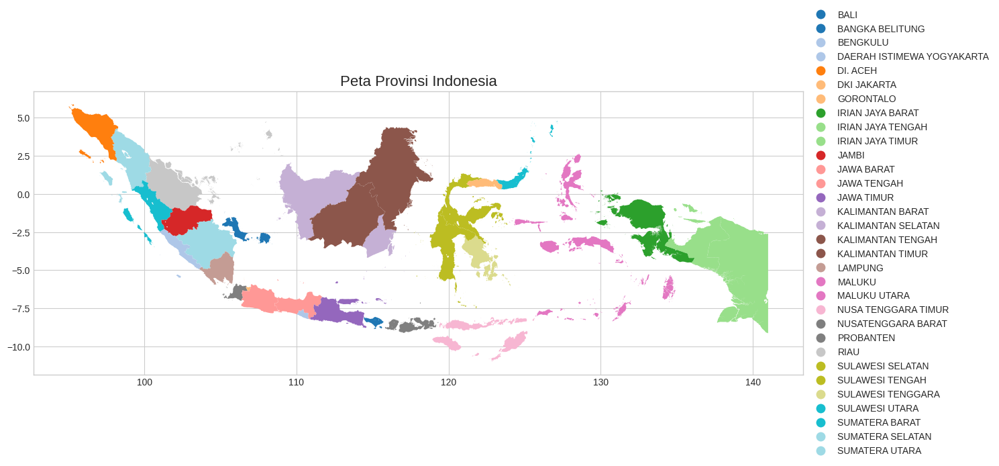

In [ ]:
# Visualisasi peta provinsi Indonesia
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
provinces.plot(column='Propinsi', cmap='tab20', legend=True,
               legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},
               ax=ax)
ax.set_title('Peta Provinsi Indonesia', fontsize=16)
plt.tight_layout()
plt.show()

## 3. Preprocessing Data

### 3.1 Konversi Data Gempa ke GeoDataFrame

In [ ]:
# Konversi DataFrame gempa ke GeoDataFrame
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf_earthquakes = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# Tampilkan beberapa baris pertama
gdf_earthquakes.head()

,id,time,place,magnitude,depth_km,longitude,latitude,geometry
0,us7000pvgi,2025-04-27 22:13:45,"54 km SSW of Modisi, Indonesia",4.5,89.601,124.2330,0.0015,POINT (124.233 0.0015)
1,us7000pz07,2025-04-27 12:19:09,"165 km WNW of Tobelo, Indonesia",4.2,56.657,126.6207,2.2623,POINT (126.6207 2.2623)
2,us7000pyvg,2025-04-26 18:59:09,"58 km SW of Gunungsitoli, Indonesia",4.3,10.000,97.2178,0.9414,POINT (97.2178 0.9414)
3,us7000pyvc,2025-04-26 16:27:41,"224 km NW of Tobelo, Indonesia",4.5,50.398,126.7872,3.3479,POINT (126.7872 3.3479)
4,us7000pyva,2025-04-26 10:25:22,"198 km NNW of Manado, Indonesia",4.1,347.298,124.3531,3.2110,POINT (124.3531 3.211)


### 3.2 Spatial Join untuk Menentukan Provinsi dari Setiap Gempa

In [ ]:
# Pastikan CRS sama
if provinces.crs != gdf_earthquakes.crs:
    provinces = provinces.to_crs(gdf_earthquakes.crs)

# Lakukan spatial join untuk menentukan provinsi dari setiap gempa
gdf_earthquakes_with_province = gpd.sjoin(gdf_earthquakes, provinces, how="left", predicate="within")

# Tampilkan hasil
print(f"Jumlah gempa sebelum spatial join: {len(gdf_earthquakes)}")
print(f"Jumlah gempa setelah spatial join: {len(gdf_earthquakes_with_province)}")
print(f"Jumlah gempa dengan provinsi teridentifikasi: {gdf_earthquakes_with_province['Propinsi'].notna().sum()}")
print(f"Jumlah gempa tanpa provinsi (di luar batas Indonesia): {gdf_earthquakes_with_province['Propinsi'].isna().sum()}")

Jumlah gempa sebelum spatial join: 10808
Jumlah gempa setelah spatial join: 10808
Jumlah gempa dengan provinsi teridentifikasi: 1627
Jumlah gempa tanpa provinsi (di luar batas Indonesia): 9181


In [ ]:
# Tampilkan distribusi gempa per provinsi
province_counts = gdf_earthquakes_with_province['Propinsi'].value_counts()
print("Distribusi gempa per provinsi:")
province_counts

Distribusi gempa per provinsi:


,count
Propinsi,
IRIAN JAYA TIMUR,385
MALUKU UTARA,130
MALUKU,124
NUSA TENGGARA TIMUR,96
SUMATERA UTARA,92
IRIAN JAYA TENGAH,90
SULAWESI TENGAH,73
IRIAN JAYA BARAT,72
SULAWESI UTARA,70


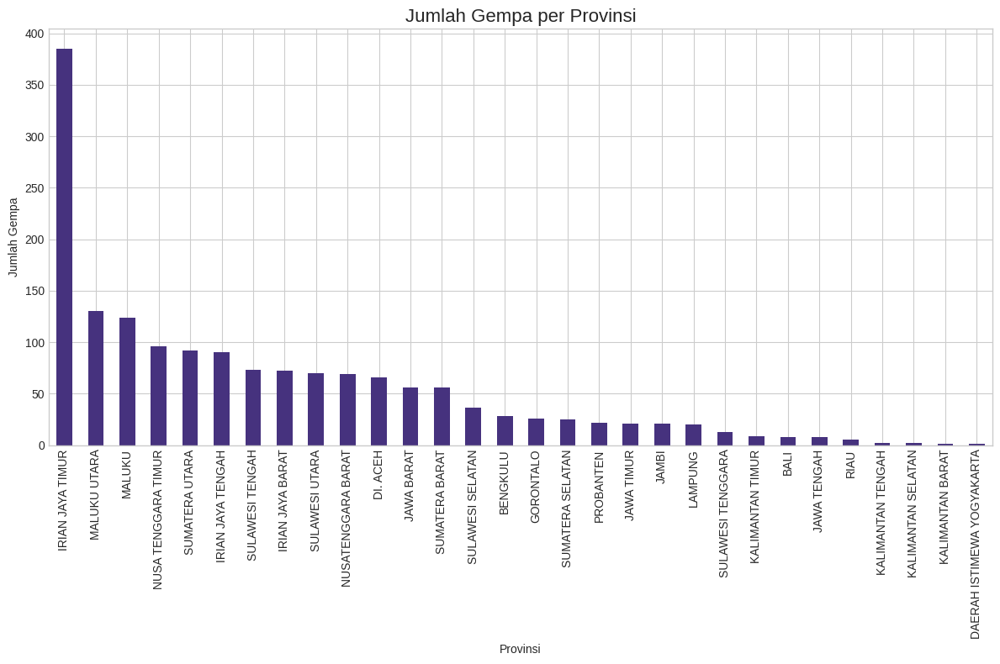

In [ ]:
# Visualisasi distribusi gempa per provinsi
plt.figure(figsize=(12, 8))
province_counts.plot(kind='bar')
plt.title('Jumlah Gempa per Provinsi', fontsize=16)
plt.xlabel('Provinsi')
plt.ylabel('Jumlah Gempa')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### 3.3 Visualisasi Distribusi Spasial Gempa per Provinsi

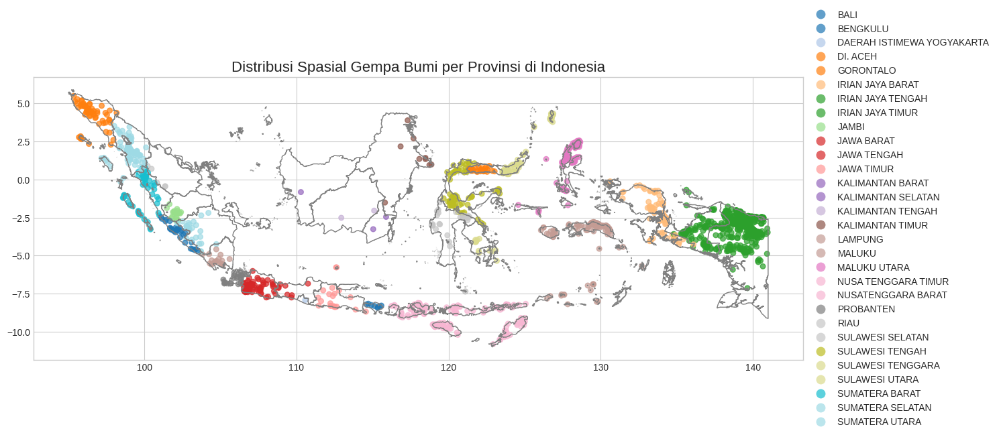

In [ ]:
# Visualisasi distribusi spasial gempa dengan warna berdasarkan provinsi
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plot batas provinsi
provinces.boundary.plot(ax=ax, linewidth=1, color='gray')

# Plot gempa dengan warna berdasarkan provinsi
gdf_earthquakes_with_province.plot(column='Propinsi', cmap='tab20',
                                   markersize=30, alpha=0.7,
                                   legend=True,
                                   legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},
                                   ax=ax)

ax.set_title('Distribusi Spasial Gempa Bumi per Provinsi di Indonesia', fontsize=16)
plt.tight_layout()
plt.show()

## 4. Clustering Spasial per Provinsi

### 4.1 Fungsi untuk Menentukan Parameter Optimal DBSCAN

In [ ]:
def find_optimal_dbscan_params(X, eps_values, min_samples_values):
    """
    Fungsi untuk mencari parameter optimal DBSCAN berdasarkan silhouette score

    Parameters:
    -----------
    X : array-like
        Data untuk clustering
    eps_values : list
        List nilai eps yang akan dicoba
    min_samples_values : list
        List nilai min_samples yang akan dicoba

    Returns:
    --------
    best_params : dict
        Parameter terbaik (eps, min_samples)
    best_silhouette : float
        Silhouette score terbaik
    results_df : DataFrame
        DataFrame berisi hasil semua kombinasi parameter
    """
    best_silhouette = -1
    best_params = {}
    results = []

    for eps in eps_values:
        for min_samples in min_samples_values:
            # Fit DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)

            # Hitung jumlah cluster (tidak termasuk noise dengan label -1)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)

            # Hitung silhouette score jika ada lebih dari 1 cluster
            silhouette = -1
            if n_clusters > 1:
                # Filter out noise points for silhouette calculation
                mask = labels != -1
                if np.sum(mask) > 1:  # Ensure we have at least 2 points
                    silhouette = silhouette_score(X[mask], labels[mask])

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'silhouette': silhouette
            }
            results.append(result)

            if silhouette > best_silhouette:
                best_silhouette = silhouette
                best_params = {'eps': eps, 'min_samples': min_samples}

    results_df = pd.DataFrame(results)
    return best_params, best_silhouette, results_df

### 4.2 Fungsi untuk Clustering DBSCAN dan OPTICS per Provinsi

In [ ]:
def perform_clustering_by_province(gdf, min_earthquakes=1):
    """
    Melakukan clustering DBSCAN dan OPTICS untuk setiap provinsi

    Parameters:
    -----------
    gdf : GeoDataFrame
        GeoDataFrame berisi data gempa dengan kolom provinsi
    min_earthquakes : int
        Jumlah minimum gempa untuk melakukan clustering (default: 1, untuk semua provinsi)

    Returns:
    --------
    results : dict
        Dictionary berisi hasil clustering per provinsi
    """
    # Siapkan dictionary untuk menyimpan hasil
    results = {}

    # Daftar provinsi dengan jumlah gempa yang cukup
    provinces_to_analyze = gdf['Propinsi'].value_counts()
    provinces_to_analyze = provinces_to_analyze[provinces_to_analyze >= min_earthquakes].index.tolist()

    print(f"Melakukan clustering untuk {len(provinces_to_analyze)} provinsi dengan minimal {min_earthquakes} gempa...")

    # Nilai eps dan min_samples yang akan dicoba
    eps_values = [0.1, 0.2, 0.3, 0.5, 1.0]
    min_samples_values = [2, 3, 5, 10]  # Menggunakan min_samples=2 untuk provinsi dengan sedikit gempa

    # Lakukan clustering untuk setiap provinsi
    for province in provinces_to_analyze:
        print(f"\nAnalisis clustering untuk provinsi: {province}")

        # Filter data untuk provinsi tertentu
        province_data = gdf[gdf['Propinsi'] == province].copy()

        # Ekstrak koordinat untuk clustering
        X = province_data[['longitude', 'latitude']].values

        # Standardisasi fitur magnitude dan depth_km untuk analisis karakteristik
        scaler = StandardScaler()
        province_data[['magnitude_scaled', 'depth_km_scaled']] = scaler.fit_transform(province_data[['magnitude', 'depth_km']])

        # Jika provinsi memiliki terlalu sedikit gempa untuk clustering bermakna
        if len(province_data) < 3:
            print(f"Provinsi {province} hanya memiliki {len(province_data)} gempa, tidak cukup untuk clustering bermakna.")
            # Tetap lakukan clustering sederhana
            province_data['dbscan_cluster'] = 0  # Semua titik dalam satu cluster
            province_data['optics_cluster'] = 0  # Semua titik dalam satu cluster

            # Simpan hasil
            results[province] = {
                'data': province_data,
                'dbscan': {
                    'params': {'eps': 0.5, 'min_samples': 2},
                    'silhouette': -1,
                    'n_clusters': 1,
                    'n_noise': 0,
                    'results_df': pd.DataFrame()
                },
                'optics': {
                    'params': {'min_samples': 2, 'xi': 0.05, 'min_cluster_size': 0.05},
                    'silhouette': -1,
                    'n_clusters': 1,
                    'n_noise': 0
                }
            }
            continue

        # 1. DBSCAN Clustering
        print("Mencari parameter optimal untuk DBSCAN...")
        best_params, best_silhouette, results_df = find_optimal_dbscan_params(X, eps_values, min_samples_values)

        # Jika tidak ada parameter optimal yang ditemukan, gunakan default
        if not best_params:
            best_params = {'eps': 0.5, 'min_samples': 2}
            print(f"Tidak dapat menemukan parameter optimal, menggunakan default: eps={best_params['eps']}, min_samples={best_params['min_samples']}")
        else:
            print(f"Parameter optimal DBSCAN: eps={best_params['eps']}, min_samples={best_params['min_samples']}")
            print(f"Silhouette score: {best_silhouette:.4f}")

        # Fit DBSCAN dengan parameter optimal
        dbscan = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])
        dbscan_labels = dbscan.fit_predict(X)
        province_data['dbscan_cluster'] = dbscan_labels

        # Hitung statistik cluster
        n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
        n_noise = list(dbscan_labels).count(-1)
        print(f"Jumlah cluster DBSCAN: {n_clusters}")
        print(f"Jumlah noise points: {n_noise} ({n_noise/len(province_data)*100:.2f}%)")

        # 2. OPTICS Clustering
        print("\nMelakukan clustering dengan OPTICS...")
        min_samples = min(5, max(2, len(province_data) // 10))  # Adaptif berdasarkan jumlah data
        optics = OPTICS(min_samples=min_samples, xi=0.05, min_cluster_size=0.05)
        optics_labels = optics.fit_predict(X)
        province_data['optics_cluster'] = optics_labels

        # Hitung statistik cluster OPTICS
        n_clusters_optics = len(set(optics_labels)) - (1 if -1 in optics_labels else 0)
        n_noise_optics = list(optics_labels).count(-1)
        print(f"Jumlah cluster OPTICS: {n_clusters_optics}")
        print(f"Jumlah noise points OPTICS: {n_noise_optics} ({n_noise_optics/len(province_data)*100:.2f}%)")

        # Hitung silhouette score untuk OPTICS jika ada lebih dari 1 cluster
        optics_silhouette = -1
        if n_clusters_optics > 1:
            mask = optics_labels != -1
            if np.sum(mask) > 1:  # Ensure we have at least 2 points
                optics_silhouette = silhouette_score(X[mask], optics_labels[mask])
                print(f"Silhouette score OPTICS: {optics_silhouette:.4f}")

        # Simpan hasil
        results[province] = {
            'data': province_data,
            'dbscan': {
                'params': best_params,
                'silhouette': best_silhouette,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'results_df': results_df
            },
            'optics': {
                'params': {'min_samples': min_samples, 'xi': 0.05, 'min_cluster_size': 0.05},
                'silhouette': optics_silhouette,
                'n_clusters': n_clusters_optics,
                'n_noise': n_noise_optics
            }
        }

    return results

In [ ]:
# Lakukan clustering per provinsi untuk SEMUA provinsi (min_earthquakes=1)
clustering_results = perform_clustering_by_province(gdf_earthquakes_with_province, min_earthquakes=1)

Melakukan clustering untuk 30 provinsi dengan minimal 1 gempa...

Analisis clustering untuk provinsi: IRIAN JAYA TIMUR
Mencari parameter optimal untuk DBSCAN...
Parameter optimal DBSCAN: eps=0.1, min_samples=10
Silhouette score: 0.6190
Jumlah cluster DBSCAN: 7
Jumlah noise points: 241 (62.60%)

Melakukan clustering dengan OPTICS...
Jumlah cluster OPTICS: 7
Jumlah noise points OPTICS: 221 (57.40%)
Silhouette score OPTICS: 0.6818

Analisis clustering untuk provinsi: MALUKU UTARA
Mencari parameter optimal untuk DBSCAN...
Parameter optimal DBSCAN: eps=0.1, min_samples=10
Silhouette score: 0.8568
Jumlah cluster DBSCAN: 2
Jumlah noise points: 61 (46.92%)

Melakukan clustering dengan OPTICS...
Jumlah cluster OPTICS: 6
Jumlah noise points OPTICS: 53 (40.77%)
Silhouette score OPTICS: 0.6974

Analisis clustering untuk provinsi: MALUKU
Mencari parameter optimal untuk DBSCAN...
Parameter optimal DBSCAN: eps=0.2, min_samples=5
Silhouette score: 0.8507
Jumlah cluster DBSCAN: 2
Jumlah noise points: 4

## 5. Visualisasi Hasil Clustering per Provinsi

---



In [ ]:
def visualize_clustering_results(province_name, province_results, provinces_gdf, save_path=None):
    """
    Visualisasi hasil clustering untuk satu provinsi

    Parameters:
    -----------
    province_name : str
        Nama provinsi
    province_results : dict
        Dictionary berisi hasil clustering untuk provinsi tersebut
    provinces_gdf : GeoDataFrame
        GeoDataFrame berisi batas provinsi
    """
    # Ambil data provinsi
    province_data = province_results['data']
    province_boundary = provinces_gdf[provinces_gdf['Propinsi'] == province_name]

    # Buat figure dengan 2 subplot (DBSCAN dan OPTICS)
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    # Plot batas provinsi
    province_boundary.boundary.plot(ax=axes[0], linewidth=1, color='black')
    province_boundary.boundary.plot(ax=axes[1], linewidth=1, color='black')

    # 1. Plot hasil DBSCAN
    # Tentukan warna berdasarkan cluster
    unique_labels = sorted(set(province_data['dbscan_cluster']))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Noise points (black)
            col = [0, 0, 0, 1]

        class_mask = province_data['dbscan_cluster'] == k
        axes[0].scatter(province_data.loc[class_mask, 'longitude'],
                      province_data.loc[class_mask, 'latitude'],
                      c=[col], s=50, alpha=0.7, edgecolor='k', linewidth=0.3,
                      label=f'Cluster {k}' if k != -1 else 'Noise')

    # Tambahkan judul dan legenda
    dbscan_params = province_results['dbscan']['params']
    dbscan_silhouette = province_results['dbscan']['silhouette']
    axes[0].set_title(f'DBSCAN Clustering - {province_name}\n'
                    f'eps={dbscan_params.get("eps", "N/A")}, '
                    f'min_samples={dbscan_params.get("min_samples", "N/A")}, '
                    f'Silhouette={dbscan_silhouette:.4f}', fontsize=12)
    axes[0].legend(loc='upper right')

    # 2. Plot hasil OPTICS
    unique_labels = sorted(set(province_data['optics_cluster']))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Noise points (black)
            col = [0, 0, 0, 1]

        class_mask = province_data['optics_cluster'] == k
        axes[1].scatter(province_data.loc[class_mask, 'longitude'],
                      province_data.loc[class_mask, 'latitude'],
                      c=[col], s=50, alpha=0.7, edgecolor='k', linewidth=0.3,
                      label=f'Cluster {k}' if k != -1 else 'Noise')

    # Tambahkan judul dan legenda
    optics_params = province_results['optics']['params']
    optics_silhouette = province_results['optics']['silhouette']
    axes[1].set_title(f'OPTICS Clustering - {province_name}\n'
                     f'min_samples={optics_params.get("min_samples", "N/A")}, '
                     f'Silhouette={optics_silhouette:.4f}', fontsize=12)
    axes[1].legend(loc='upper right')

    plt.tight_layout()
    if save_path:
        os.makedirs(save_path, exist_ok=True)
        filename = f"{province_name.replace(' ', '_')}_clustering.png"
        file_path = os.path.join(save_path, filename)
        plt.savefig(file_path, dpi=300)
        print(f"Hasil clustering untuk {province_name} disimpan di: {file_path}")

    plt.show()


Visualisasi hasil clustering untuk provinsi: IRIAN JAYA TIMUR
Hasil clustering untuk IRIAN JAYA TIMUR disimpan di: hasil_visualisasi/IRIAN_JAYA_TIMUR_clustering.png


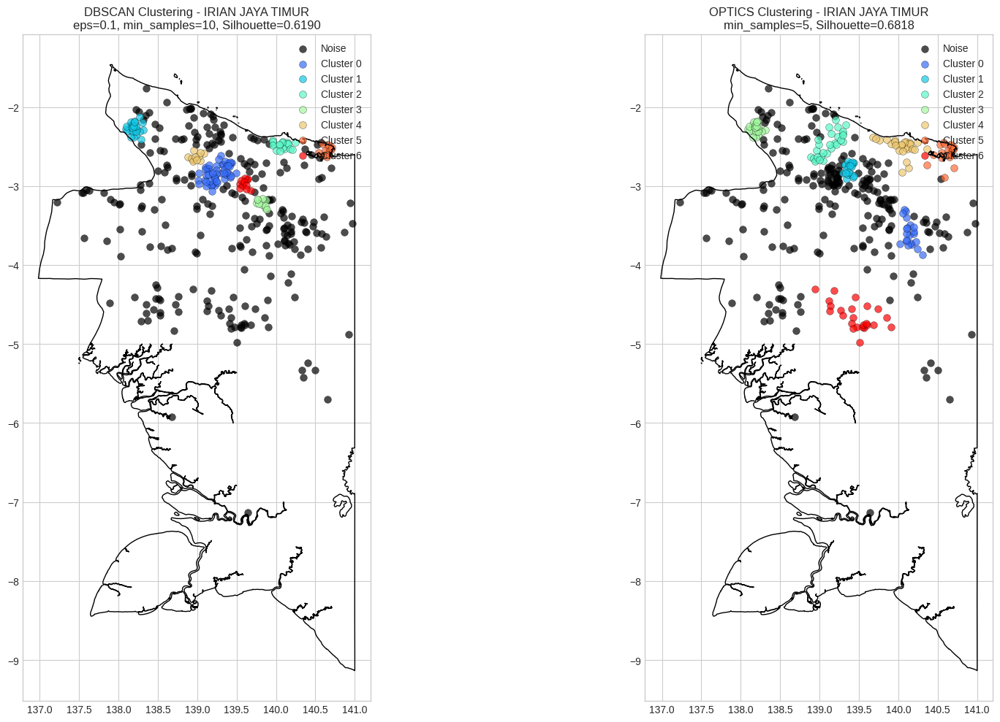


Visualisasi hasil clustering untuk provinsi: MALUKU UTARA
Hasil clustering untuk MALUKU UTARA disimpan di: hasil_visualisasi/MALUKU_UTARA_clustering.png


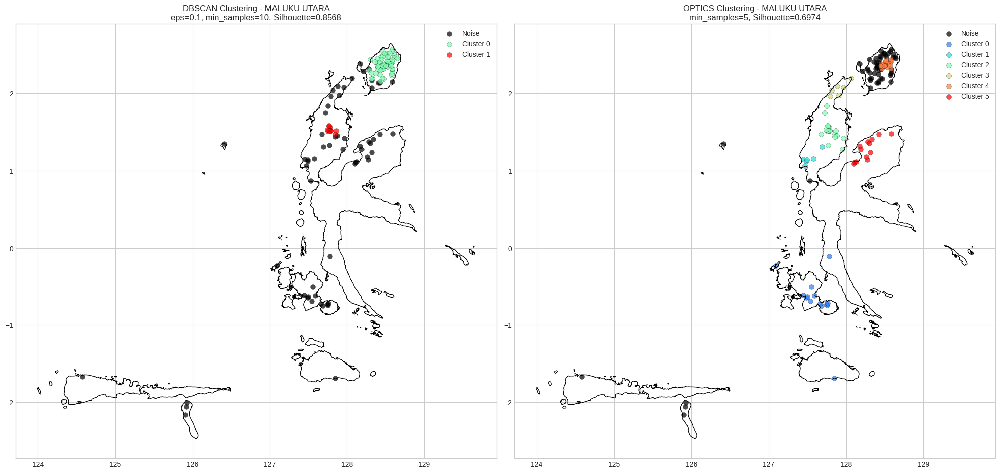


Visualisasi hasil clustering untuk provinsi: MALUKU
Hasil clustering untuk MALUKU disimpan di: hasil_visualisasi/MALUKU_clustering.png


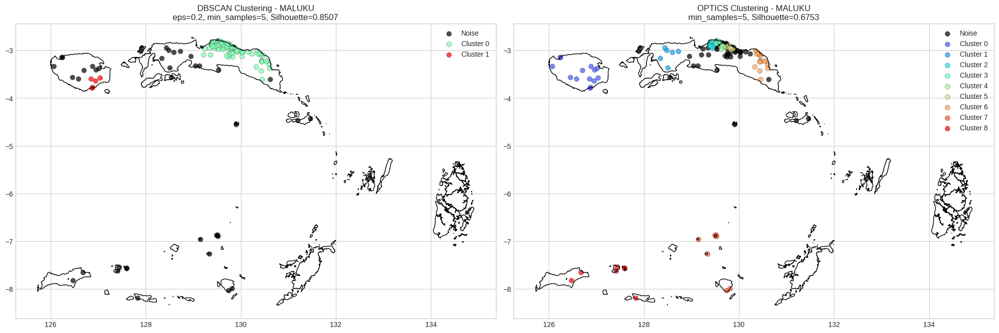


Visualisasi hasil clustering untuk provinsi: NUSA TENGGARA TIMUR
Hasil clustering untuk NUSA TENGGARA TIMUR disimpan di: hasil_visualisasi/NUSA_TENGGARA_TIMUR_clustering.png


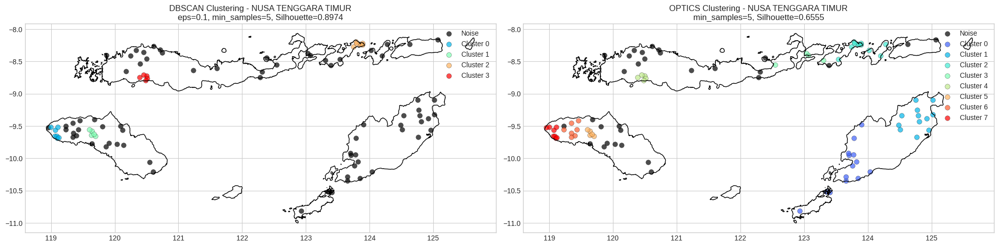


Visualisasi hasil clustering untuk provinsi: SUMATERA UTARA
Hasil clustering untuk SUMATERA UTARA disimpan di: hasil_visualisasi/SUMATERA_UTARA_clustering.png


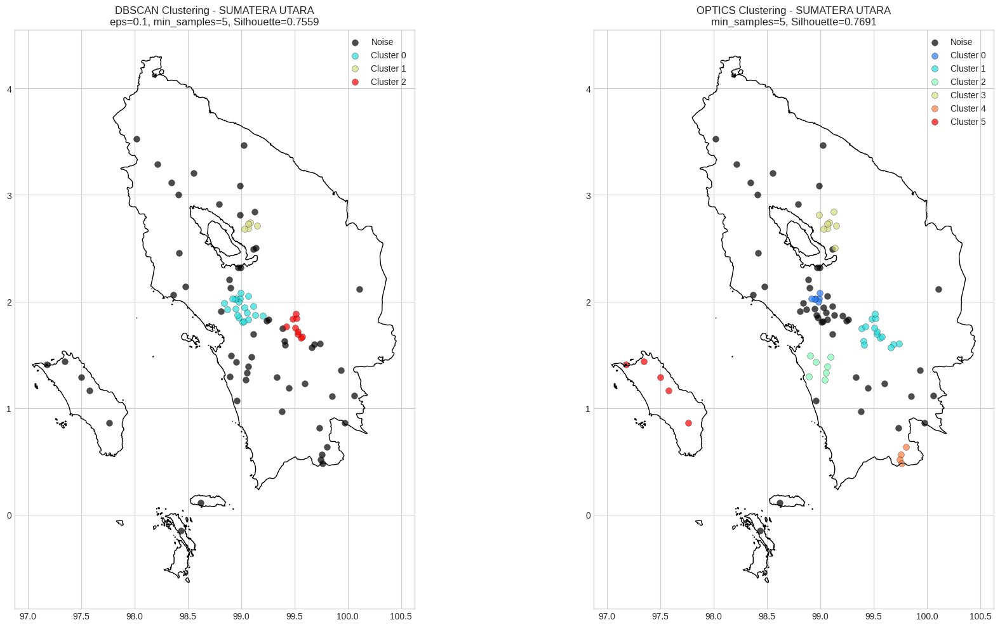


Visualisasi hasil clustering untuk provinsi: IRIAN JAYA TENGAH
Hasil clustering untuk IRIAN JAYA TENGAH disimpan di: hasil_visualisasi/IRIAN_JAYA_TENGAH_clustering.png


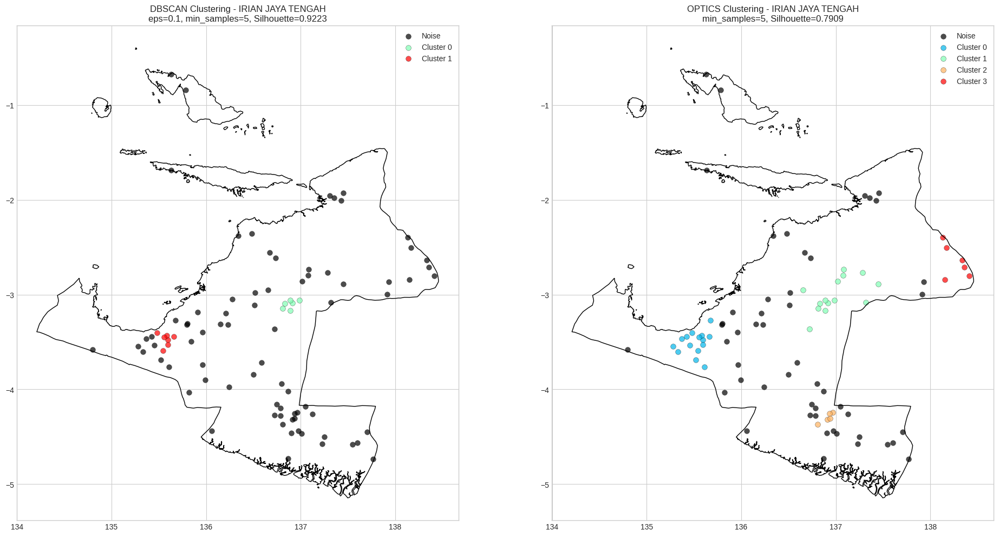


Visualisasi hasil clustering untuk provinsi: SULAWESI TENGAH
Hasil clustering untuk SULAWESI TENGAH disimpan di: hasil_visualisasi/SULAWESI_TENGAH_clustering.png


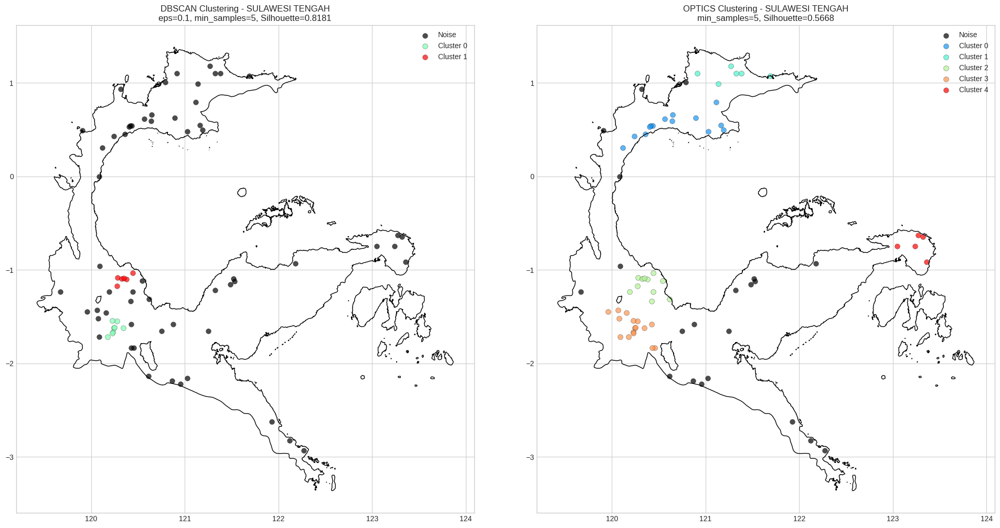


Visualisasi hasil clustering untuk provinsi: IRIAN JAYA BARAT
Hasil clustering untuk IRIAN JAYA BARAT disimpan di: hasil_visualisasi/IRIAN_JAYA_BARAT_clustering.png


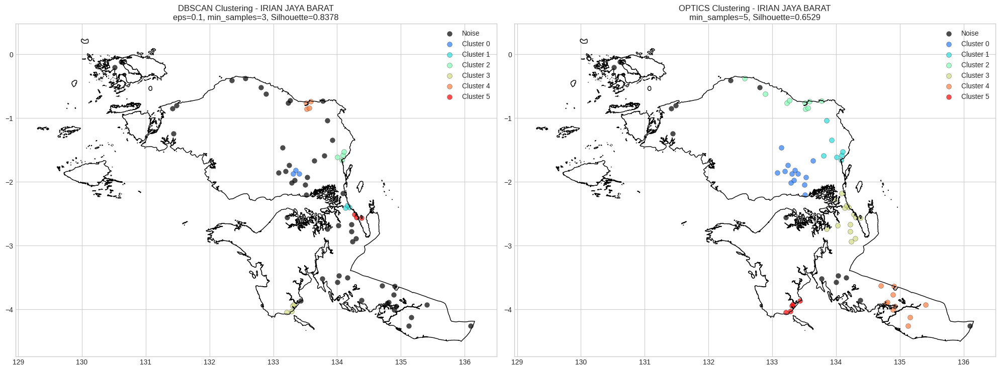


Visualisasi hasil clustering untuk provinsi: SULAWESI UTARA
Hasil clustering untuk SULAWESI UTARA disimpan di: hasil_visualisasi/SULAWESI_UTARA_clustering.png


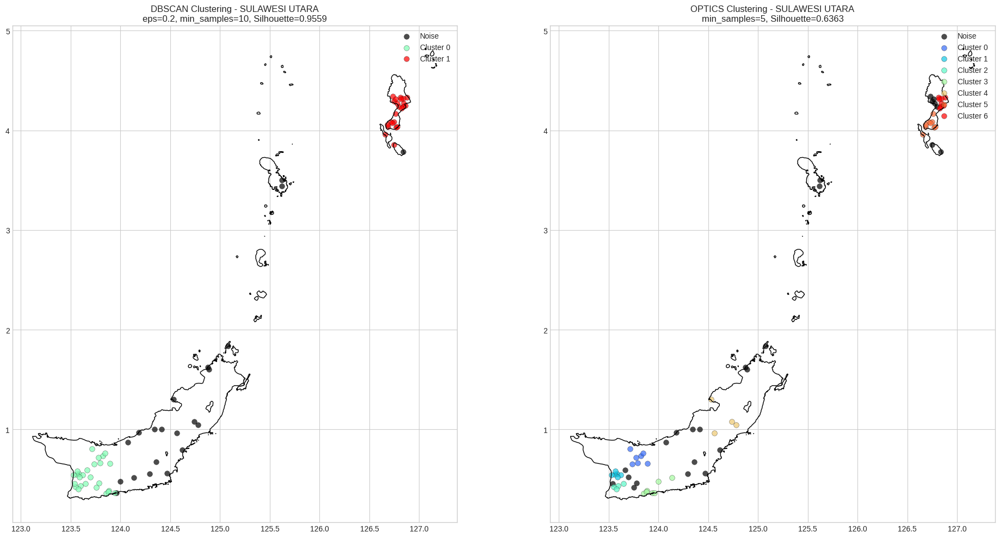


Visualisasi hasil clustering untuk provinsi: NUSATENGGARA BARAT
Hasil clustering untuk NUSATENGGARA BARAT disimpan di: hasil_visualisasi/NUSATENGGARA_BARAT_clustering.png


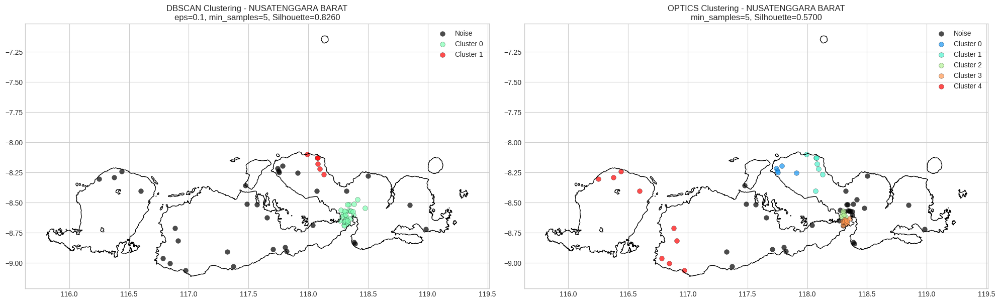


Visualisasi hasil clustering untuk provinsi: DI. ACEH
Hasil clustering untuk DI. ACEH disimpan di: hasil_visualisasi/DI._ACEH_clustering.png


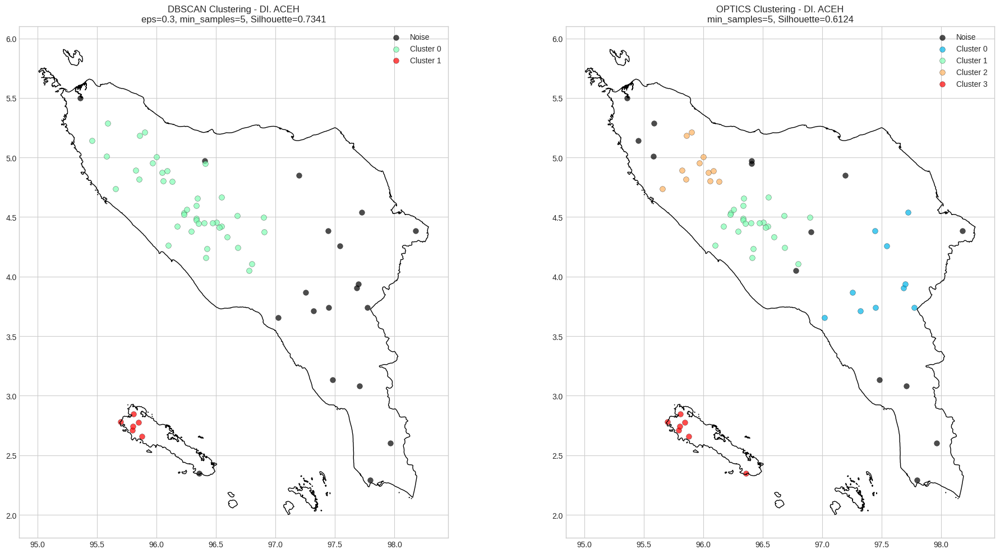


Visualisasi hasil clustering untuk provinsi: JAWA BARAT
Hasil clustering untuk JAWA BARAT disimpan di: hasil_visualisasi/JAWA_BARAT_clustering.png


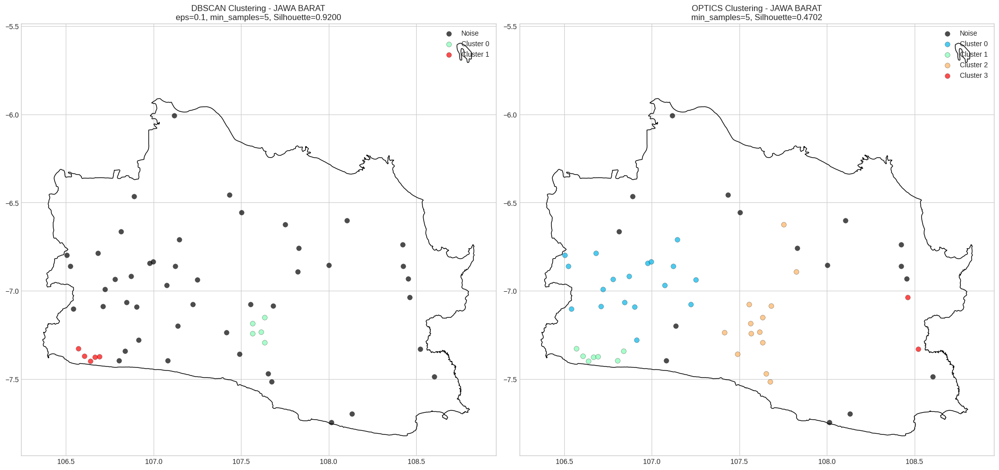


Visualisasi hasil clustering untuk provinsi: SUMATERA BARAT
Hasil clustering untuk SUMATERA BARAT disimpan di: hasil_visualisasi/SUMATERA_BARAT_clustering.png


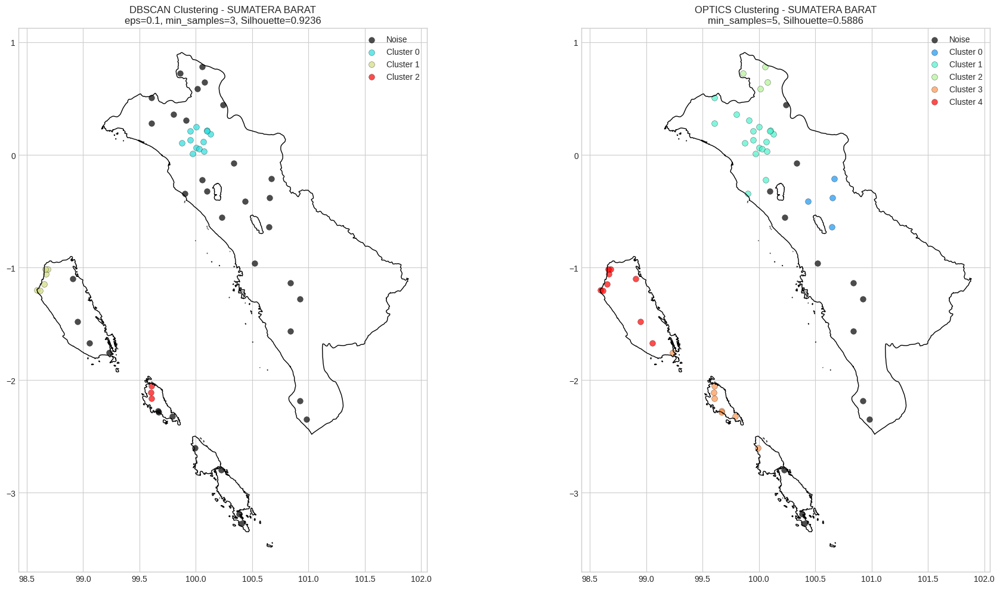


Visualisasi hasil clustering untuk provinsi: SULAWESI SELATAN
Hasil clustering untuk SULAWESI SELATAN disimpan di: hasil_visualisasi/SULAWESI_SELATAN_clustering.png


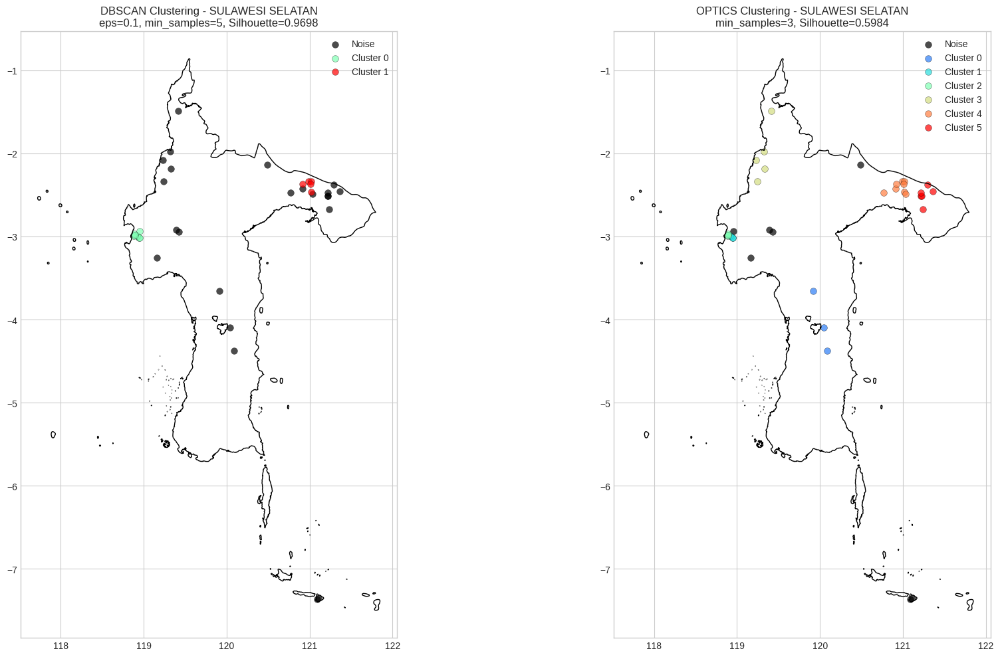


Visualisasi hasil clustering untuk provinsi: BENGKULU
Hasil clustering untuk BENGKULU disimpan di: hasil_visualisasi/BENGKULU_clustering.png


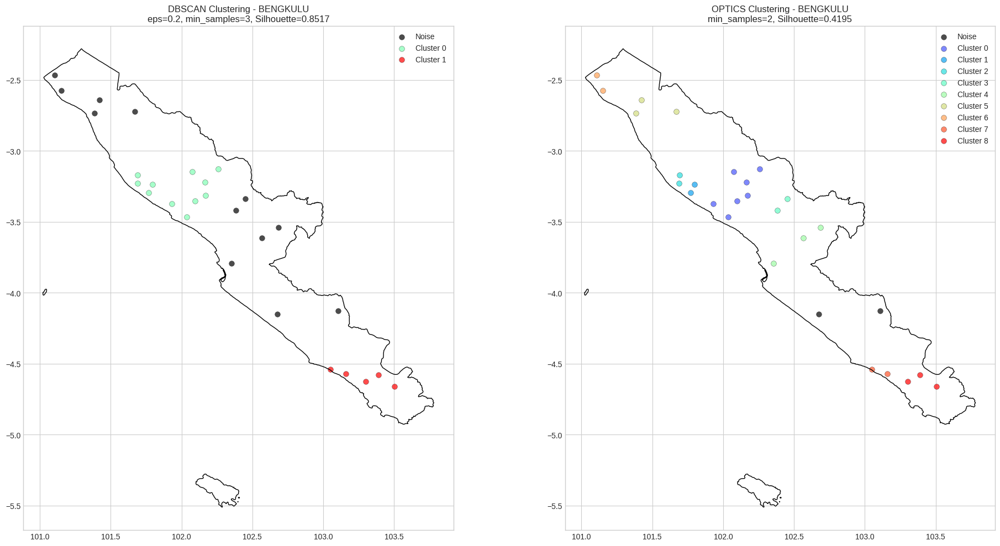


Visualisasi hasil clustering untuk provinsi: GORONTALO
Hasil clustering untuk GORONTALO disimpan di: hasil_visualisasi/GORONTALO_clustering.png


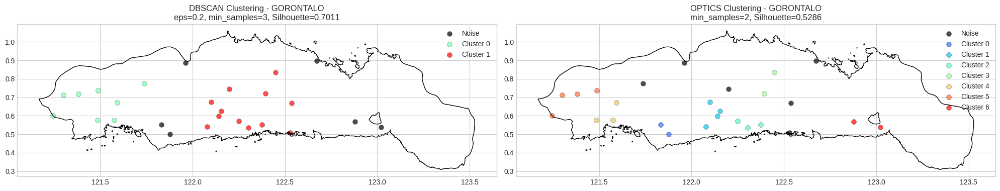


Visualisasi hasil clustering untuk provinsi: SUMATERA SELATAN
Hasil clustering untuk SUMATERA SELATAN disimpan di: hasil_visualisasi/SUMATERA_SELATAN_clustering.png


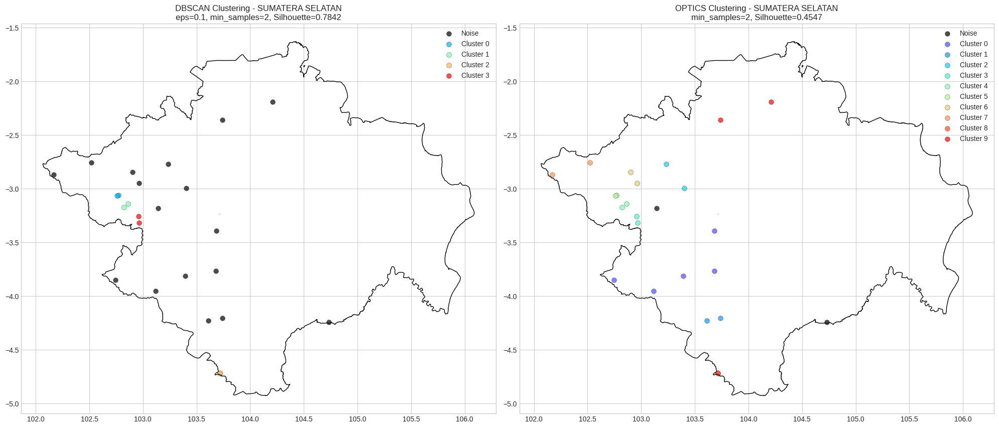


Visualisasi hasil clustering untuk provinsi: PROBANTEN
Hasil clustering untuk PROBANTEN disimpan di: hasil_visualisasi/PROBANTEN_clustering.png


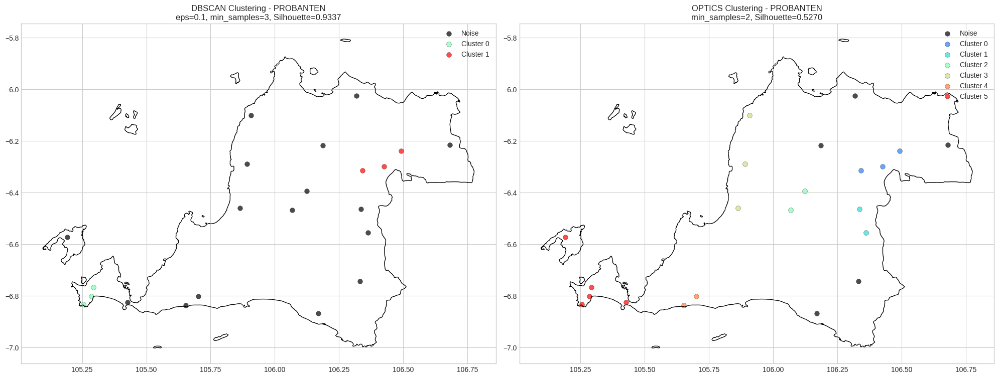


Visualisasi hasil clustering untuk provinsi: JAWA TIMUR
Hasil clustering untuk JAWA TIMUR disimpan di: hasil_visualisasi/JAWA_TIMUR_clustering.png


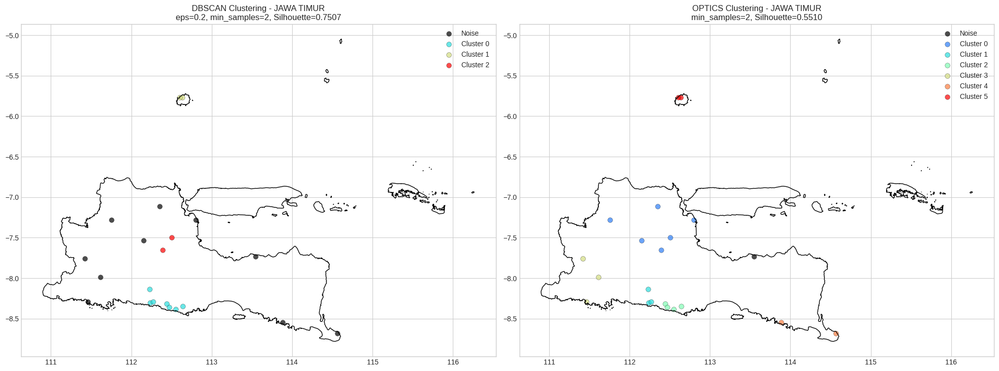


Visualisasi hasil clustering untuk provinsi: JAMBI
Hasil clustering untuk JAMBI disimpan di: hasil_visualisasi/JAMBI_clustering.png


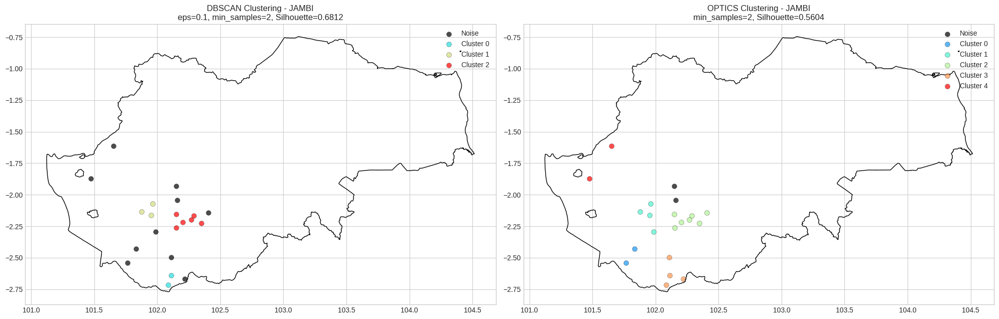


Visualisasi hasil clustering untuk provinsi: LAMPUNG
Hasil clustering untuk LAMPUNG disimpan di: hasil_visualisasi/LAMPUNG_clustering.png


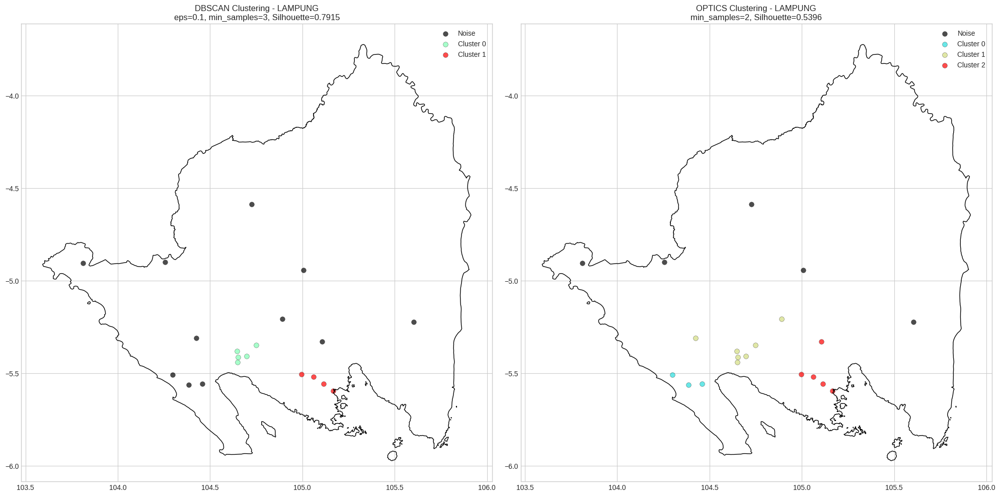


Visualisasi hasil clustering untuk provinsi: SULAWESI TENGGARA
Hasil clustering untuk SULAWESI TENGGARA disimpan di: hasil_visualisasi/SULAWESI_TENGGARA_clustering.png


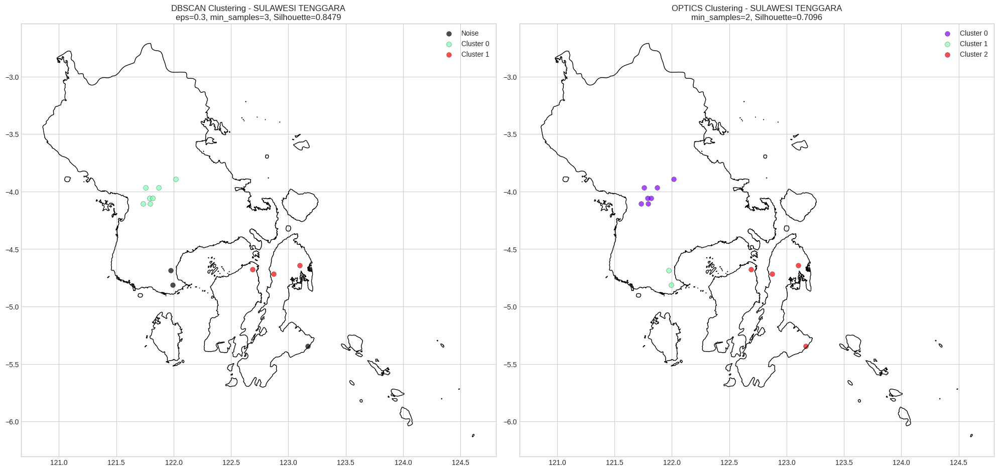


Visualisasi hasil clustering untuk provinsi: KALIMANTAN TIMUR
Hasil clustering untuk KALIMANTAN TIMUR disimpan di: hasil_visualisasi/KALIMANTAN_TIMUR_clustering.png


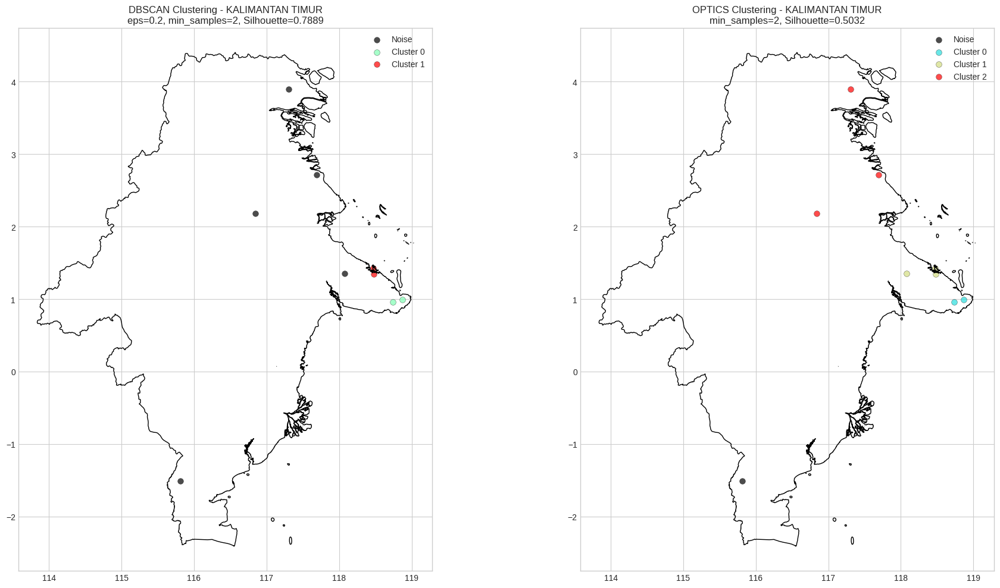


Visualisasi hasil clustering untuk provinsi: BALI
Hasil clustering untuk BALI disimpan di: hasil_visualisasi/BALI_clustering.png


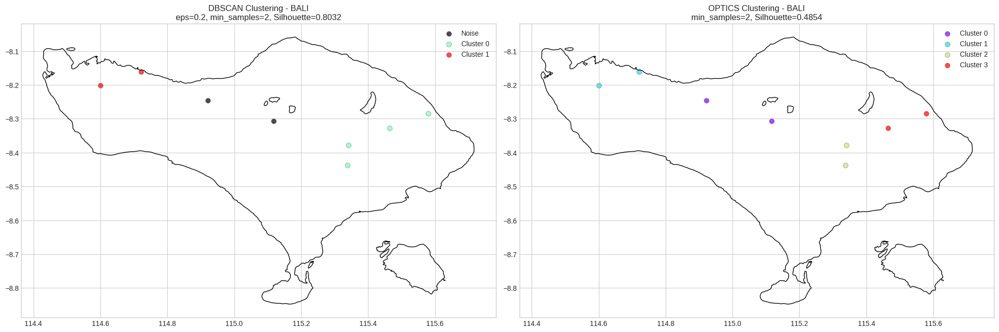


Visualisasi hasil clustering untuk provinsi: JAWA TENGAH
Hasil clustering untuk JAWA TENGAH disimpan di: hasil_visualisasi/JAWA_TENGAH_clustering.png


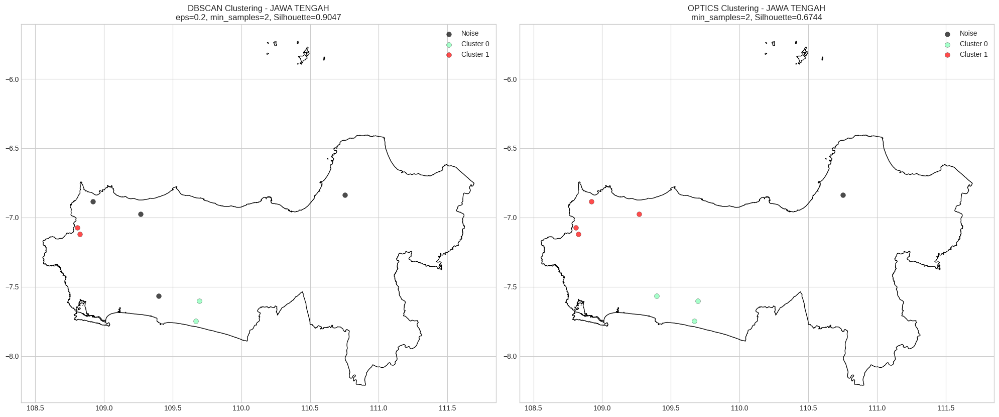


Visualisasi hasil clustering untuk provinsi: RIAU
Hasil clustering untuk RIAU disimpan di: hasil_visualisasi/RIAU_clustering.png


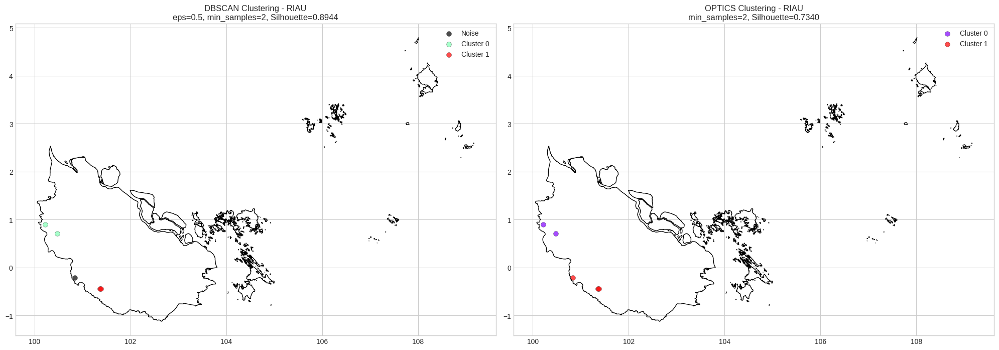


Visualisasi hasil clustering untuk provinsi: KALIMANTAN TENGAH
Hasil clustering untuk KALIMANTAN TENGAH disimpan di: hasil_visualisasi/KALIMANTAN_TENGAH_clustering.png


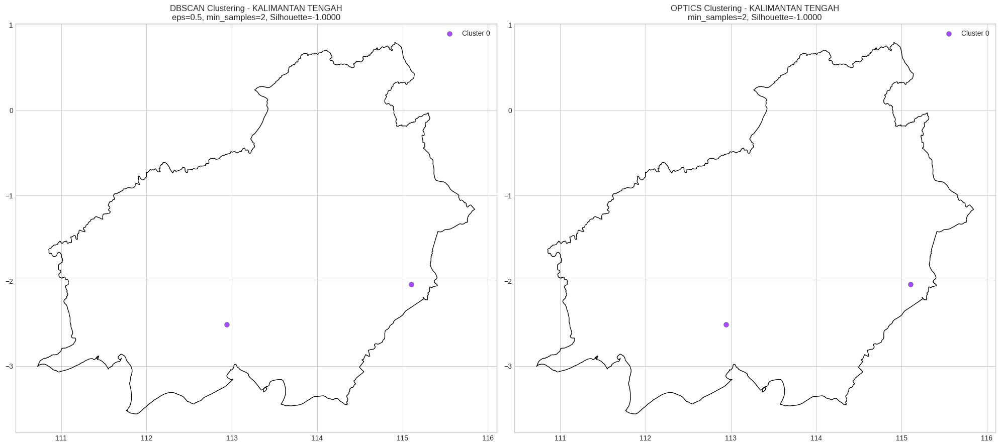


Visualisasi hasil clustering untuk provinsi: KALIMANTAN SELATAN
Hasil clustering untuk KALIMANTAN SELATAN disimpan di: hasil_visualisasi/KALIMANTAN_SELATAN_clustering.png


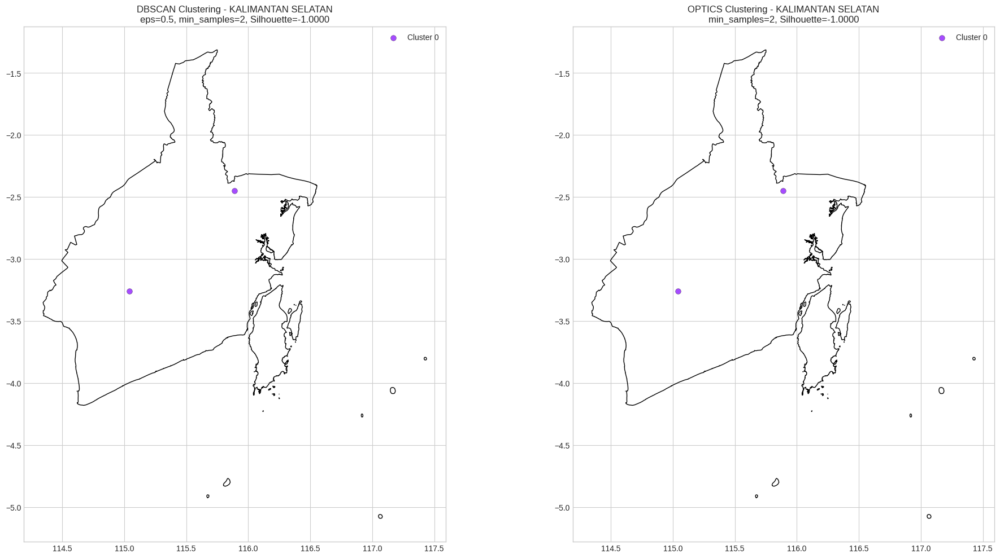


Visualisasi hasil clustering untuk provinsi: KALIMANTAN BARAT
Hasil clustering untuk KALIMANTAN BARAT disimpan di: hasil_visualisasi/KALIMANTAN_BARAT_clustering.png


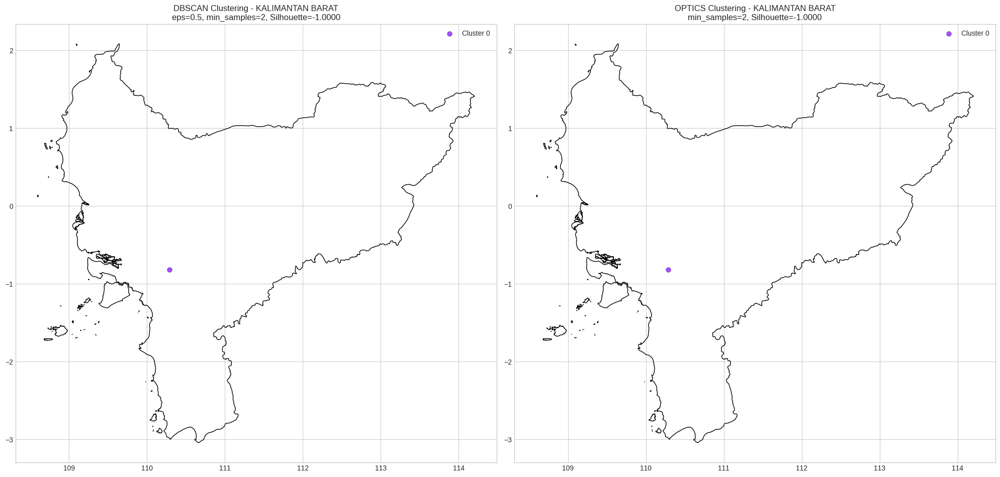


Visualisasi hasil clustering untuk provinsi: DAERAH ISTIMEWA YOGYAKARTA
Hasil clustering untuk DAERAH ISTIMEWA YOGYAKARTA disimpan di: hasil_visualisasi/DAERAH_ISTIMEWA_YOGYAKARTA_clustering.png


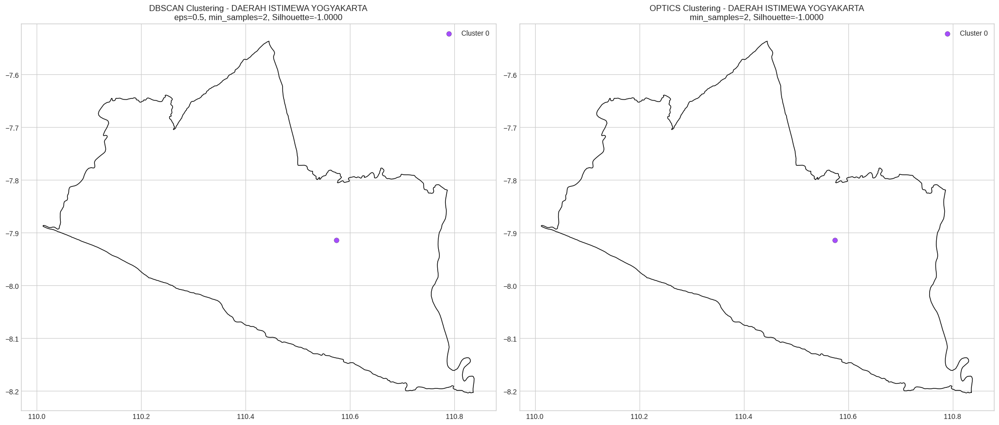

In [ ]:
# Visualisasi hasil clustering untuk setiap provinsi
output_folder = "hasil_visualisasi"

for province_name, province_results in clustering_results.items():
    print(f"\nVisualisasi hasil clustering untuk provinsi: {province_name}")
    visualize_clustering_results(province_name, province_results, provinces,save_path=output_folder)

## 6. Analisis Karakteristik Cluster per Provinsi

In [ ]:
def analyze_cluster_characteristics(province_name, province_results):
    """
    Analisis karakteristik cluster untuk satu provinsi

    Parameters:
    -----------
    province_name : str
        Nama provinsi
    province_results : dict
        Dictionary berisi hasil clustering untuk provinsi tersebut
    """
    # Ambil data provinsi
    province_data = province_results['data']

    # Jika provinsi memiliki terlalu sedikit gempa, tampilkan informasi sederhana
    if len(province_data) < 3:
        print(f"\n=== Analisis Karakteristik untuk Provinsi {province_name} ===\n")
        print(f"Provinsi {province_name} hanya memiliki {len(province_data)} gempa, tidak cukup untuk analisis cluster.")
        print("\nStatistik dasar:")
        print(province_data[['magnitude', 'depth_km']].describe())
        return

    print(f"\n=== Analisis Karakteristik Cluster untuk Provinsi {province_name} ===\n")

    # 1. Analisis DBSCAN
    print("1. Karakteristik Cluster DBSCAN:")
    dbscan_stats = province_data.groupby('dbscan_cluster').agg({
        'magnitude': ['mean', 'min', 'max', 'count'],
        'depth_km': ['mean', 'min', 'max']
    })
    print(dbscan_stats)

    # Visualisasi distribusi magnitude dan depth per cluster DBSCAN
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    sns.boxplot(x='dbscan_cluster', y='magnitude', data=province_data, ax=axes[0])
    axes[0].set_title(f'Distribusi Magnitude per Cluster DBSCAN - {province_name}')
    axes[0].set_xlabel('Cluster')
    axes[0].set_ylabel('Magnitude')

    sns.boxplot(x='dbscan_cluster', y='depth_km', data=province_data, ax=axes[1])
    axes[1].set_title(f'Distribusi Kedalaman per Cluster DBSCAN - {province_name}')
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel('Kedalaman (km)')

    plt.tight_layout()
    plt.show()

    # 2. Analisis OPTICS
    print("\n2. Karakteristik Cluster OPTICS:")
    optics_stats = province_data.groupby('optics_cluster').agg({
        'magnitude': ['mean', 'min', 'max', 'count'],
        'depth_km': ['mean', 'min', 'max']
    })
    print(optics_stats)

    # Visualisasi distribusi magnitude dan depth per cluster OPTICS
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    sns.boxplot(x='optics_cluster', y='magnitude', data=province_data, ax=axes[0])
    axes[0].set_title(f'Distribusi Magnitude per Cluster OPTICS - {province_name}')
    axes[0].set_xlabel('Cluster')
    axes[0].set_ylabel('Magnitude')

    sns.boxplot(x='optics_cluster', y='depth_km', data=province_data, ax=axes[1])
    axes[1].set_title(f'Distribusi Kedalaman per Cluster OPTICS - {province_name}')
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel('Kedalaman (km)')

    plt.tight_layout()
    plt.show()

    # 3. Analisis korelasi antara magnitude dan depth
    print("\n3. Korelasi antara Magnitude dan Kedalaman:")
    correlation = province_data[['magnitude', 'depth_km']].corr().iloc[0, 1]
    print(f"Korelasi Pearson: {correlation:.4f}")

    # Visualisasi scatter plot magnitude vs depth dengan warna berdasarkan cluster
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # DBSCAN
    scatter = axes[0].scatter(province_data['depth_km'], province_data['magnitude'],
                            c=province_data['dbscan_cluster'], cmap='viridis',
                            s=50, alpha=0.7, edgecolor='k')
    axes[0].set_title(f'Magnitude vs Kedalaman (DBSCAN) - {province_name}')
    axes[0].set_xlabel('Kedalaman (km)')
    axes[0].set_ylabel('Magnitude')
    legend1 = axes[0].legend(*scatter.legend_elements(), title="Cluster")
    axes[0].add_artist(legend1)

    # OPTICS
    scatter = axes[1].scatter(province_data['depth_km'], province_data['magnitude'],
                            c=province_data['optics_cluster'], cmap='viridis',
                            s=50, alpha=0.7, edgecolor='k')
    axes[1].set_title(f'Magnitude vs Kedalaman (OPTICS) - {province_name}')
    axes[1].set_xlabel('Kedalaman (km)')
    axes[1].set_ylabel('Magnitude')
    legend2 = axes[1].legend(*scatter.legend_elements(), title="Cluster")
    axes[1].add_artist(legend2)

    plt.tight_layout()
    plt.show()


=== Analisis Karakteristik Cluster untuk Provinsi IRIAN JAYA TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
dbscan_cluster                                                      
-1              4.468465  4.0  6.3   241  40.301091   5.000  155.803
 0              4.516981  4.0  6.0    53  41.880509  16.080  110.510
 1              4.674074  4.0  6.2    27  19.374296  10.000   40.905
 2              4.533333  4.0  5.5    18  22.311833  10.000   35.000
 3              4.530000  4.1  5.3    10  44.324400  29.420   73.066
 4              4.318182  3.9  4.9    11  38.772636  17.014   73.472
 5              4.500000  4.1  5.0    14  20.798286  10.000   31.651
 6              4.490909  4.1  5.1    11  51.696455  10.000  116.700


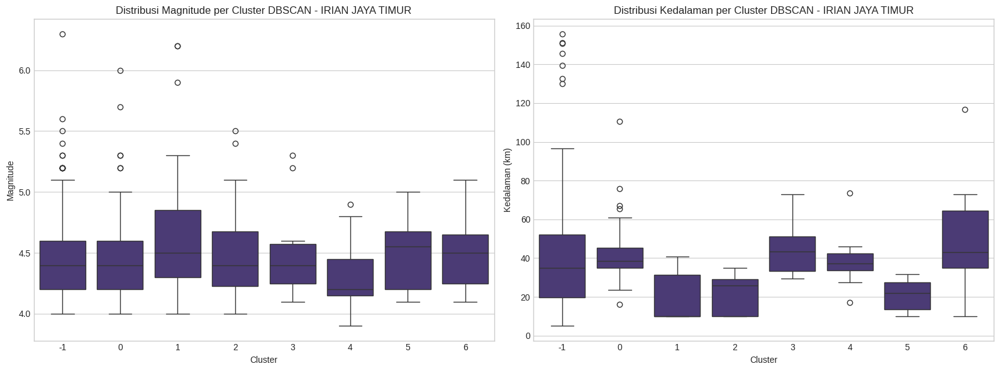


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
-1              4.481900  4.0  6.3   221  45.621303   6.550  155.803
 0              4.657143  4.1  5.6    21  40.512810  10.000   96.620
 1              4.463158  4.0  6.0    19  43.151895  16.080  110.510
 2              4.342857  3.9  5.0    28  32.841571   5.000   73.472
 3              4.700000  4.0  6.2    24  17.396750  10.000   40.905
 4              4.481481  4.0  5.5    27  22.503000   5.238   35.000
 5              4.461905  4.1  5.0    21  23.368286  10.000   37.080
 6              4.462500  4.1  5.2    24  16.590208   8.832   59.152


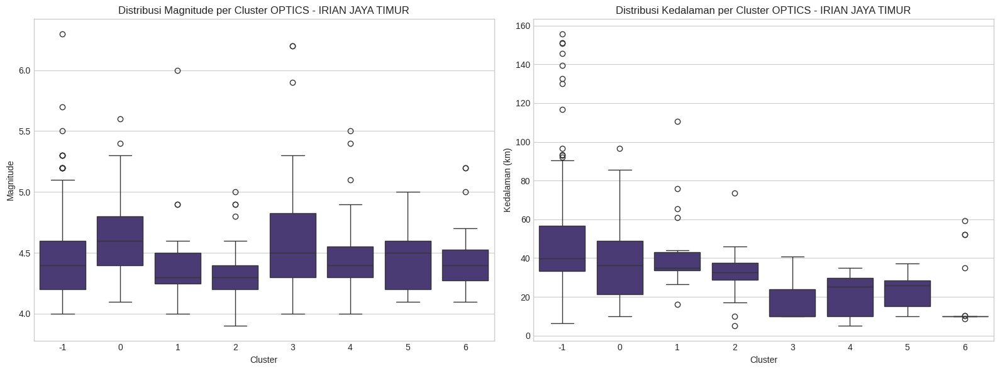


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0392


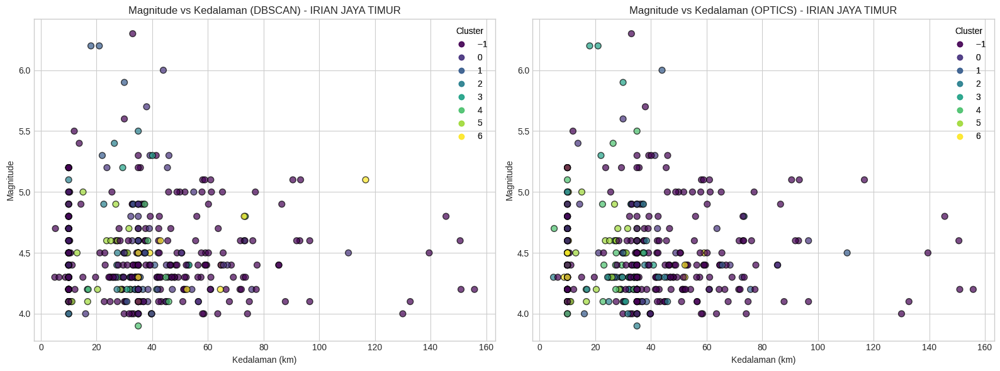


=== Analisis Karakteristik Cluster untuk Provinsi MALUKU UTARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                
                    mean  min  max count        mean    min      max
dbscan_cluster                                                      
-1              4.531148  4.1  6.0    61   64.621377  8.318  238.559
 0              4.389831  4.0  5.1    59  168.118424  8.479  241.989
 1              4.670000  4.1  5.4    10    9.105100  4.720   12.424


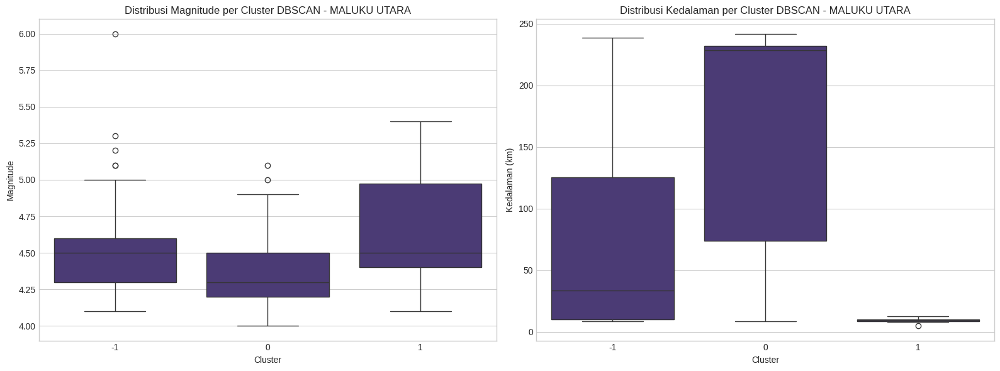


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              4.413208  4.0  5.1    53  138.924094   8.479  241.989
 0              4.478571  4.1  5.0    14   20.477357   9.637   39.450
 1              4.716667  4.2  6.0     6  126.358667   9.205  186.828
 2              4.655556  4.1  5.4    18   38.182167   4.720  206.660
 3              4.466667  4.2  4.9     6   94.802000  10.000  233.222
 4              4.395000  4.1  5.1    20  195.960200  38.666  241.803
 5              4.515385  4.2  5.1    13   28.371923   8.318  102.854


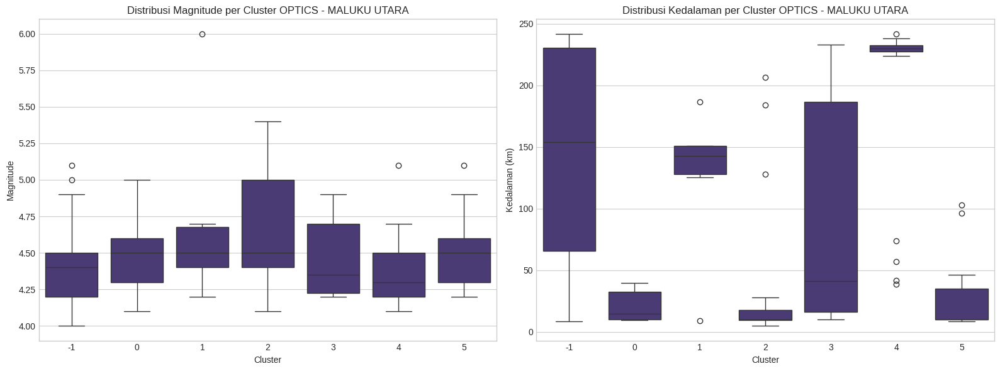


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3144


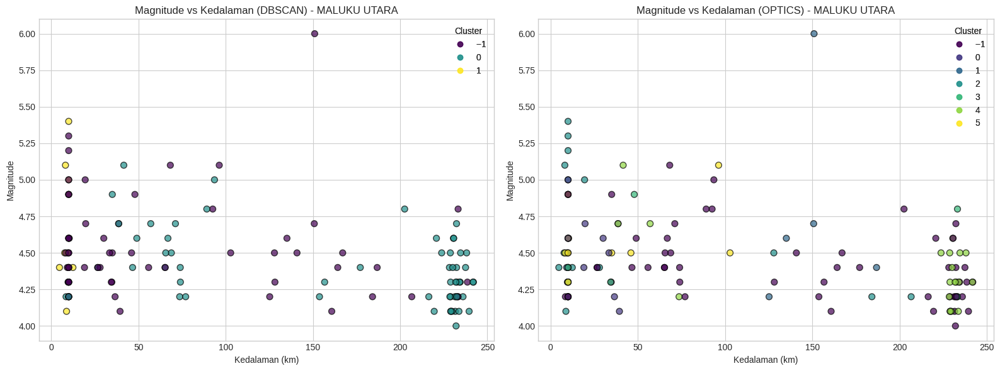


=== Analisis Karakteristik Cluster untuk Provinsi MALUKU ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean    min      max
dbscan_cluster                                                     
-1              4.434146  4.0  4.9    41  58.122390   7.44  189.836
 0              4.487179  4.0  5.7    78  11.399821   9.32   37.190
 1              4.440000  4.1  4.8     5  19.485000  10.00   55.320


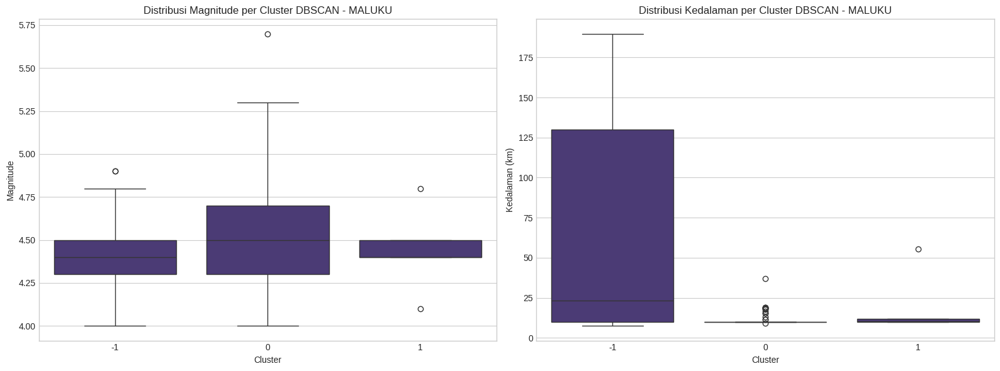


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              4.474419  4.0  5.7    43   19.035349   9.320  144.520
 0              4.442857  4.1  4.8    14   13.279857   7.440   55.320
 1              4.400000  4.1  4.7     6   22.678333  10.000   44.400
 2              4.645455  4.3  5.0    11   10.598818  10.000   15.272
 3              4.516667  4.2  4.8     6   10.000000  10.000   10.000
 4              4.428571  4.2  4.9     7   10.000000  10.000   10.000
 5              4.437500  4.2  5.0     8   14.494375  10.000   37.190
 6              4.400000  4.0  5.0    15   11.663733  10.000   18.757
 7              4.500000  4.4  4.7     7  115.986143  10.000  169.390
 8              4.400000  4.1  4.8     7  125.674286  10.554  189.836


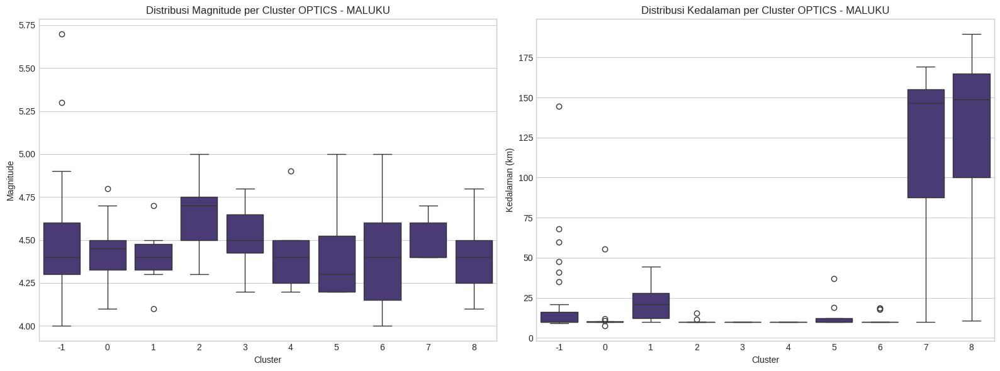


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.0095


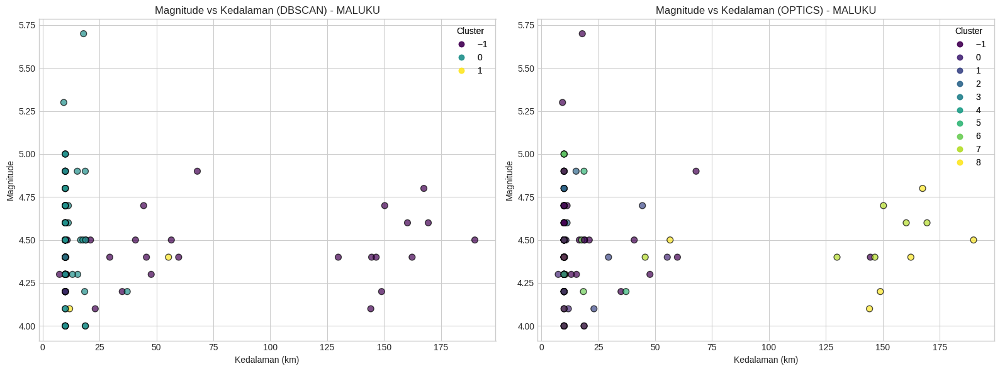


=== Analisis Karakteristik Cluster untuk Provinsi NUSA TENGGARA TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.395833  3.4  5.4    72   79.668833   10.00  210.878
 0              4.585714  4.0  5.1     7   28.493286   10.00   69.043
 1              4.360000  4.0  5.1     5   72.668000   35.00   90.668
 2              4.214286  4.0  4.3     7  176.731714  169.23  194.234
 3              4.320000  4.1  4.6     5  132.691600  117.99  147.358


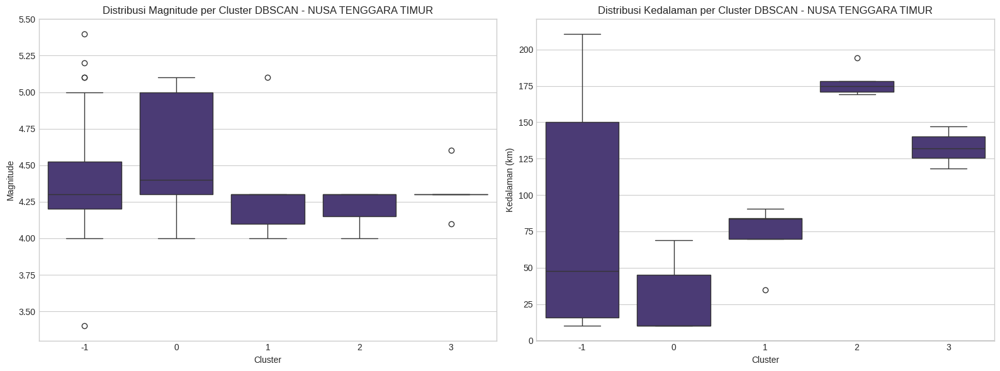


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.340000  3.4  5.1    30  113.528267   10.000  210.878
 0              4.592857  4.2  5.4    14   26.867429   10.000   85.710
 1              4.316667  4.0  4.8    12   24.211167   10.000   47.906
 2              4.200000  4.0  4.4    11  170.818727  148.270  194.234
 3              4.425000  4.3  4.5     4  165.822000  143.074  190.334
 4              4.320000  4.1  4.6     5  132.691600  117.990  147.358
 5              4.360000  4.0  5.1     5   72.668000   35.000   90.668
 6              4.385714  4.1  5.0     7   49.779714   10.000   90.710
 7              4.650000  4.0  5.1     8   26.181625   10.000   69.043


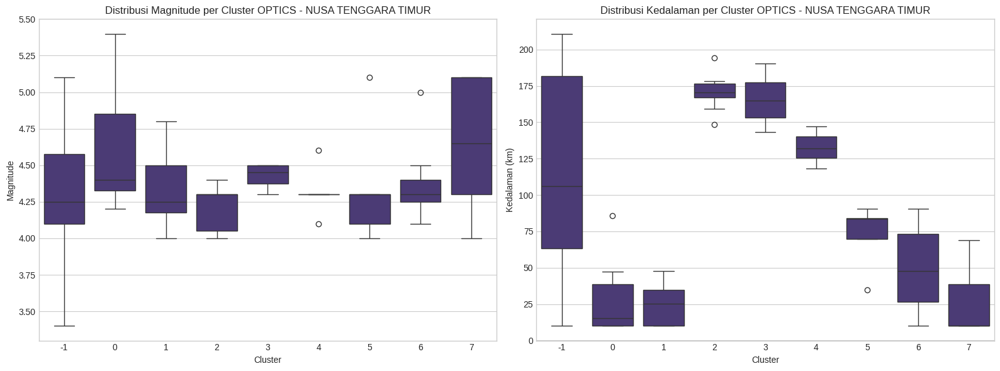


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1374


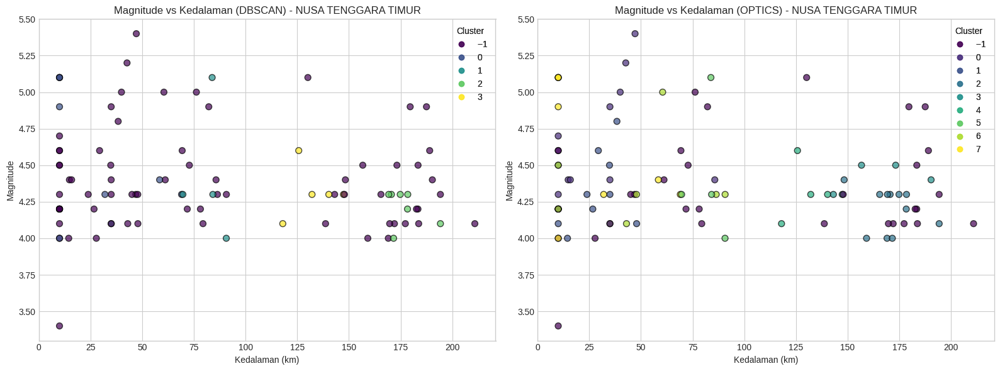


=== Analisis Karakteristik Cluster untuk Provinsi SUMATERA UTARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
dbscan_cluster                                                        
-1              4.425862  3.8  5.9    58  112.247069    8.998  208.665
 0              4.520000  4.0  5.4    20   77.905650    3.604  140.880
 1              4.400000  4.2  5.0     5  165.672400  148.950  174.431
 2              4.477778  4.0  5.2     9  172.169778  157.081  182.797


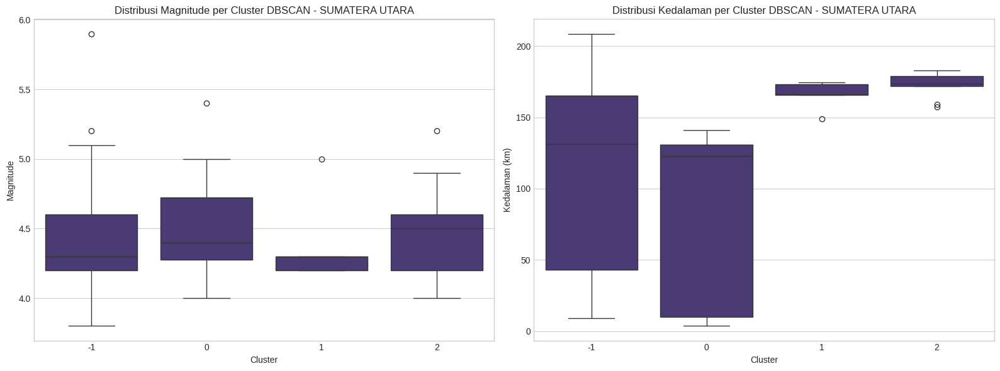


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.472340  3.8  5.9    47  102.722447    3.604  208.665
 0              4.433333  4.0  5.0     6   51.485833    6.717  137.197
 1              4.400000  4.0  5.2    15  172.094667  157.081  182.797
 2              4.528571  4.1  5.1     7   95.016286   10.000  120.320
 3              4.387500  4.2  5.0     8  167.122375  148.950  178.298
 4              4.450000  4.2  4.7     4  144.826250  133.920  159.160
 5              4.400000  4.1  4.8     5   29.329000   19.980   40.995


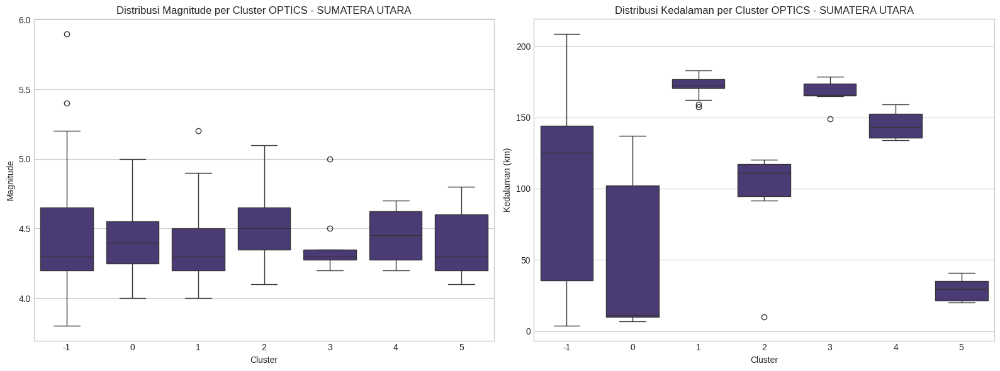


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3551


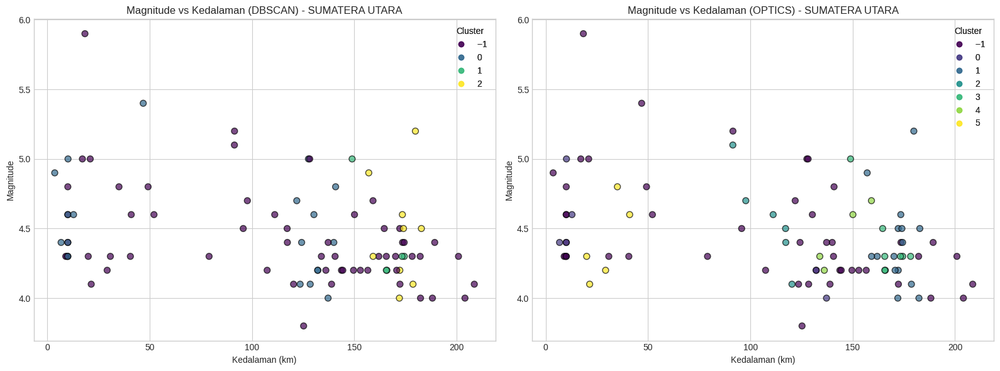


=== Analisis Karakteristik Cluster untuk Provinsi IRIAN JAYA TENGAH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
dbscan_cluster                                                      
-1              4.392208  4.0  5.2    77  32.792961   7.492  147.292
 0              4.633333  4.0  5.9     6  49.760500  31.000   62.038
 1              4.371429  4.1  4.9     7  30.882857  10.000   40.790


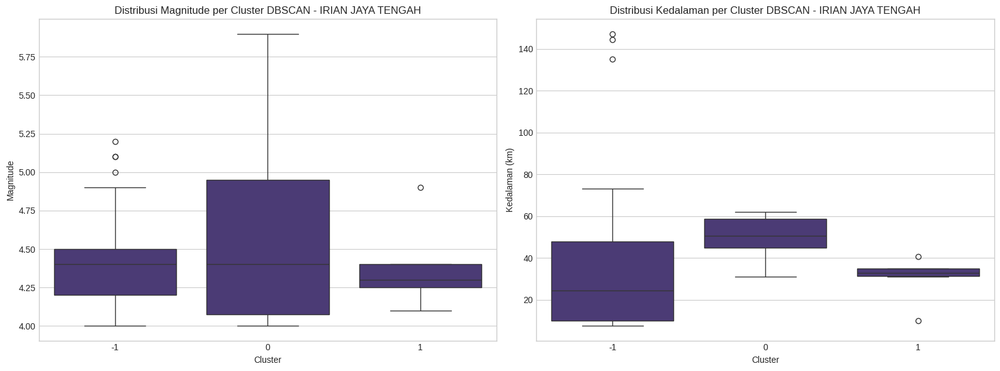


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
-1              4.380000  4.0  5.1    50  33.301160   9.948  147.292
 0              4.313333  4.1  4.9    15  30.551333  10.000   56.270
 1              4.607143  4.0  5.9    14  47.686500  10.000   68.897
 2              4.280000  4.0  4.5     5   9.538800   7.492   10.202
 3              4.500000  4.0  5.0     6  33.528000  10.000   46.340


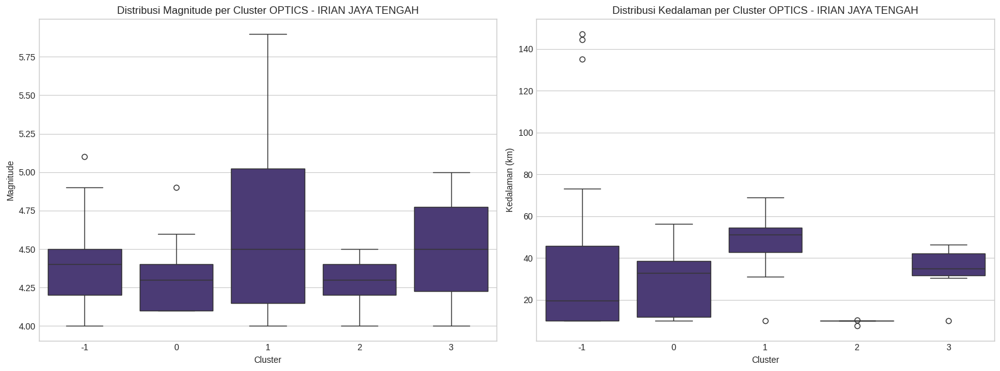


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1191


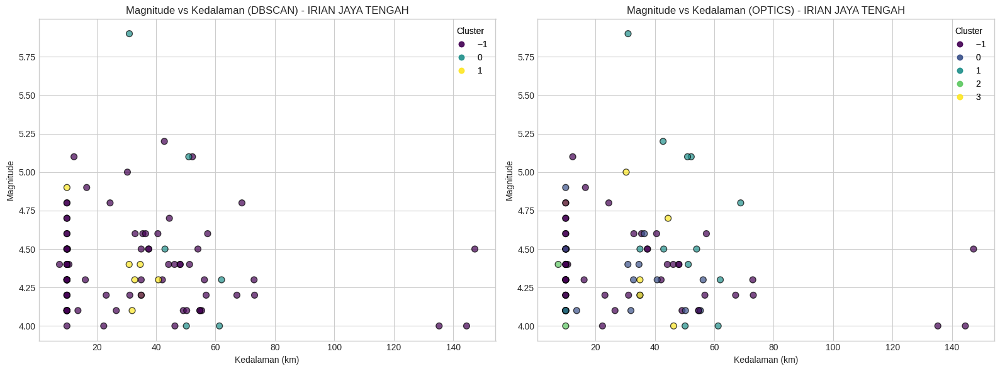


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI TENGAH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean    min      max
dbscan_cluster                                                     
-1              4.449153  4.0  5.4    59  57.174610   3.44  576.502
 0              4.725000  4.1  5.9     8  22.282875  10.00   70.410
 1              4.916667  4.7  5.3     6  20.940000  10.00   49.159


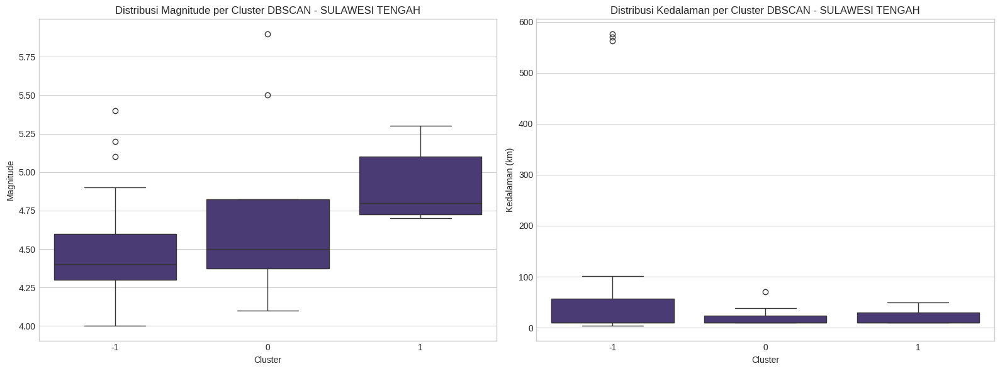


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              4.471429  4.0  5.2    21   47.044762  10.000  576.502
 0              4.457143  4.0  5.4    14   86.511643   3.440  562.607
 1              4.450000  4.0  4.9     6  142.591333  38.990  569.340
 2              4.718182  4.1  5.3    11   18.778545  10.000   49.159
 3              4.568750  4.1  5.9    16   21.866938   9.220   70.410
 4              4.360000  4.1  4.7     5   13.223800   9.779   18.540


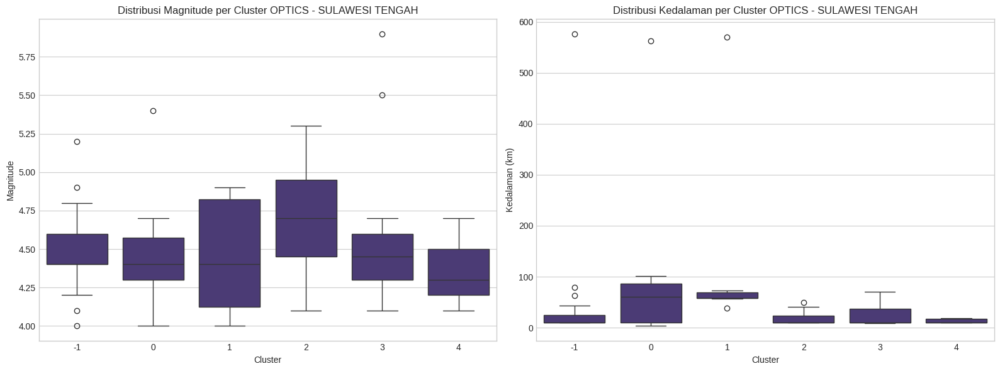


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.0823


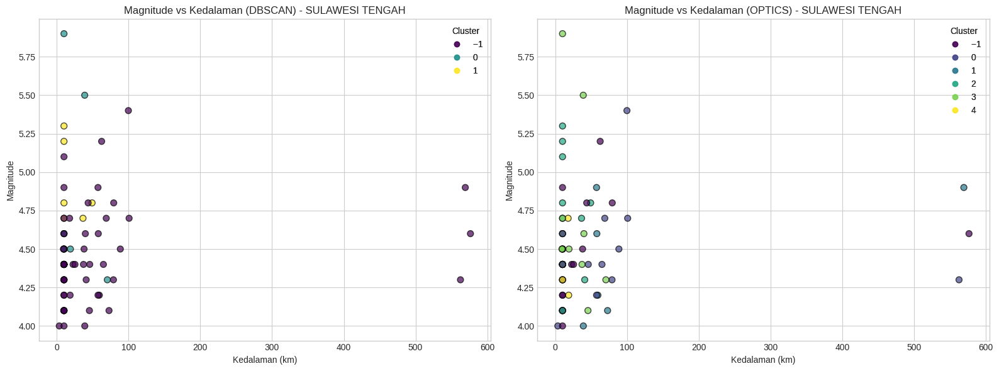


=== Analisis Karakteristik Cluster untuk Provinsi IRIAN JAYA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.403922  4.0  5.1    51  23.163412   9.445  59.750
 0              4.733333  4.6  5.0     3  22.270000  10.000  30.830
 1              4.433333  4.1  4.9     3  39.499333  29.370  46.990
 2              4.775000  4.5  5.1     4  44.899250  35.740  61.167
 3              4.500000  4.3  4.9     4  10.000000  10.000  10.000
 4              4.625000  4.4  5.2     4  32.366500  28.140  35.276
 5              4.333333  4.2  4.5     3  11.550667  10.000  14.534


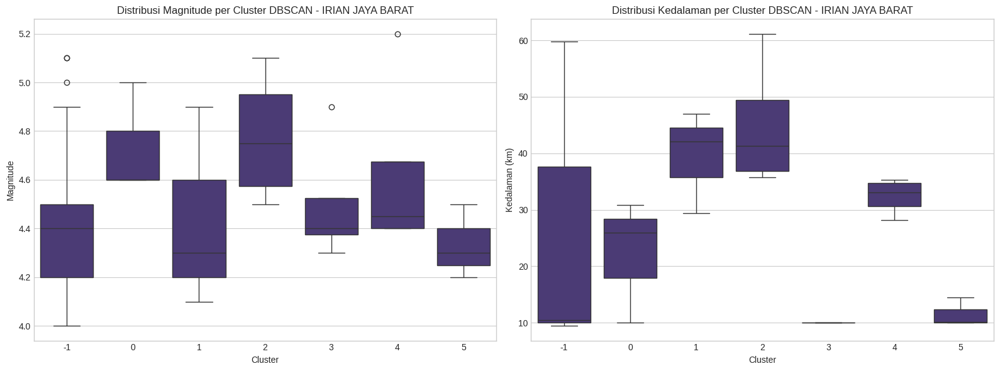


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
optics_cluster                                                     
-1              4.371429  4.0  4.8    14  14.952857  10.000  39.190
 0              4.469231  4.0  5.1    13  36.853923  10.000  59.750
 1              4.657143  4.5  5.1     7  44.216857  33.367  61.167
 2              4.544444  4.2  5.2     9  32.819111  10.000  48.886
 3              4.357143  4.0  4.9    14  21.187429   9.445  46.990
 4              4.460000  4.1  5.0    10  11.040200  10.000  16.340
 5              4.460000  4.3  4.9     5  10.000000  10.000  10.000


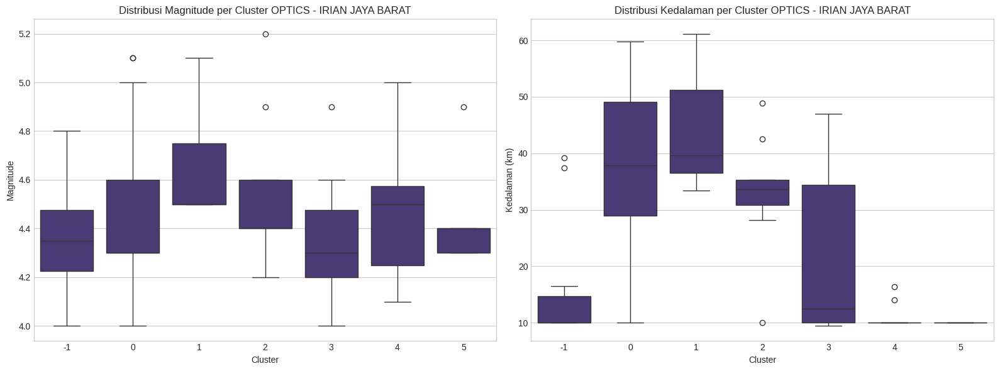


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.1066


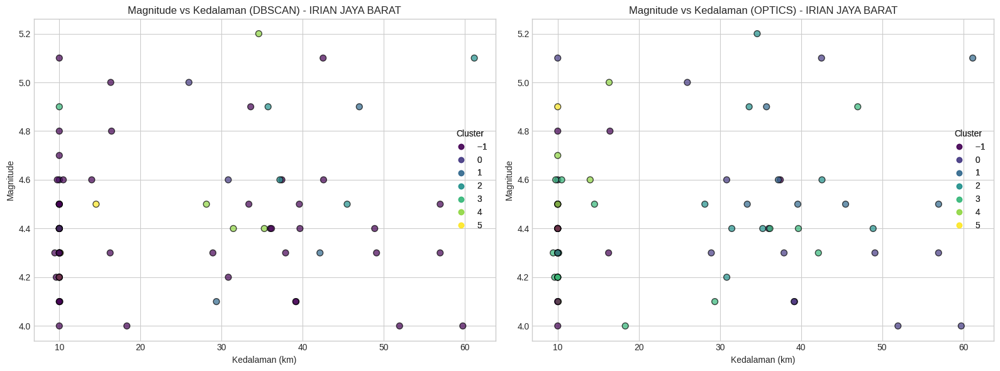


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI UTARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                
                    mean  min  max count        mean     min     max
dbscan_cluster                                                      
-1              4.333333  4.0  5.2    21  150.512429   10.00  218.77
 0              4.334615  4.0  5.3    26  241.541731  196.83  270.64
 1              4.413043  4.1  5.1    23   42.017957   10.00   60.66


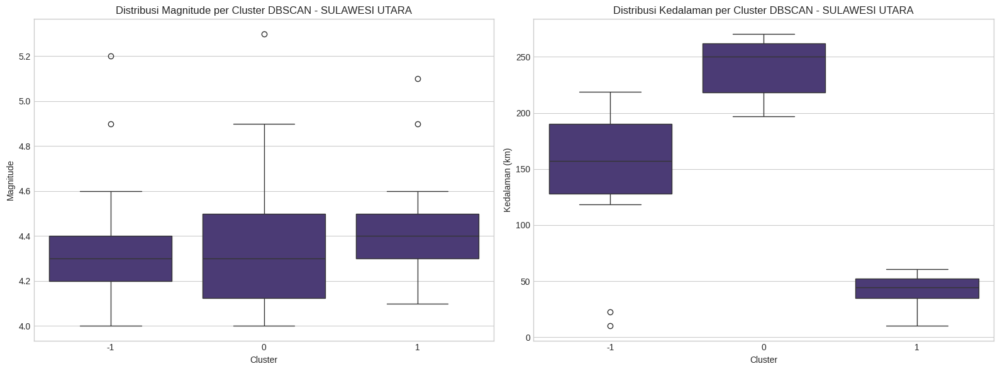


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.304000  4.0  5.1    25  141.850560   10.000  261.865
 0              4.285714  4.0  4.7     7  258.043286  227.081  270.640
 1              4.366667  4.0  4.9     6  252.868833  246.420  262.832
 2              4.425000  4.1  5.3     4  239.541250  196.830  264.076
 3              4.285714  4.1  4.6     7  198.880857  170.200  208.310
 4              4.800000  4.5  5.2     4  115.288750   22.470  179.240
 5              4.355556  4.2  4.6     9   43.216222   10.000   59.850
 6              4.412500  4.1  4.9     8   42.130875   35.000   58.097


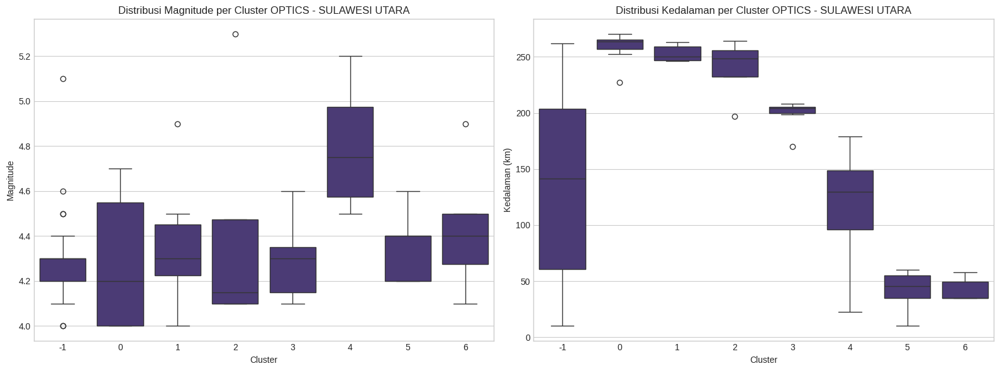


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1917


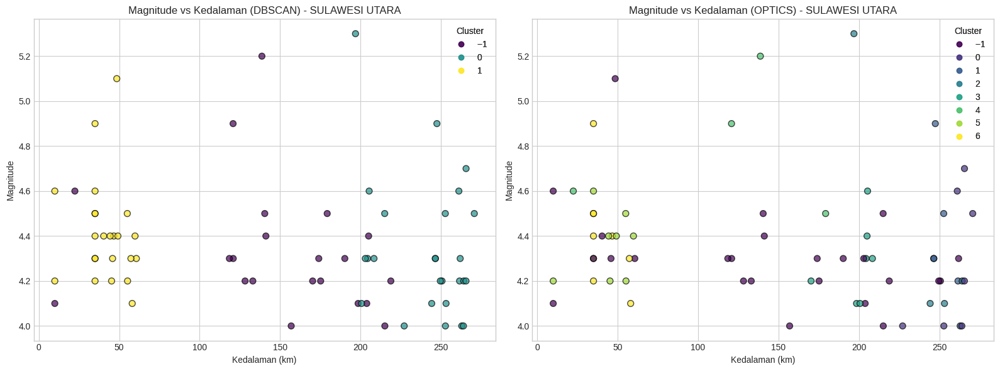


=== Analisis Karakteristik Cluster untuk Provinsi NUSATENGGARA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
dbscan_cluster                                                        
-1              4.445161  4.0  5.1    31   58.430129    9.045  157.600
 0              4.290625  4.1  4.8    32  134.481531  113.260  143.567
 1              4.566667  4.2  5.0     6   41.013500    6.911  199.170


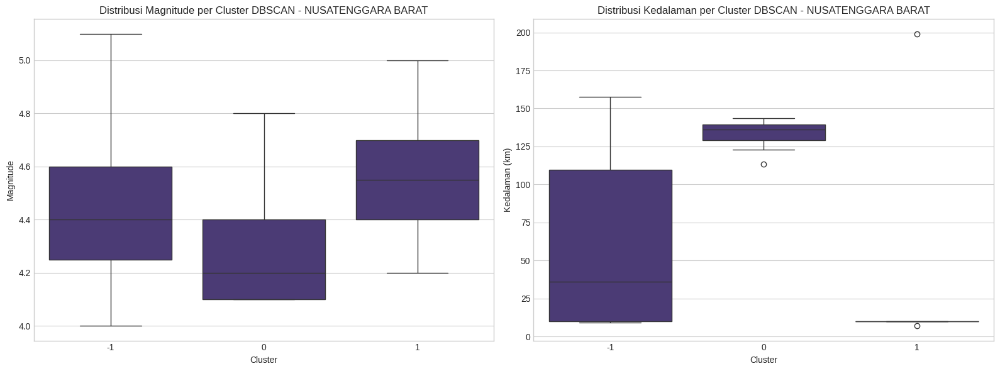


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.410000  4.1  5.1    30  105.077700   10.000  156.814
 0              4.480000  4.0  4.9     5   12.036200   10.000   18.414
 1              4.571429  4.2  5.0     7   36.583000    6.911  199.170
 2              4.300000  4.1  4.5     6  138.014333  136.191  143.220
 3              4.225000  4.1  4.5    12  136.569750  122.940  143.567
 4              4.366667  4.0  5.0     9   47.256444    9.045  157.600


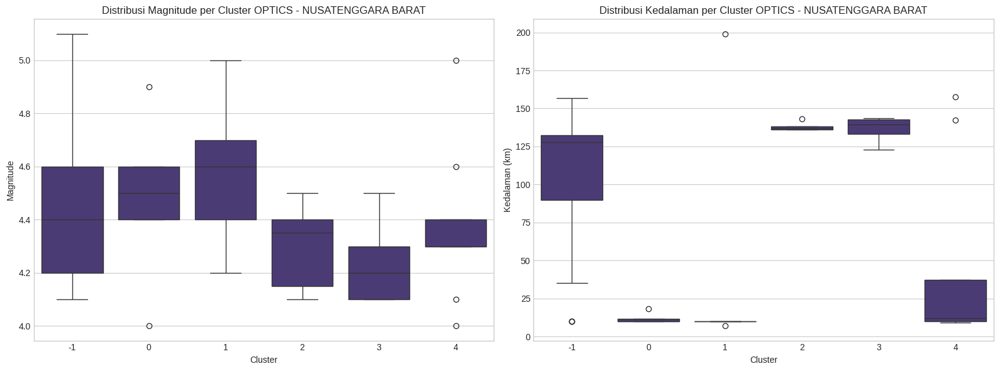


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3181


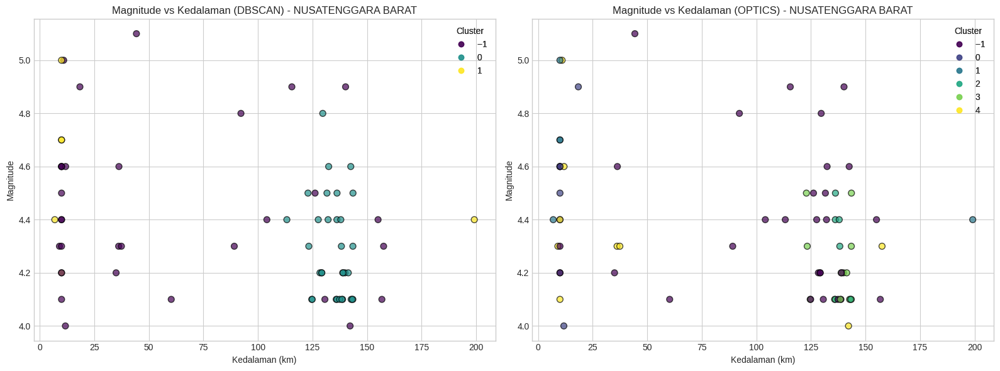


=== Analisis Karakteristik Cluster untuk Provinsi DI. ACEH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
dbscan_cluster                                                      
-1              4.573684  4.1  6.3    19  66.052737  10.000  193.780
 0              4.463415  4.0  5.0    41  37.663707   5.550  171.438
 1              4.433333  4.2  4.8     6  27.701167  25.543   29.480


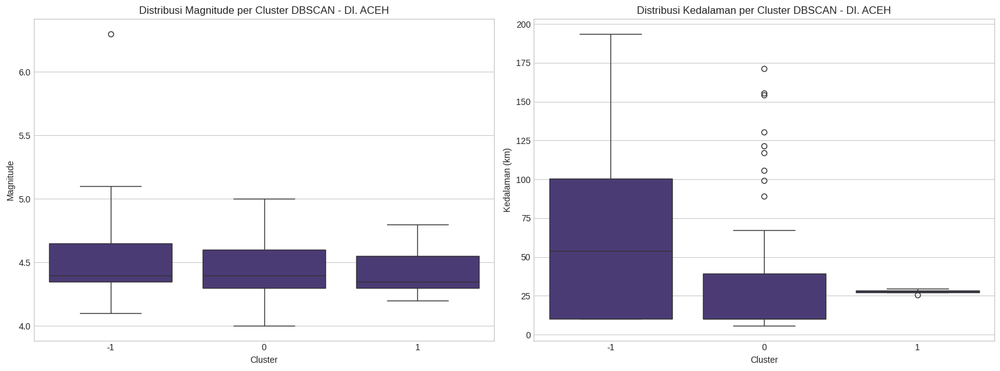


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
-1              4.507143  4.1  5.1    14  66.143929   9.387  171.438
 0              4.430000  4.1  5.0    10  87.432100  10.000  193.780
 1              4.479167  4.0  5.0    24  29.120500   5.550  154.360
 2              4.427273  4.2  4.7    11  25.726000   8.434  105.522
 3              4.700000  4.2  6.3     7  26.172429  17.000   29.480


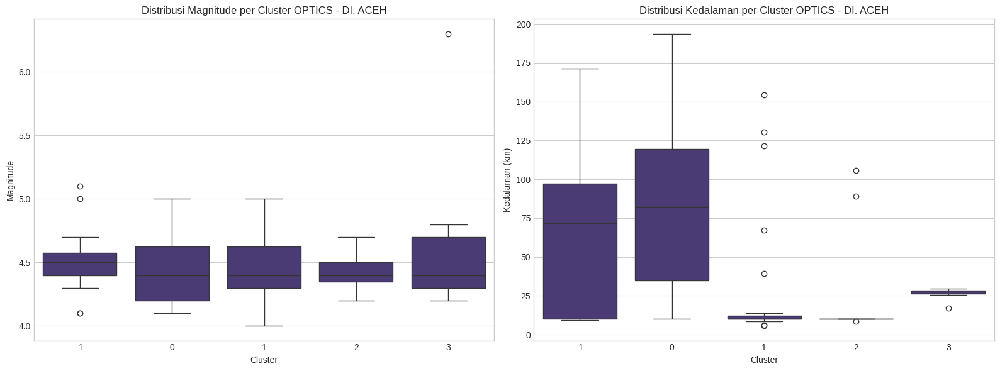


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1104


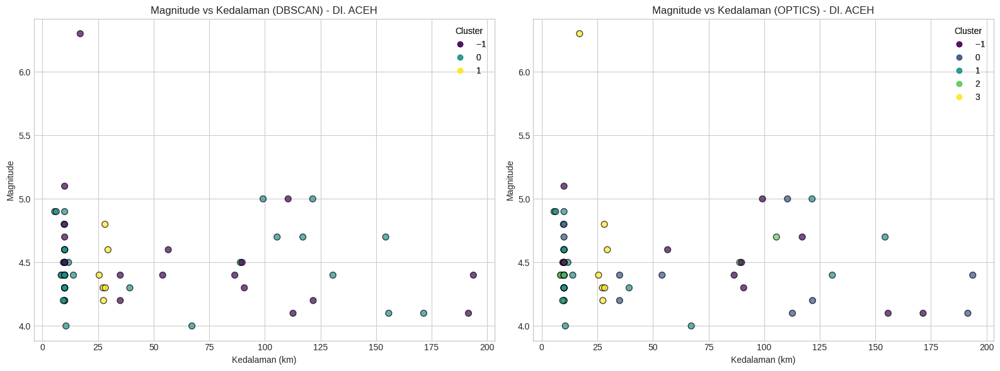


=== Analisis Karakteristik Cluster untuk Provinsi JAWA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.426087  3.8  5.8    46  77.466174  10.000  310.50
 0              4.800000  4.3  5.6     5  31.375600   6.878  120.00
 1              4.620000  4.5  5.0     5  59.453800  51.169   68.84


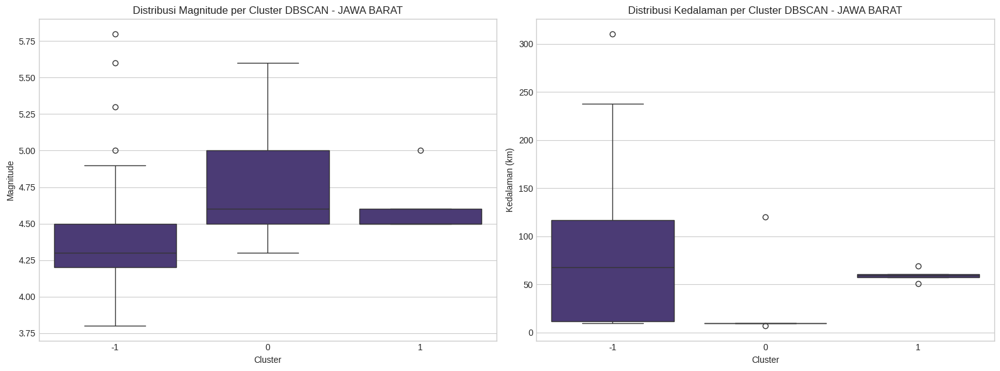


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
-1              4.293750  3.8  4.9    16  86.025562  10.000  310.500
 0              4.622222  4.0  5.8    18  75.788722  10.000  178.051
 1              4.514286  4.1  5.0     7  66.194143  46.220  119.870
 2              4.515385  4.0  5.6    13  50.290923   6.878  133.840
 3              4.250000  4.2  4.3     2  79.922000  11.692  148.152


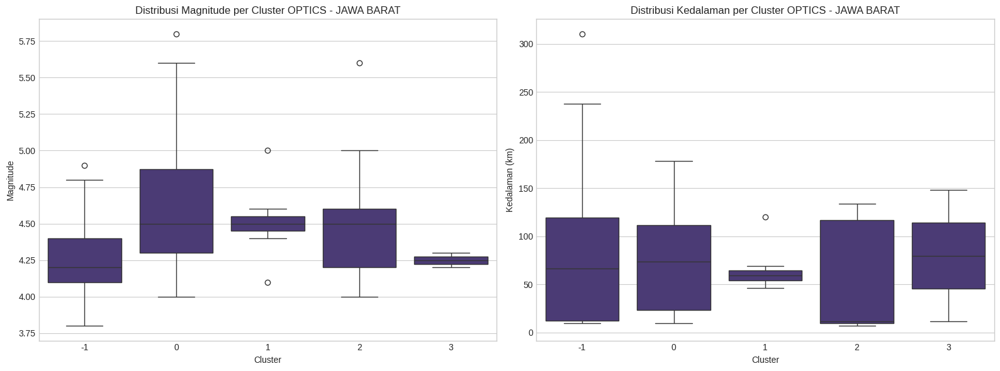


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0618


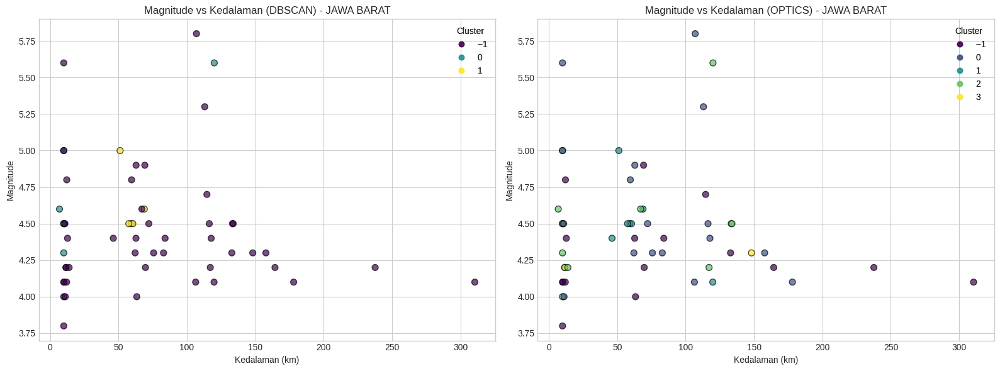


=== Analisis Karakteristik Cluster untuk Provinsi SUMATERA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
dbscan_cluster                                                      
-1              4.497143  4.0  5.6    35  64.881286   9.797  198.646
 0              4.700000  4.2  6.1    12  15.393333   4.000   64.030
 1              5.133333  4.3  6.0     6  22.273667  10.000   43.000
 2              4.433333  4.0  4.8     3  15.221333  10.000   19.034


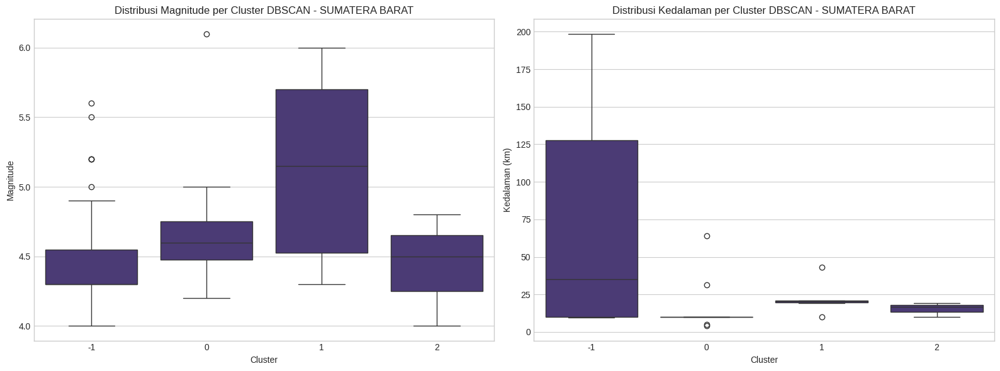


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.523077  4.0  5.2    13   67.631154   10.000  140.516
 0              4.275000  4.2  4.3     4   25.364250    9.797   47.550
 1              4.577778  4.0  6.1    18   35.588278    4.000  140.510
 2              4.250000  4.1  4.4     4  173.980750  156.550  198.646
 3              4.837500  4.0  5.6     8   19.256875   10.000   35.243
 4              4.877778  4.3  6.0     9   18.182444   10.000   43.000


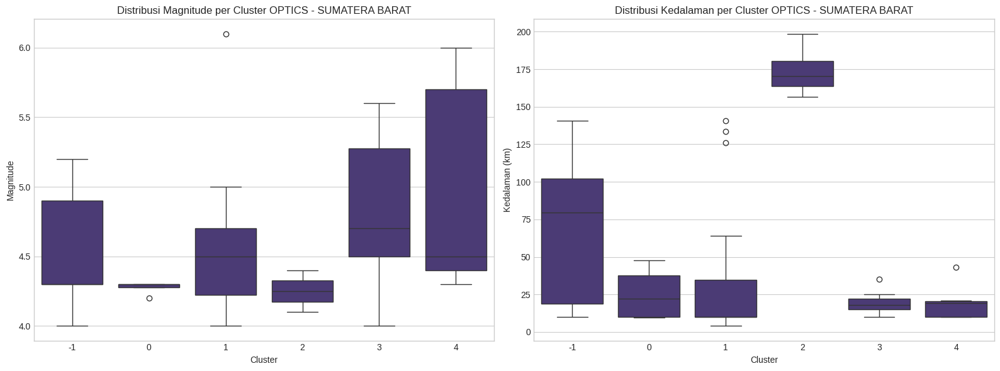


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3089


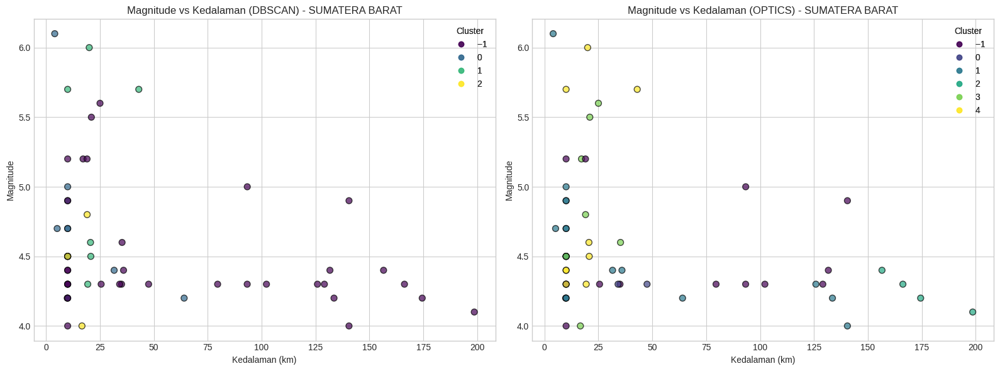


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI SELATAN ===

1. Karakteristik Cluster DBSCAN:
               magnitude                  depth_km              
                    mean  min  max count      mean     min   max
dbscan_cluster                                                  
-1              4.482609  4.1  5.2    23  12.00487   9.712  35.0
 0              4.975000  4.2  6.2     8  12.00000  10.000  18.0
 1              4.340000  4.2  4.4     5  10.00000  10.000  10.0


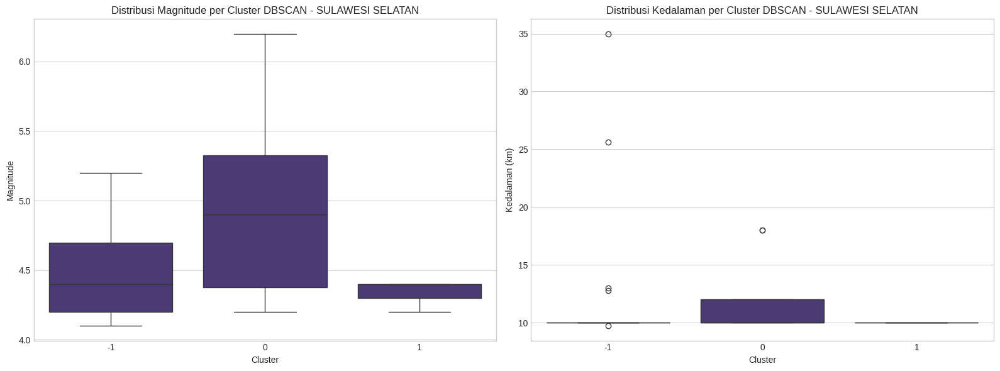


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km               
                    mean  min  max count       mean     min    max
optics_cluster                                                    
-1              4.600000  4.2  5.2     7  10.395714  10.000  12.77
 0              4.366667  4.3  4.4     3  10.000000  10.000  10.00
 1              4.675000  4.2  5.2     4  10.000000  10.000  10.00
 2              5.400000  4.3  6.2     3  15.333333  10.000  18.00
 3              4.520000  4.1  4.9     5  18.726000  10.000  35.00
 4              4.437500  4.2  5.0     8  10.000000  10.000  10.00
 5              4.383333  4.2  4.7     6   9.952000   9.712  10.00


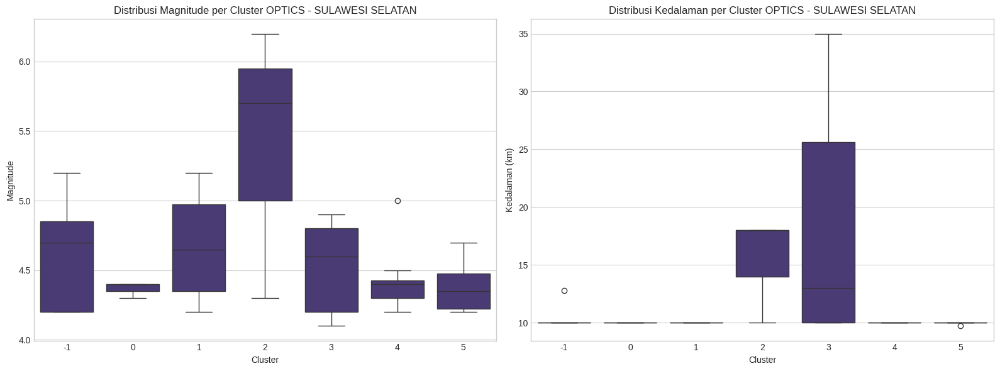


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.3318


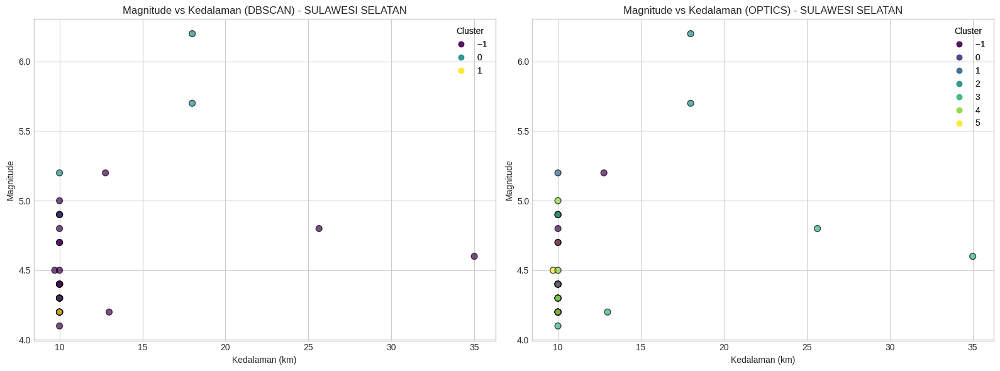


=== Analisis Karakteristik Cluster untuk Provinsi BENGKULU ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.358333  4.0  5.1    12  86.086417  10.000  194.71
 0              4.390909  4.0  4.8    11  87.011727  10.862  116.82
 1              4.380000  4.2  4.7     5  93.178400  59.440  137.53


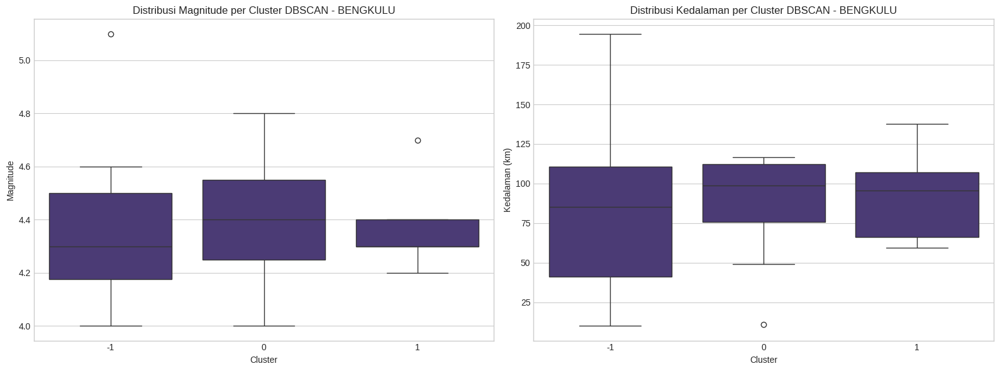


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.350000  4.2  4.5     2  100.045000   82.230  117.860
 0              4.357143  4.0  4.8     7  105.839571   84.089  116.820
 1              4.550000  4.5  4.6     2   39.081000   10.862   67.300
 2              4.350000  4.1  4.6     2   69.045000   49.270   88.820
 3              4.000000  4.0  4.0     2  151.617000  108.524  194.710
 4              4.233333  4.1  4.3     3   51.863333   10.000  106.170
 5              4.433333  4.3  4.6     3   85.183333   10.000  157.170
 6              4.800000  4.5  5.1     2   59.286500   41.700   76.873
 7              4.300000  4.2  4.4     2   80.946000   66.180   95.712
 8              4.433333  4.3  4.7     3  101.333333   59.440  137.530


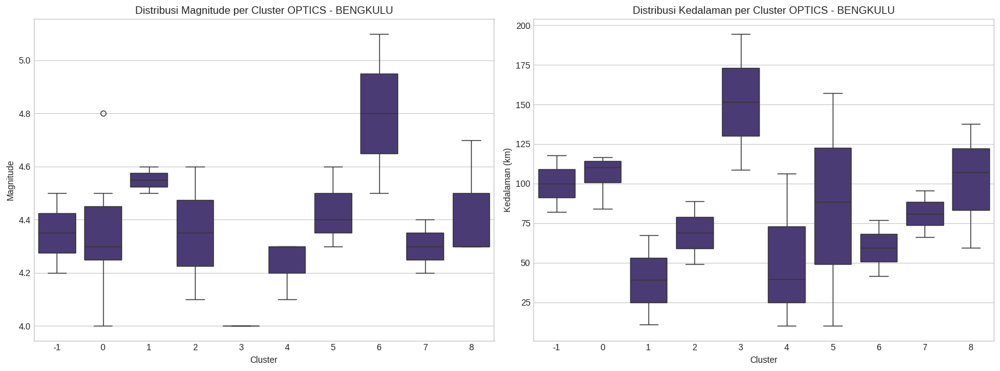


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.2253


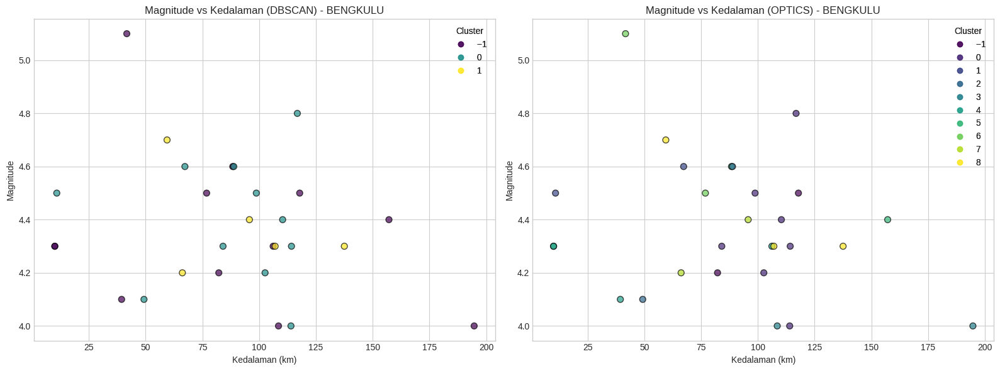


=== Analisis Karakteristik Cluster untuk Provinsi GORONTALO ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                
                    mean  min  max count        mean    min      max
dbscan_cluster                                                      
-1              4.366667  4.0  4.9     6  149.281500  49.61  287.380
 0              4.400000  3.9  4.9     8   87.925875  75.64   99.130
 1              4.391667  4.0  4.9    12   98.832167  55.46  127.333


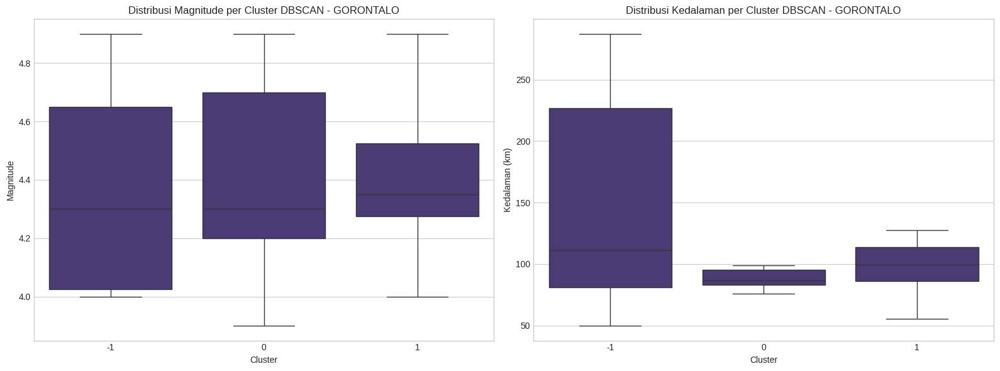


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                  
                    mean  min  max count       mean      min      max
optics_cluster                                                       
-1              4.300000  4.0  4.9     6   78.85200   49.610  100.331
 0              4.400000  4.1  4.7     2  111.07150   91.020  131.123
 1              4.550000  4.3  4.9     4  110.91175   95.410  127.333
 2              4.433333  4.3  4.6     3  113.71000  111.821  116.619
 3              4.250000  4.2  4.3     2   66.36000   55.460   77.260
 4              4.433333  4.3  4.7     3   97.29500   93.775   99.130
 5              4.425000  3.9  4.9     4   83.55050   75.640   87.663
 6              4.250000  4.0  4.5     2  273.12150  258.863  287.380


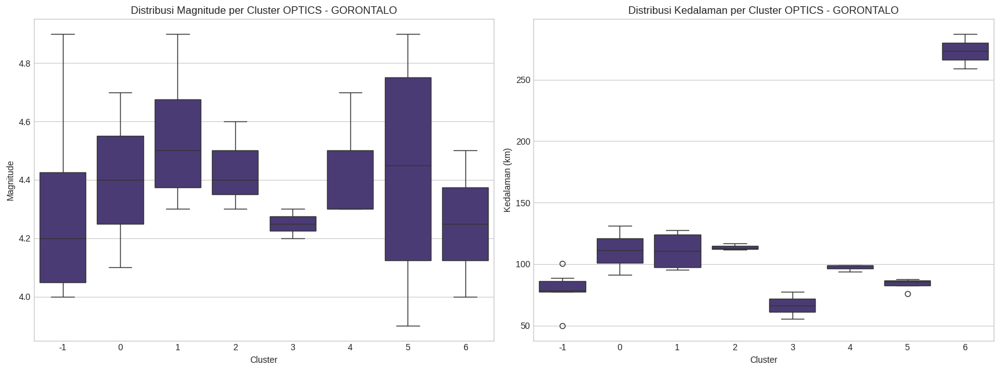


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0938


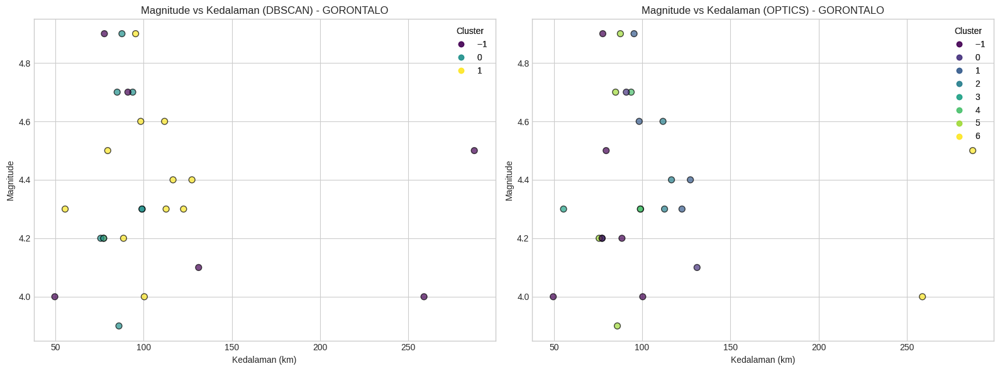


=== Analisis Karakteristik Cluster untuk Provinsi SUMATERA SELATAN ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
dbscan_cluster                                                        
-1              4.370588  4.1  5.1    17  154.831176   10.000  306.970
 0              4.350000  4.1  4.6     2  212.242500  198.437  226.048
 1              4.200000  4.2  4.2     2  196.400000  187.872  204.928
 2              4.400000  4.2  4.6     2  149.998500  148.690  151.307
 3              4.250000  4.1  4.4     2  181.684500  172.991  190.378


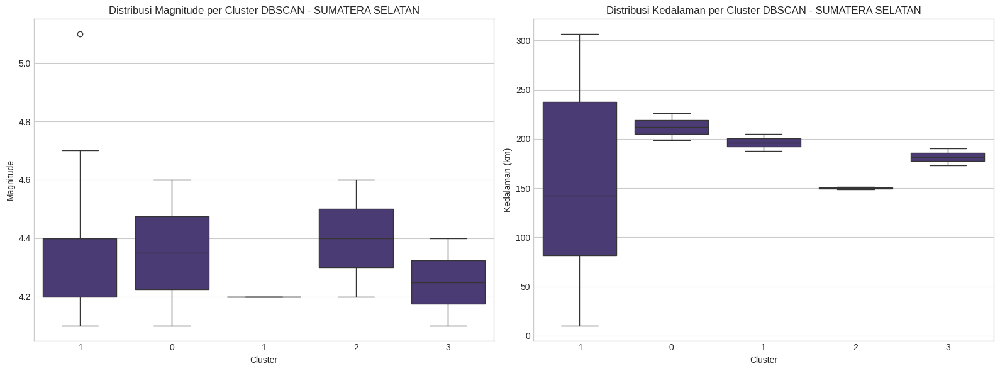


2. Karakteristik Cluster OPTICS:
               magnitude                  depth_km                  
                    mean  min  max count      mean      min      max
optics_cluster                                                      
-1                  4.20  4.1  4.3     2  243.8305  219.447  268.214
 0                  4.54  4.2  5.1     5  137.2866   11.291  306.970
 1                  4.40  4.4  4.4     2   45.8565   10.000   81.713
 2                  4.30  4.2  4.4     2  284.3850  277.710  291.060
 3                  4.25  4.1  4.4     2  181.6845  172.991  190.378
 4                  4.20  4.2  4.2     2  196.4000  187.872  204.928
 5                  4.35  4.1  4.6     2  212.2425  198.437  226.048
 6                  4.25  4.2  4.3     2  230.9865  224.239  237.734
 7                  4.25  4.1  4.4     2  157.7900  121.350  194.230
 8                  4.40  4.2  4.6     2  149.9985  148.690  151.307
 9                  4.40  4.4  4.4     2   10.0000   10.000   10.000


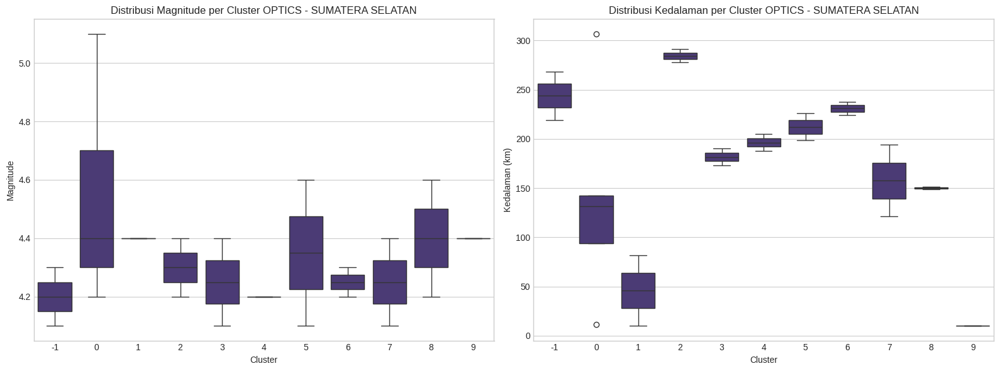


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3927


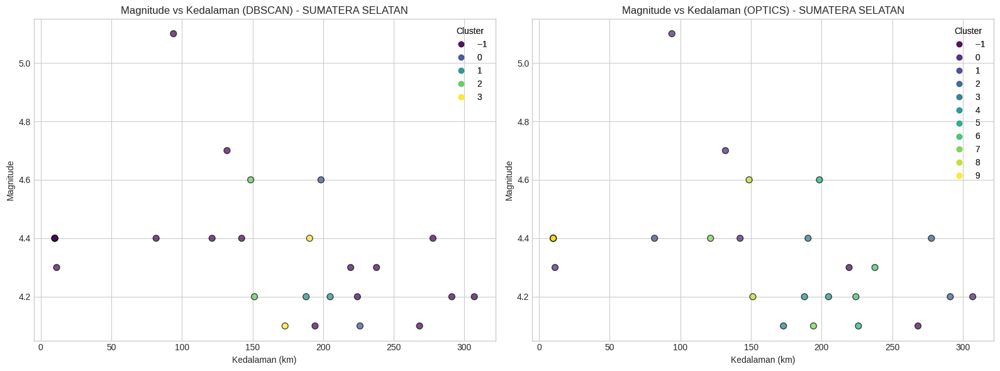


=== Analisis Karakteristik Cluster untuk Provinsi PROBANTEN ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.493750  4.0  4.9    16   99.210813  10.000  196.104
 0              4.766667  4.6  4.9     3   48.354667  40.974   52.320
 1              4.700000  4.4  5.1     3  138.616667  96.850  169.400


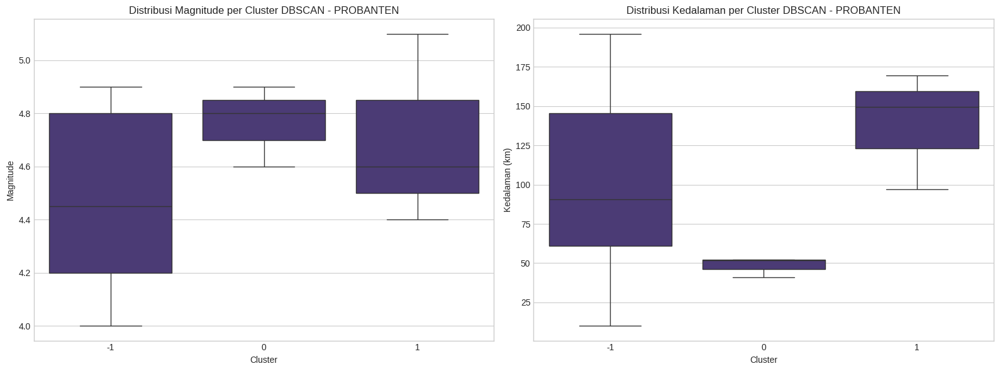


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1                  4.62  4.2  4.9     5  112.693400   10.000  196.104
 0                  4.70  4.4  5.1     3  138.616667   96.850  169.400
 1                  4.30  4.0  4.6     2  105.575000  104.960  106.190
 2                  4.25  4.1  4.4     2  147.715000  143.490  151.940
 3                  4.50  4.2  4.9     3  101.056667   65.970  160.890
 4                  4.25  4.1  4.4     2   65.555000   56.550   74.560
 5                  4.80  4.6  4.9     5   45.622000   33.901   52.320


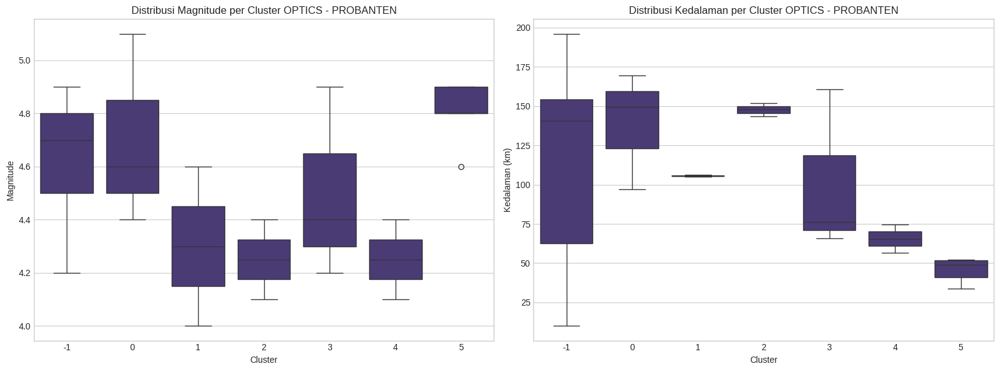


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3294


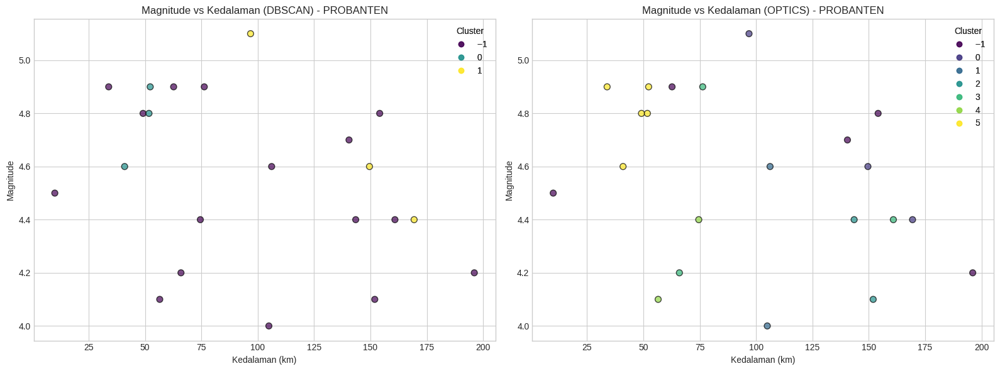


=== Analisis Karakteristik Cluster untuk Provinsi JAWA TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
dbscan_cluster                                                        
-1              4.310000  3.9  5.0    10  145.176200   10.000  243.273
 0              4.342857  4.1  5.1     7  124.887143  113.160  142.060
 1              4.150000  4.1  4.2     2   10.977000   10.000   11.954
 2              4.200000  4.2  4.2     2   89.336500    9.013  169.660


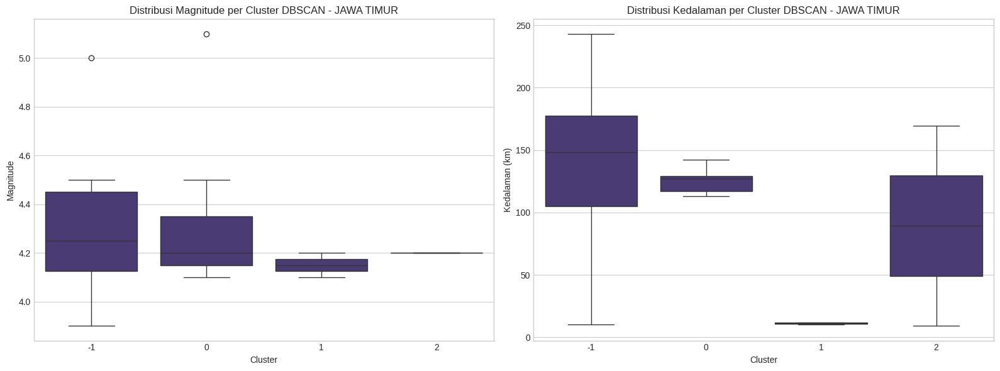


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.300000  4.3  4.3     1  176.903000  176.903  176.903
 0              4.150000  3.9  4.3     6  141.559833    9.013  243.273
 1              4.300000  4.2  4.5     3  129.022667  117.578  142.060
 2              4.375000  4.1  5.1     4  121.785500  113.160  130.381
 3              4.433333  4.1  5.0     3  134.968667  108.580  153.996
 4              4.500000  4.5  4.5     2   99.633500   95.260  104.007
 5              4.150000  4.1  4.2     2   10.977000   10.000   11.954


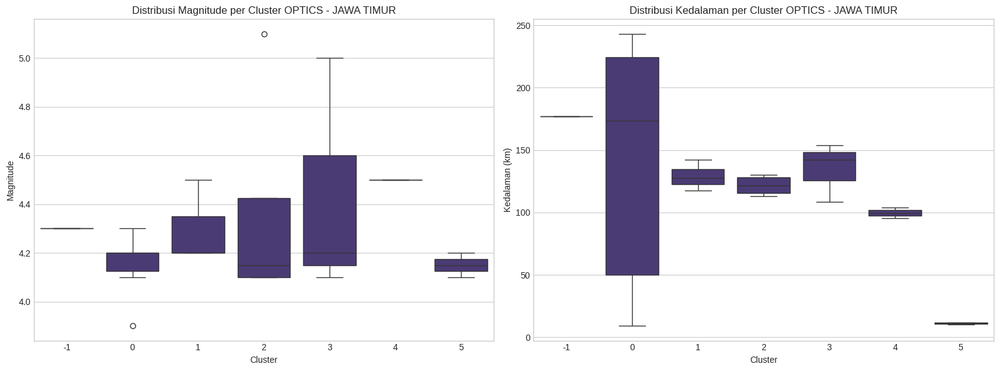


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1741


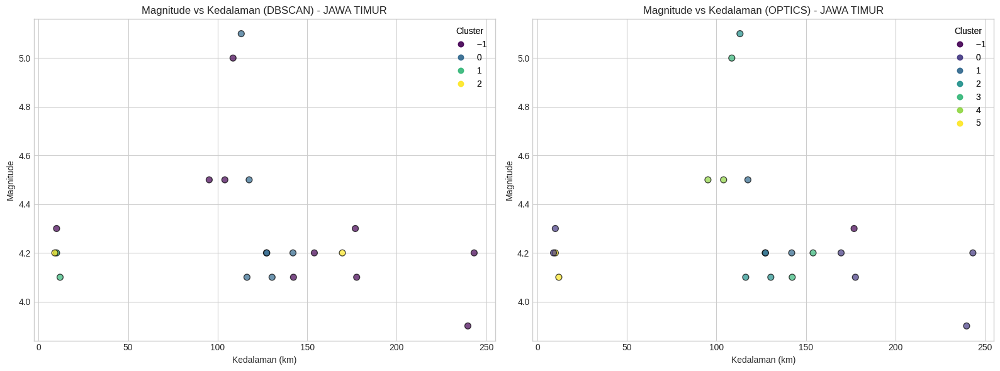


=== Analisis Karakteristik Cluster untuk Provinsi JAMBI ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
dbscan_cluster                                                        
-1              4.170000  4.0  4.5    10  189.176400  148.650  227.910
 0              4.300000  4.1  4.5     2  160.188500  150.707  169.670
 1              4.266667  4.1  4.4     3  169.359333  112.870  205.428
 2              4.350000  4.0  4.7     6  207.304500  193.470  222.716


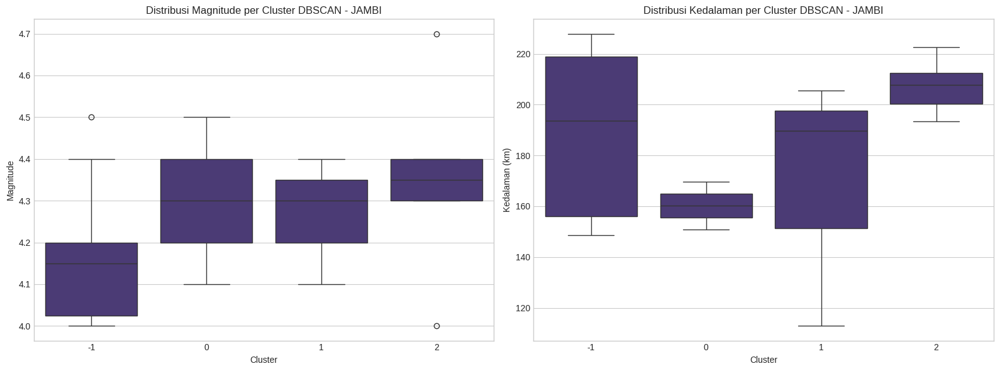


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1                 4.000  4.0  4.0     2  221.283000  214.656  227.910
 0                 4.300  4.1  4.5     2  175.172500  149.115  201.230
 1                 4.250  4.1  4.4     4  168.991250  112.870  205.428
 2                 4.300  4.0  4.7     7  209.630571  193.470  223.587
 3                 4.275  4.1  4.5     4  163.815500  148.650  186.235
 4                 4.200  4.2  4.2     2  186.247000  152.120  220.374


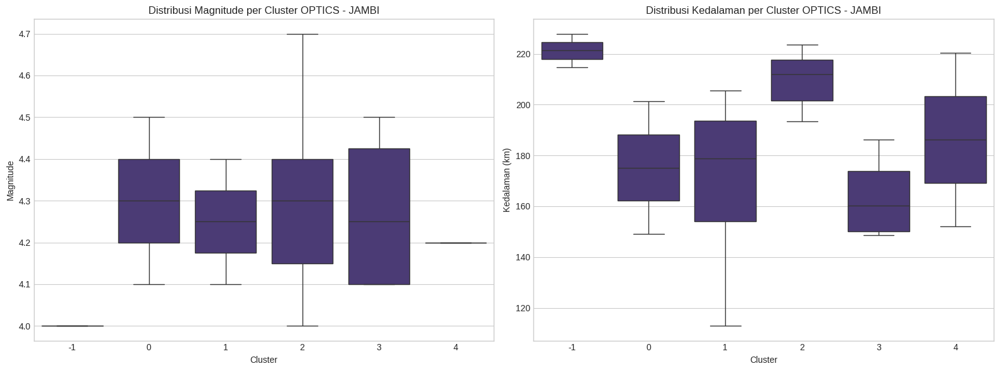


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.3053


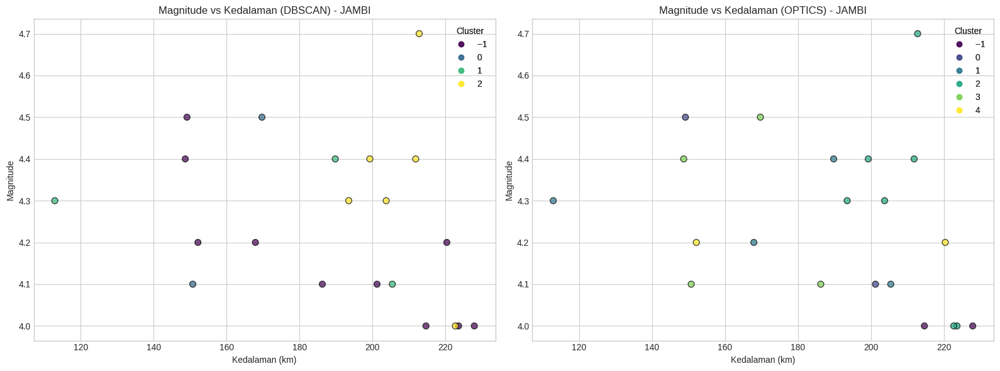


=== Analisis Karakteristik Cluster untuk Provinsi LAMPUNG ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean    min      max
dbscan_cluster                                                     
-1              4.409091  4.2  4.9    11  92.689273  10.00  187.630
 0              4.660000  4.5  5.1     5  50.350200  25.14  109.811
 1              4.500000  4.4  4.6     4  82.205000  57.49  106.550


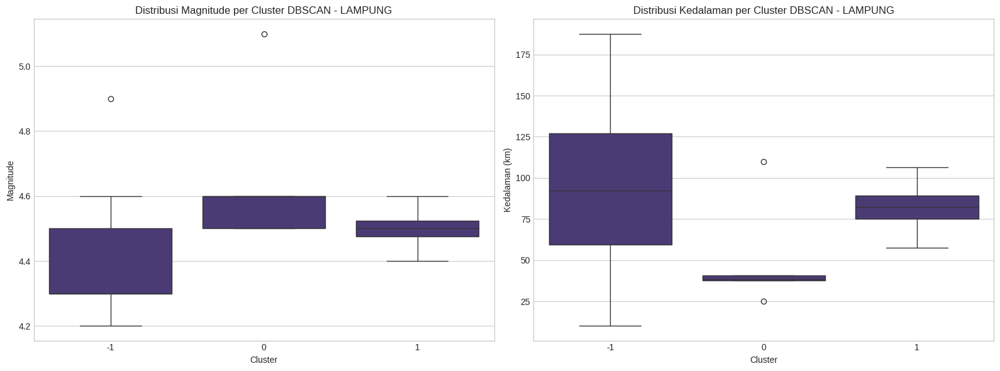


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              4.280000  4.2  4.4     5  103.686200  10.000  187.630
 0              4.466667  4.3  4.6     3   55.680333  10.261   78.480
 1              4.671429  4.5  5.1     7   64.244429  25.140  109.811
 2              4.460000  4.3  4.6     5   92.994000  57.490  136.150


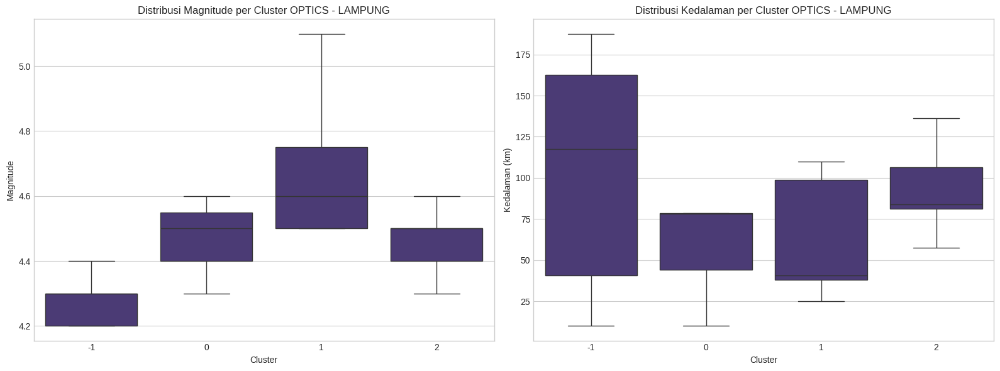


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.2095


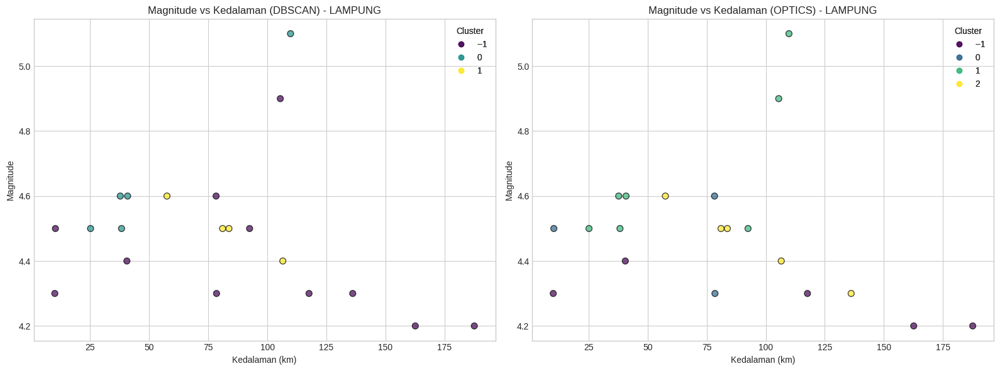


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI TENGGARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km               
                    mean  min  max count       mean     min    max
dbscan_cluster                                                    
-1              4.233333  4.1  4.4     3  15.184667   9.759  25.76
 0              4.571429  4.1  5.0     7   9.644286   6.490  10.94
 1              4.233333  4.0  4.5     3  29.560000  10.000  53.81


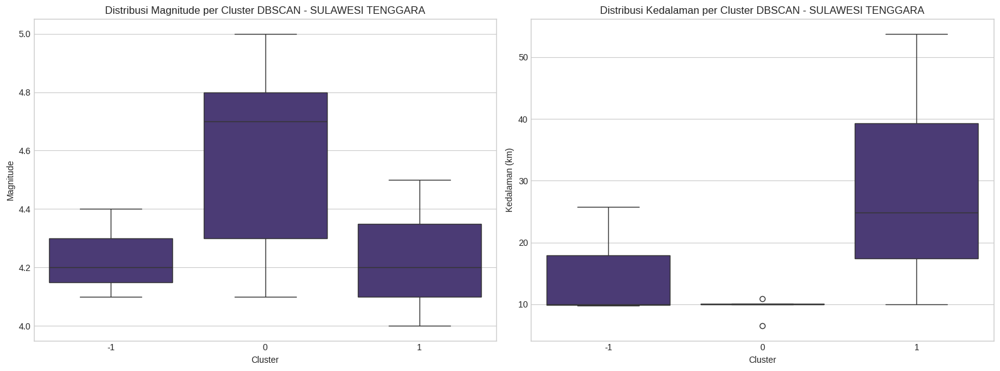


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
optics_cluster                                                     
0               4.571429  4.1  5.0     7   9.644286   6.490  10.940
1               4.300000  4.2  4.4     2   9.897000   9.759  10.035
2               4.200000  4.0  4.5     4  28.610000  10.000  53.810


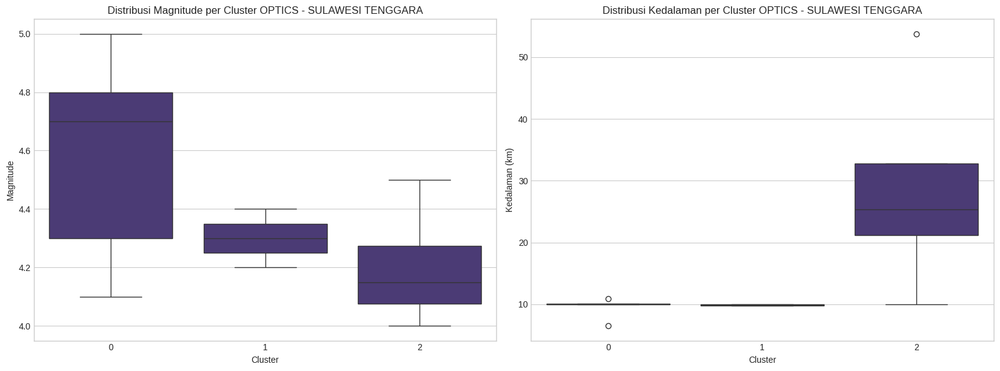


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.2759


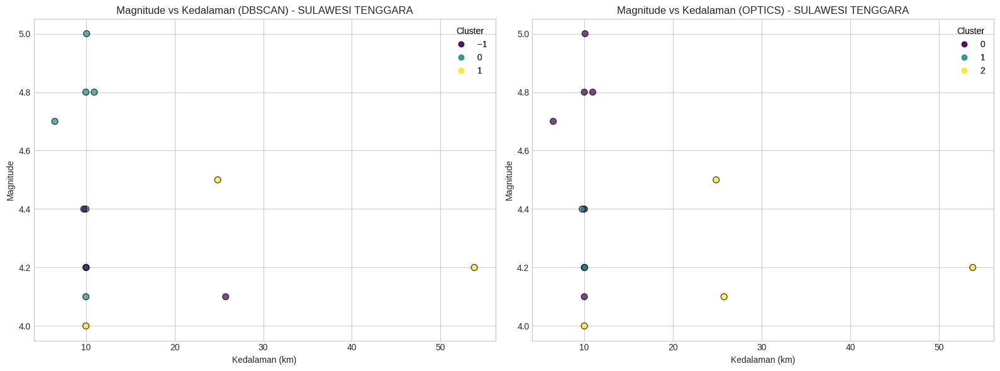


=== Analisis Karakteristik Cluster untuk Provinsi KALIMANTAN TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km               
                    mean  min  max count     mean     min    max
dbscan_cluster                                                  
-1                  4.46  4.3  4.8     5   10.000  10.000  10.00
 0                  4.45  4.3  4.6     2   31.490  10.000  52.98
 1                  4.90  4.3  5.5     2    8.263   6.526  10.00


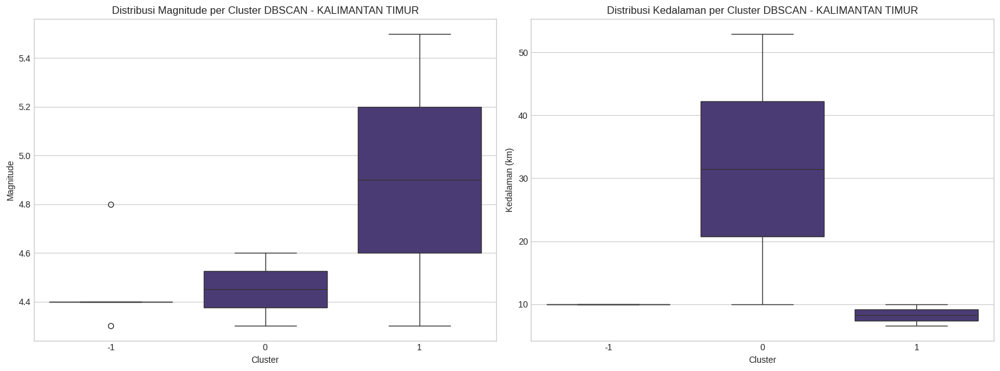


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km               
                    mean  min  max count     mean     min    max
optics_cluster                                                  
-1              4.400000  4.4  4.4     1   10.000  10.000  10.00
 0              4.450000  4.3  4.6     2   31.490  10.000  52.98
 1              4.733333  4.3  5.5     3    8.842   6.526  10.00
 2              4.500000  4.3  4.8     3   10.000  10.000  10.00


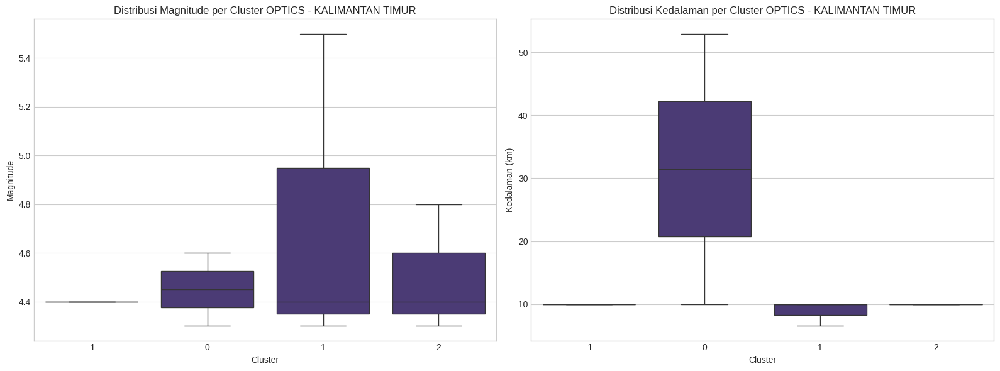


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0302


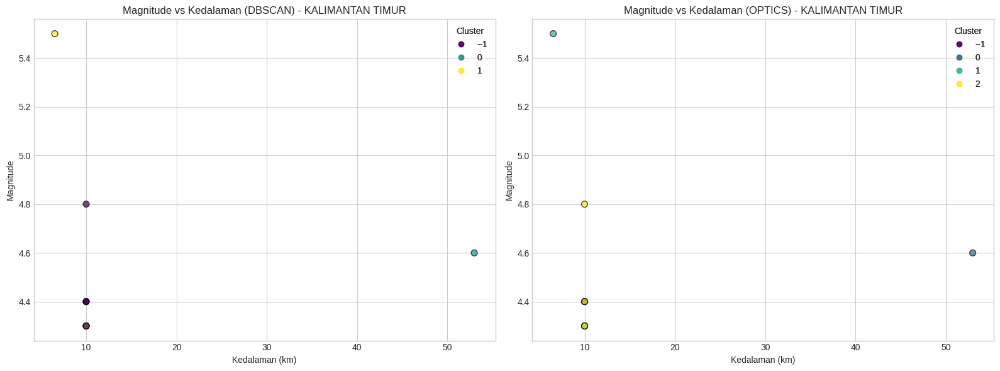


=== Analisis Karakteristik Cluster untuk Provinsi BALI ===

1. Karakteristik Cluster DBSCAN:
               magnitude                  depth_km                 
                    mean  min  max count      mean     min      max
dbscan_cluster                                                     
-1                  4.50  4.3  4.7     2   85.9335  10.000  161.867
 0                  4.70  4.6  4.9     4    9.9980   9.992   10.000
 1                  4.35  4.3  4.4     2  100.0790   9.018  191.140


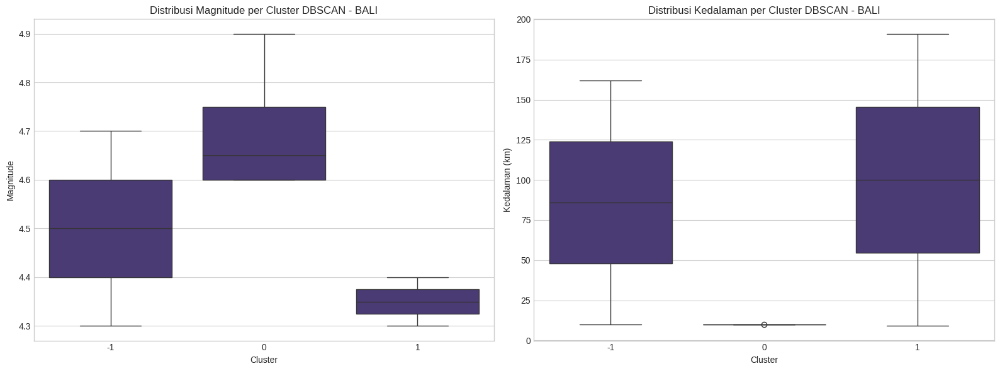


2. Karakteristik Cluster OPTICS:
               magnitude                  depth_km                 
                    mean  min  max count      mean     min      max
optics_cluster                                                     
0                   4.50  4.3  4.7     2   85.9335  10.000  161.867
1                   4.35  4.3  4.4     2  100.0790   9.018  191.140
2                   4.75  4.6  4.9     2   10.0000  10.000   10.000
3                   4.65  4.6  4.7     2    9.9960   9.992   10.000


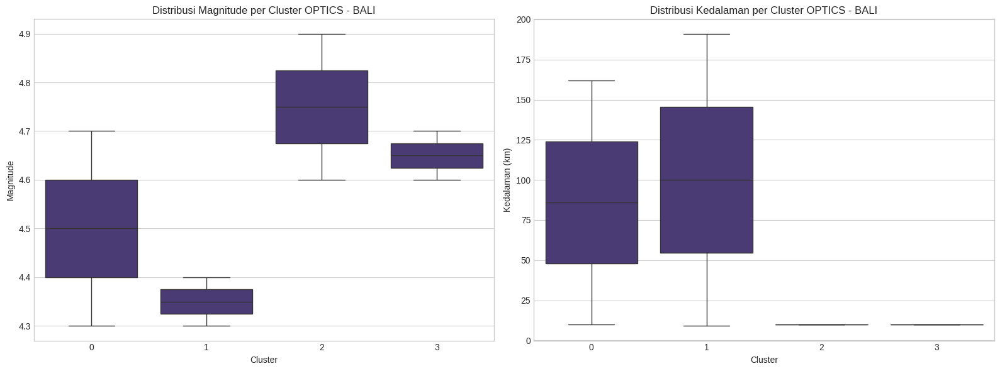


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.2288


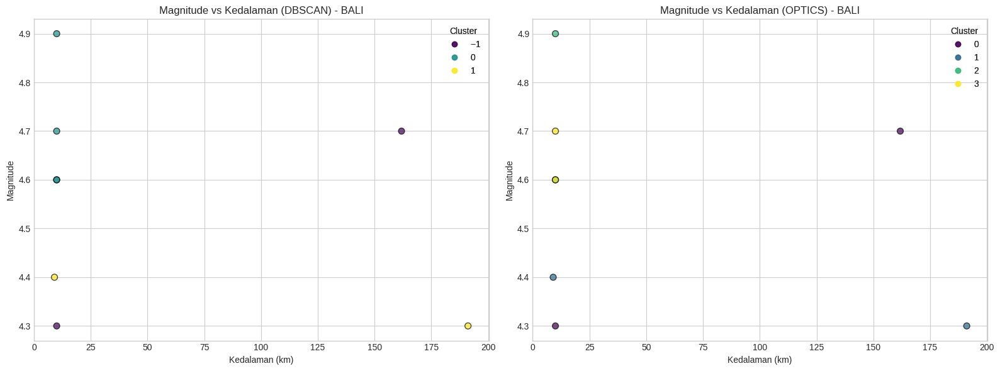


=== Analisis Karakteristik Cluster untuk Provinsi JAWA TENGAH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km                  
                    mean  min  max count     mean      min      max
dbscan_cluster                                                     
-1                  4.20  4.1  4.4     4  217.068  190.680  248.621
 0                  4.25  4.2  4.3     2  124.074  114.824  133.324
 1                  4.10  4.0  4.2     2   10.087    9.999   10.175


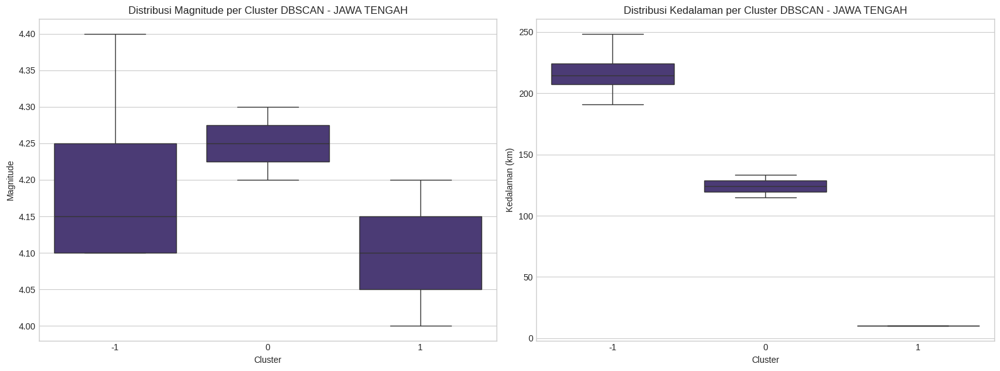


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                  
                    mean  min  max count       mean      min      max
optics_cluster                                                       
-1                   4.2  4.2  4.2     1  248.62100  248.621  248.621
 0                   4.3  4.2  4.4     3  146.27600  114.824  190.680
 1                   4.1  4.0  4.2     4  112.28625    9.999  216.170


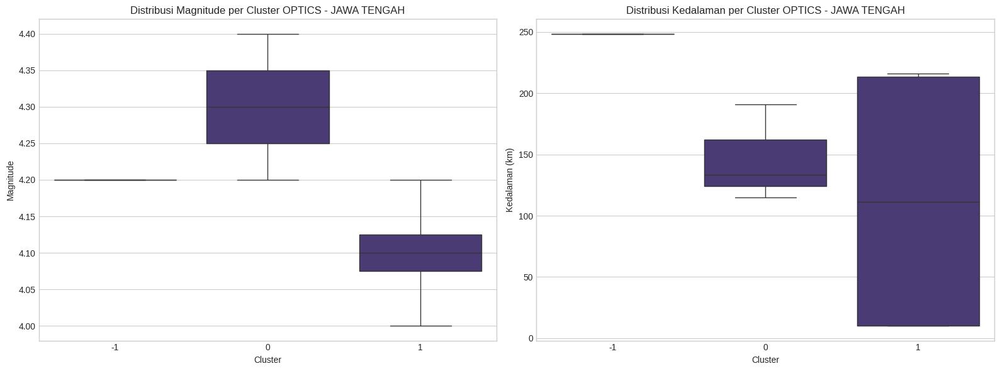


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.2571


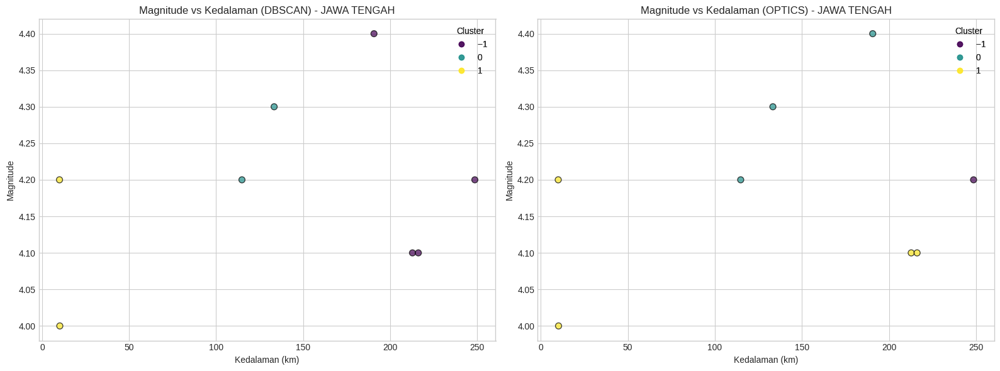


=== Analisis Karakteristik Cluster untuk Provinsi RIAU ===

1. Karakteristik Cluster DBSCAN:
               magnitude                  depth_km                  
                    mean  min  max count      mean      min      max
dbscan_cluster                                                      
-1                  4.40  4.4  4.4     1  194.6200  194.620  194.620
 0                  4.25  4.2  4.3     2  217.5140  212.711  222.317
 1                  4.45  3.9  5.0     2  132.6995   10.012  255.387


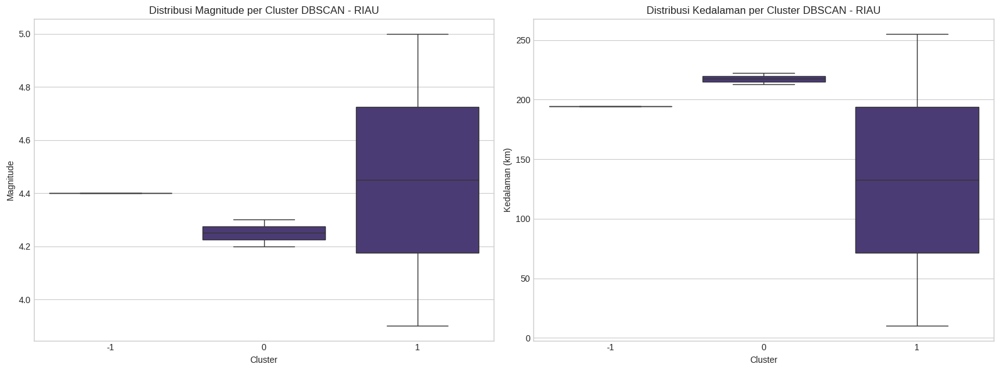


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
0               4.250000  4.2  4.3     2  217.514000  212.711  222.317
1               4.433333  3.9  5.0     3  153.339667   10.012  255.387


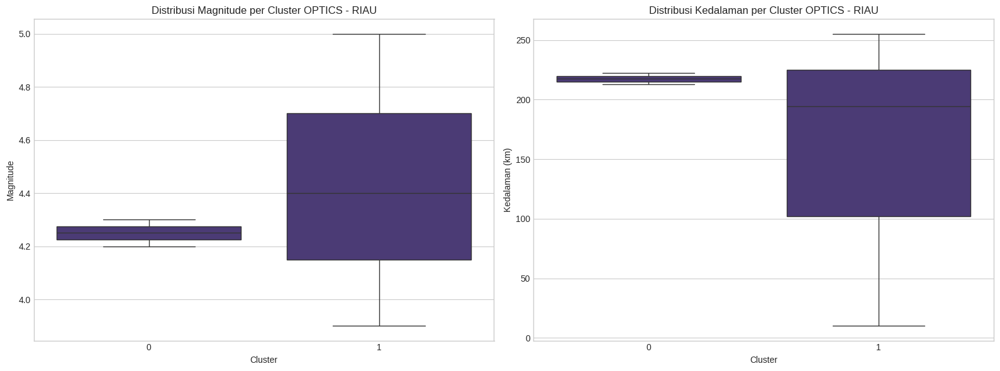


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.7612


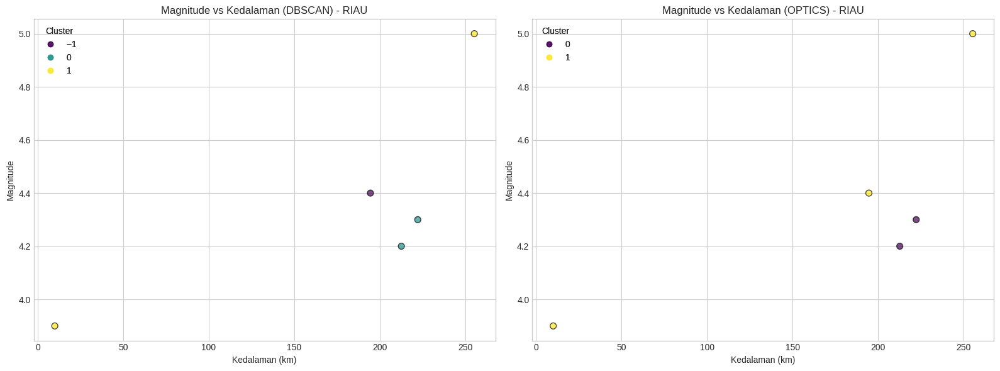


=== Analisis Karakteristik untuk Provinsi KALIMANTAN TENGAH ===

Provinsi KALIMANTAN TENGAH hanya memiliki 2 gempa, tidak cukup untuk analisis cluster.

Statistik dasar:
       magnitude   depth_km
count   2.000000   2.000000
mean    4.550000  10.403500
std     0.353553   0.570635
min     4.300000  10.000000
25%     4.425000  10.201750
50%     4.550000  10.403500
75%     4.675000  10.605250
max     4.800000  10.807000

=== Analisis Karakteristik untuk Provinsi KALIMANTAN SELATAN ===

Provinsi KALIMANTAN SELATAN hanya memiliki 2 gempa, tidak cukup untuk analisis cluster.

Statistik dasar:
       magnitude   depth_km
count   2.000000   2.000000
mean    4.500000  11.798500
std     0.565685   2.543463
min     4.100000  10.000000
25%     4.300000  10.899250
50%     4.500000  11.798500
75%     4.700000  12.697750
max     4.900000  13.597000

=== Analisis Karakteristik untuk Provinsi KALIMANTAN BARAT ===

Provinsi KALIMANTAN BARAT hanya memiliki 1 gempa, tidak cukup untuk analisis cluster.



In [ ]:
# Analisis karakteristik cluster untuk setiap provinsi
for province_name, province_results in clustering_results.items():
    analyze_cluster_characteristics(province_name, province_results)

## 7. Perbandingan Hasil Clustering DBSCAN dan OPTICS

In [ ]:
# Buat tabel perbandingan hasil clustering DBSCAN dan OPTICS
comparison_data = []

for province_name, province_results in clustering_results.items():
    dbscan_results = province_results['dbscan']
    optics_results = province_results['optics']

    comparison_data.append({
        'Provinsi': province_name,
        'Jumlah Gempa': len(province_results['data']),
        'DBSCAN Clusters': dbscan_results['n_clusters'],
        'DBSCAN Noise (%)': dbscan_results['n_noise'] / len(province_results['data']) * 100 if len(province_results['data']) > 0 else 0,
        'DBSCAN Silhouette': dbscan_results['silhouette'],
        'OPTICS Clusters': optics_results['n_clusters'],
        'OPTICS Noise (%)': optics_results['n_noise'] / len(province_results['data']) * 100 if len(province_results['data']) > 0 else 0,
        'OPTICS Silhouette': optics_results['silhouette']
    })

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values('Jumlah Gempa', ascending=False)

# Format nilai untuk tampilan yang lebih baik
comparison_df['DBSCAN Noise (%)'] = comparison_df['DBSCAN Noise (%)'].round(2)
comparison_df['OPTICS Noise (%)'] = comparison_df['OPTICS Noise (%)'].round(2)
comparison_df['DBSCAN Silhouette'] = comparison_df['DBSCAN Silhouette'].round(4)
comparison_df['OPTICS Silhouette'] = comparison_df['OPTICS Silhouette'].round(4)

# Tampilkan tabel perbandingan
print("Perbandingan Hasil Clustering DBSCAN dan OPTICS per Provinsi:")
comparison_df

Perbandingan Hasil Clustering DBSCAN dan OPTICS per Provinsi:


,Provinsi,Jumlah Gempa,DBSCAN Clusters,DBSCAN Noise (%),DBSCAN Silhouette,OPTICS Clusters,OPTICS Noise (%),OPTICS Silhouette
0,IRIAN JAYA TIMUR,385,7,62.60,0.6190,7,57.40,0.6818
1,MALUKU UTARA,130,2,46.92,0.8568,6,40.77,0.6974
2,MALUKU,124,2,33.06,0.8507,9,34.68,0.6753
3,NUSA TENGGARA TIMUR,96,4,75.00,0.8974,8,31.25,0.6555
4,SUMATERA UTARA,92,3,63.04,0.7559,6,51.09,0.7691
5,IRIAN JAYA TENGAH,90,2,85.56,0.9223,4,55.56,0.7909
6,SULAWESI TENGAH,73,2,80.82,0.8181,5,28.77,0.5668
7,IRIAN JAYA BARAT,72,6,70.83,0.8378,6,19.44,0.6529
8,SULAWESI UTARA,70,2,30.00,0.9559,7,35.71,0.6363
9,NUSATENGGARA BARAT,69,2,44.93,0.8260,5,43.48,0.5700


<Figure size 1500x1000 with 0 Axes>

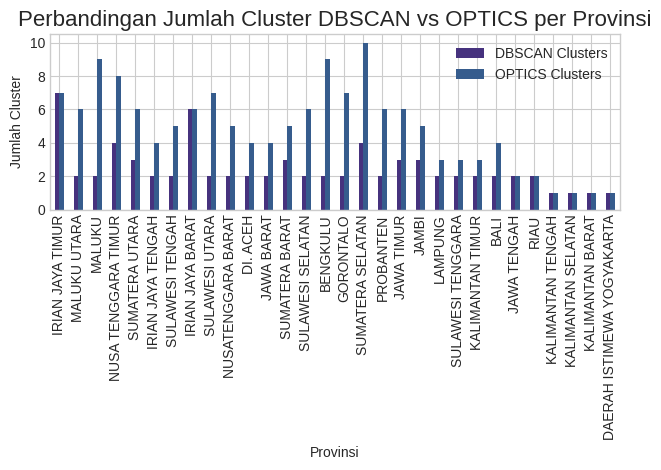

In [ ]:
# Visualisasi perbandingan jumlah cluster
plt.figure(figsize=(15, 10))
comparison_df.plot(x='Provinsi', y=['DBSCAN Clusters', 'OPTICS Clusters'], kind='bar')
plt.title('Perbandingan Jumlah Cluster DBSCAN vs OPTICS per Provinsi', fontsize=16)
plt.xlabel('Provinsi')
plt.ylabel('Jumlah Cluster')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

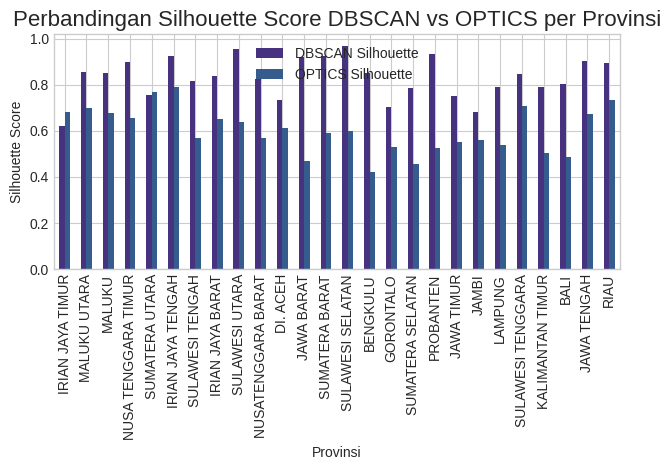

In [ ]:
# Visualisasi perbandingan silhouette score
# Filter provinsi dengan silhouette score valid (> -1)
valid_silhouette = comparison_df[(comparison_df['DBSCAN Silhouette'] > -1) | (comparison_df['OPTICS Silhouette'] > -1)]

plt.figure(figsize=(15, 10))
valid_silhouette.plot(x='Provinsi', y=['DBSCAN Silhouette', 'OPTICS Silhouette'], kind='bar')
plt.title('Perbandingan Silhouette Score DBSCAN vs OPTICS per Provinsi', fontsize=16)
plt.xlabel('Provinsi')
plt.ylabel('Silhouette Score')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Perbandingan Rata-rata Hasil Clustering DBSCAN dan OPTICS (hanya provinsi dengan cluster >= 2):
  Algoritma  Rata-rata Jumlah Cluster  Rata-rata Persentase Noise (%)  \
0    DBSCAN                  2.653846                           52.33   
1    OPTICS                  5.461538                           23.63   

   Rata-rata Silhouette Score  
0                      0.8316  
1                      0.6020  


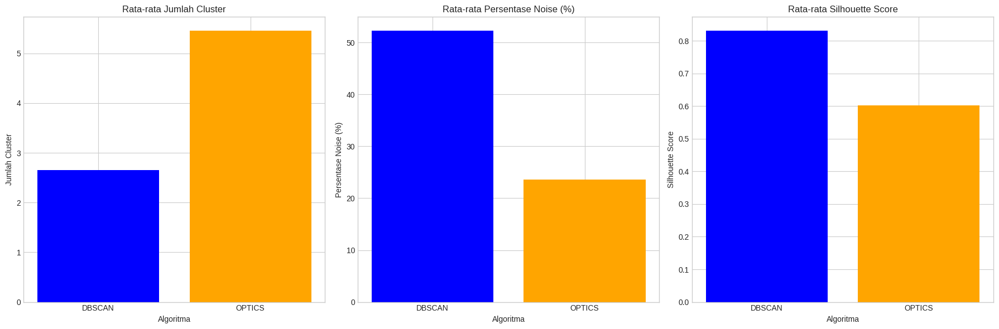

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Buat tabel perbandingan hasil clustering DBSCAN dan OPTICS
comparison_data = []

# Inisialisasi variabel untuk menghitung rata-rata
total_dbscan_clusters = 0
total_dbscan_noise = 0
total_dbscan_silhouette = 0
total_optics_clusters = 0
total_optics_noise = 0
total_optics_silhouette = 0
total_earthquakes = 0
count_provinces = 0

for province_name, province_results in clustering_results.items():
    dbscan_results = province_results['dbscan']
    optics_results = province_results['optics']
    num_earthquakes = len(province_results['data'])

    # Tambahkan data ke tabel perbandingan
    comparison_data.append({
        'Provinsi': province_name,
        'Jumlah Gempa': num_earthquakes,
        'DBSCAN Clusters': dbscan_results['n_clusters'],
        'DBSCAN Noise (%)': dbscan_results['n_noise'] / num_earthquakes * 100 if num_earthquakes > 0 else 0,
        'DBSCAN Silhouette': dbscan_results['silhouette'],
        'OPTICS Clusters': optics_results['n_clusters'],
        'OPTICS Noise (%)': optics_results['n_noise'] / num_earthquakes * 100 if num_earthquakes > 0 else 0,
        'OPTICS Silhouette': optics_results['silhouette']
    })

    # Hanya hitung rata-rata untuk provinsi dengan jumlah cluster >= 2
    if dbscan_results['n_clusters'] >= 2 and optics_results['n_clusters'] >= 2:
        total_dbscan_clusters += dbscan_results['n_clusters']
        total_dbscan_noise += dbscan_results['n_noise'] / num_earthquakes * 100 if num_earthquakes > 0 else 0
        total_dbscan_silhouette += dbscan_results['silhouette']
        total_optics_clusters += optics_results['n_clusters']
        total_optics_noise += optics_results['n_noise'] / num_earthquakes * 100 if num_earthquakes > 0 else 0
        total_optics_silhouette += optics_results['silhouette']
        total_earthquakes += num_earthquakes
        count_provinces += 1

# Hitung rata-rata
if count_provinces > 0:
    average_dbscan_clusters = total_dbscan_clusters / count_provinces
    average_dbscan_noise = total_dbscan_noise / count_provinces
    average_dbscan_silhouette = total_dbscan_silhouette / count_provinces
    average_optics_clusters = total_optics_clusters / count_provinces
    average_optics_noise = total_optics_noise / count_provinces
    average_optics_silhouette = total_optics_silhouette / count_provinces
else:
    average_dbscan_clusters = 0
    average_dbscan_noise = 0
    average_dbscan_silhouette = 0
    average_optics_clusters = 0
    average_optics_noise = 0
    average_optics_silhouette = 0

# Buat DataFrame untuk hasil perbandingan rata-rata
average_comparison_data = [
    {
        'Algoritma': 'DBSCAN',
        'Rata-rata Jumlah Cluster': average_dbscan_clusters,
        'Rata-rata Persentase Noise (%)': average_dbscan_noise,
        'Rata-rata Silhouette Score': average_dbscan_silhouette
    },
    {
        'Algoritma': 'OPTICS',
        'Rata-rata Jumlah Cluster': average_optics_clusters,
        'Rata-rata Persentase Noise (%)': average_optics_noise,
        'Rata-rata Silhouette Score': average_optics_silhouette
    }
]

average_comparison_df = pd.DataFrame(average_comparison_data)

# Format nilai untuk tampilan yang lebih baik
average_comparison_df['Rata-rata Persentase Noise (%)'] = average_comparison_df['Rata-rata Persentase Noise (%)'].round(2)
average_comparison_df['Rata-rata Silhouette Score'] = average_comparison_df['Rata-rata Silhouette Score'].round(4)

# Tampilkan tabel perbandingan rata-rata
print("Perbandingan Rata-rata Hasil Clustering DBSCAN dan OPTICS (hanya provinsi dengan cluster >= 2):")
print(average_comparison_df)

# Visualisasi hasil perbandingan
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Bar chart untuk jumlah cluster
axes[0].bar(average_comparison_df['Algoritma'], average_comparison_df['Rata-rata Jumlah Cluster'], color=['blue', 'orange'])
axes[0].set_title('Rata-rata Jumlah Cluster')
axes[0].set_ylabel('Jumlah Cluster')
axes[0].set_xlabel('Algoritma')

# Bar chart untuk persentase noise
axes[1].bar(average_comparison_df['Algoritma'], average_comparison_df['Rata-rata Persentase Noise (%)'], color=['blue', 'orange'])
axes[1].set_title('Rata-rata Persentase Noise (%)')
axes[1].set_ylabel('Persentase Noise (%)')
axes[1].set_xlabel('Algoritma')

# Bar chart untuk silhouette score
axes[2].bar(average_comparison_df['Algoritma'], average_comparison_df['Rata-rata Silhouette Score'], color=['blue', 'orange'])
axes[2].set_title('Rata-rata Silhouette Score')
axes[2].set_ylabel('Silhouette Score')
axes[2].set_xlabel('Algoritma')

plt.tight_layout()
plt.show()

## 8. Kesimpulan dan Rekomendasi

### 8.1 Kesimpulan

Berdasarkan analisis clustering spasial per provinsi yang telah dilakukan, dapat disimpulkan bahwa:

1. **Distribusi Gempa Bumi**: Gempa bumi di Indonesia tidak terdistribusi secara merata di seluruh provinsi. Beberapa provinsi seperti Maluku, Papua, dan Sulawesi memiliki frekuensi gempa yang lebih tinggi dibandingkan provinsi lainnya.

2. **Pola Clustering**: Algoritma DBSCAN dan OPTICS berhasil mengidentifikasi cluster gempa bumi di setiap provinsi dengan karakteristik yang berbeda-beda. Pola clustering ini mencerminkan aktivitas seismik yang berbeda di setiap wilayah.

3. **Perbandingan DBSCAN dan OPTICS**:
   - DBSCAN cenderung menghasilkan cluster yang lebih terdefinisi dengan baik, tetapi sensitif terhadap parameter eps dan min_samples.
   - OPTICS lebih fleksibel dalam mendeteksi cluster dengan densitas yang bervariasi, tetapi terkadang menghasilkan lebih banyak noise points.

4. **Karakteristik Cluster**:
   - Beberapa cluster menunjukkan korelasi antara magnitude dan kedalaman gempa.
   - Cluster di zona subduksi umumnya memiliki kedalaman yang lebih bervariasi.
   - Cluster di sekitar patahan aktif cenderung memiliki kedalaman yang lebih dangkal.

5. **Provinsi dengan Aktivitas Seismik Rendah**:
   - Beberapa provinsi seperti Kalimantan Barat, Kalimantan Tengah, dan Kalimantan Timur memiliki aktivitas seismik yang sangat rendah.
   - Provinsi-provinsi di Jawa memiliki pola gempa yang berbeda dibandingkan dengan provinsi di Indonesia Timur.

### 8.2 Rekomendasi

Berdasarkan hasil analisis, berikut adalah beberapa rekomendasi untuk penelitian lebih lanjut:

1. **Analisis Temporal**: Menambahkan dimensi waktu untuk menganalisis evolusi cluster gempa bumi dari waktu ke waktu.

2. **Integrasi dengan Data Geologi**: Mengintegrasikan hasil clustering dengan data geologi seperti patahan aktif, zona subduksi, dan aktivitas vulkanik untuk interpretasi yang lebih komprehensif.

3. **Optimasi Parameter**: Mengembangkan metode yang lebih sistematis untuk menentukan parameter optimal DBSCAN dan OPTICS untuk setiap provinsi.

4. **Analisis Multi-fitur**: Menggabungkan fitur spasial (longitude, latitude) dengan fitur non-spasial (magnitude, kedalaman) dalam proses clustering untuk menghasilkan cluster yang lebih bermakna.

5. **Prediksi Risiko**: Menggunakan hasil clustering sebagai input untuk model prediksi risiko gempa bumi di setiap provinsi.

6. **Analisis Provinsi dengan Aktivitas Seismik Rendah**: Melakukan penelitian lebih lanjut untuk provinsi-provinsi dengan aktivitas seismik rendah untuk memahami faktor-faktor geologis yang menyebabkan rendahnya aktivitas seismik.

## 9. Simpan Hasil Clustering

In [ ]:
# Gabungkan hasil clustering dari semua provinsi
all_clustered_data = []

for province_name, province_results in clustering_results.items():
    province_data = province_results['data'].copy()
    all_clustered_data.append(province_data)

# Gabungkan dengan data gempa yang tidak memiliki provinsi (di luar batas Indonesia)
non_province_data = gdf_earthquakes_with_province[gdf_earthquakes_with_province['Propinsi'].isna()].copy()
non_province_data['dbscan_cluster'] = -2  # Special label for points outside province boundaries
non_province_data['optics_cluster'] = -2  # Special label for points outside province boundaries
all_clustered_data.append(non_province_data)

# Gabungkan semua data
final_data = pd.concat(all_clustered_data)

# Simpan hasil ke CSV
final_data.to_csv('gempa_clustering_per_provinsi_results.csv', index=False)

print(f"Hasil clustering telah disimpan ke 'gempa_clustering_per_provinsi_results.csv'")

Hasil clustering telah disimpan ke 'gempa_clustering_per_provinsi_results.csv'


## 10. Visualisasi Akhir: Peta Clustering Seluruh Indonesia

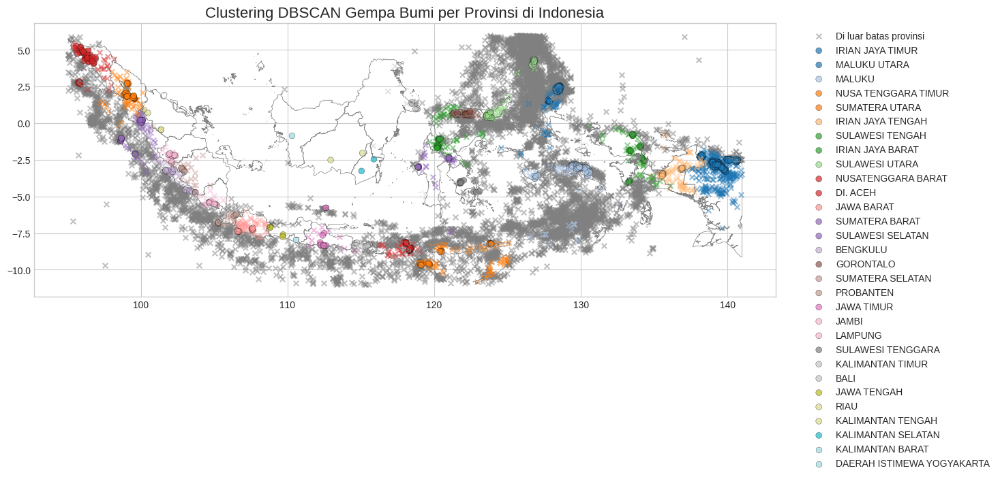

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Visualisasi hasil clustering DBSCAN untuk seluruh Indonesia
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plot batas provinsi
provinces.boundary.plot(ax=ax, linewidth=0.5, color='gray')

# Plot gempa dengan warna berdasarkan provinsi dan pola berdasarkan cluster
# Gunakan colormap yang berbeda untuk setiap provinsi
province_list = final_data['Propinsi'].dropna().unique()
province_colors = plt.cm.tab20(np.linspace(0, 1, len(province_list)))
province_color_map = {province: color for province, color in zip(province_list, province_colors)}

# Dictionary untuk menyimpan handle dan label yang telah dibuat
handles_dict = {}

# Plot gempa di luar batas provinsi
outside_mask = final_data['Propinsi'].isna()
outside_handle = ax.scatter(
    final_data.loc[outside_mask, 'longitude'],
    final_data.loc[outside_mask, 'latitude'],
    c='gray', s=30, alpha=0.5, marker='x',
)
handles_dict['Di luar batas provinsi'] = outside_handle

# Plot gempa untuk setiap provinsi dengan warna berbeda
for province in province_list:
    province_mask = final_data['Propinsi'] == province
    province_data = final_data[province_mask]

    # Plot noise points
    noise_mask = province_data['dbscan_cluster'] == -1
    if noise_mask.sum() > 0:
        ax.scatter(
            province_data.loc[noise_mask, 'longitude'],
            province_data.loc[noise_mask, 'latitude'],
            c=province_color_map[province], s=30, alpha=0.5, marker='x',
        )

    # Plot cluster points
    cluster_mask = province_data['dbscan_cluster'] != -1
    if cluster_mask.sum() > 0:
        scatter = ax.scatter(
            province_data.loc[cluster_mask, 'longitude'],
            province_data.loc[cluster_mask, 'latitude'],
            c=[province_color_map[province]] * cluster_mask.sum(), s=40, alpha=0.7, marker='o',
            edgecolor='k', linewidth=0.3,
        )
        handles_dict[province] = scatter

# Tambahkan judul dan legenda
ax.set_title('Clustering DBSCAN Gempa Bumi per Provinsi di Indonesia', fontsize=16)

# Buat legenda dari dictionary handle
handles = list(handles_dict.values())
labels = list(handles_dict.keys())

ax.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.3, 1))

plt.tight_layout()
plt.savefig('clustering_dbscan_per_provinsi.png', dpi=300, bbox_inches='tight')
plt.show()

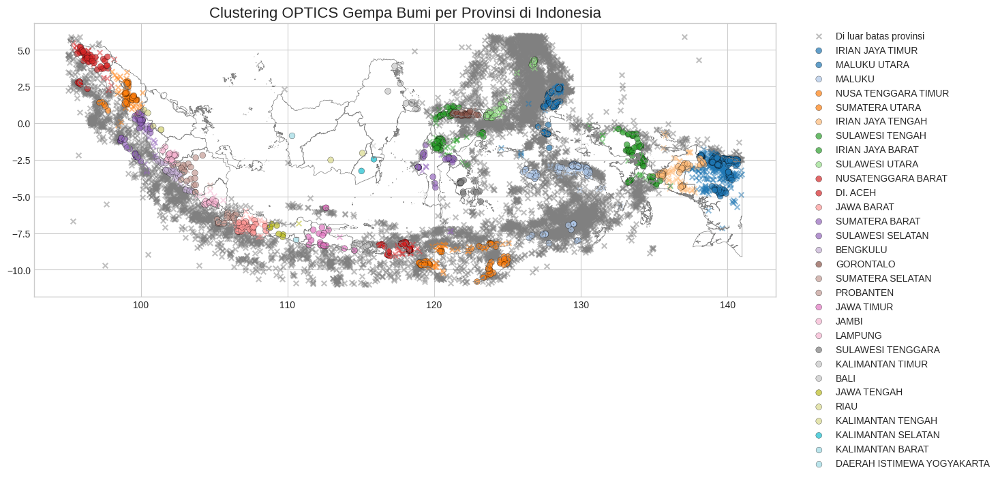

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Visualisasi hasil clustering OPTICS untuk seluruh Indonesia
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plot batas provinsi
provinces.boundary.plot(ax=ax, linewidth=0.5, color='gray')

# Plot gempa dengan warna berdasarkan provinsi dan pola berdasarkan cluster
# Gunakan colormap yang berbeda untuk setiap provinsi
province_list = final_data['Propinsi'].dropna().unique()
province_colors = plt.cm.tab20(np.linspace(0, 1, len(province_list)))
province_color_map = {province: color for province, color in zip(province_list, province_colors)}

# Dictionary untuk menyimpan handle dan label yang telah dibuat
handles_dict = {}

# Plot gempa di luar batas provinsi
outside_mask = final_data['Propinsi'].isna()
outside_handle = ax.scatter(
    final_data.loc[outside_mask, 'longitude'],
    final_data.loc[outside_mask, 'latitude'],
    c='gray', s=30, alpha=0.5, marker='x',
)
handles_dict['Di luar batas provinsi'] = outside_handle

# Plot gempa untuk setiap provinsi dengan warna berbeda
for province in province_list:
    province_mask = final_data['Propinsi'] == province
    province_data = final_data[province_mask]

    # Plot noise points
    noise_mask = province_data['optics_cluster'] == -1
    if noise_mask.sum() > 0:
        ax.scatter(
            province_data.loc[noise_mask, 'longitude'],
            province_data.loc[noise_mask, 'latitude'],
            c=province_color_map[province], s=30, alpha=0.5, marker='x',
        )

    # Plot cluster points
    cluster_mask = province_data['optics_cluster'] != -1
    if cluster_mask.sum() > 0:
        scatter = ax.scatter(
            province_data.loc[cluster_mask, 'longitude'],
            province_data.loc[cluster_mask, 'latitude'],
            c=[province_color_map[province]] * cluster_mask.sum(), s=40, alpha=0.7, marker='o',
            edgecolor='k', linewidth=0.3,
        )
        handles_dict[province] = scatter

# Tambahkan judul dan legenda
ax.set_title('Clustering OPTICS Gempa Bumi per Provinsi di Indonesia', fontsize=16)

# Buat legenda dari dictionary handle
handles = list(handles_dict.values())
labels = list(handles_dict.keys())

ax.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.3, 1))

plt.tight_layout()
plt.savefig('clustering_optics_per_provinsi.png', dpi=300, bbox_inches='tight')
plt.show()